# Bank Marketing Customer Segmentation


In [63]:
# Importing libraries
import os
import math
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from typing import Dict, List, Tuple, Optional

In [64]:
# Setting the link for the dataset
url = 'https://archive.ics.uci.edu/static/public/222/bank+marketing.zip'

In [65]:
# Downloading the zip file
!wget --no-check-certificate {url}

--2025-08-25 11:26:36--  https://archive.ics.uci.edu/static/public/222/bank+marketing.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
  Issued certificate has expired.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘bank+marketing.zip.1’

bank+marketing.zip.     [  <=>               ] 999.85K  2.74MB/s    in 0.4s    

2025-08-25 11:26:37 (2.74 MB/s) - ‘bank+marketing.zip.1’ saved [1023843]



In [66]:
# Unzip the downloaded file
!unzip bank+marketing.zip

Archive:  bank+marketing.zip
replace bank.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
 extracting: bank.zip                
 extracting: bank-additional.zip     


In [67]:
# Extracting dataset
!unzip bank-additional.zip

Archive:  bank-additional.zip
replace bank-additional/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: bank-additional/.DS_Store  
  inflating: __MACOSX/bank-additional/._.DS_Store  
  inflating: bank-additional/.Rhistory  
  inflating: bank-additional/bank-additional-full.csv  
  inflating: bank-additional/bank-additional-names.txt  
  inflating: bank-additional/bank-additional.csv  
  inflating: __MACOSX/._bank-additional  


In [68]:
# Loading the dataset
Bank = pd.read_csv('bank-additional/bank-additional.csv', sep=';')

In [69]:
# Printing the total rows and columns of the dataset
Bank.shape

(4119, 21)

In [70]:
# Printing the columns of the data
print(Bank.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')


In [71]:
# Printing the first few rows of the dataset
Bank.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
1,39,services,single,high.school,no,no,no,telephone,may,fri,...,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,...,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no


In [72]:
# Printing the last few rows of the dataset
Bank.tail()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
4114,30,admin.,married,basic.6y,no,yes,yes,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,no
4115,39,admin.,married,high.school,no,yes,no,telephone,jul,fri,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.959,5228.1,no
4116,27,student,single,high.school,no,no,no,cellular,may,mon,...,2,999,1,failure,-1.8,92.893,-46.2,1.354,5099.1,no
4117,58,admin.,married,high.school,no,no,no,cellular,aug,fri,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
4118,34,management,single,high.school,no,yes,no,cellular,nov,wed,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8,no


In [73]:
# Checking the missing values in the dataset
Bank.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0


In [74]:
# Printing the summary statistics of the data
Bank.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000
mean,40.113620,256.788055,2.537266,960.422190,0.190337,0.084972,93.579704,-40.499102,3.621356,5166.481695
std,10.313362,254.703736,2.568159,191.922786,0.541788,1.563114,0.579349,4.594578,1.733591,73.667904
min,18.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.635000,4963.600000
25%,32.000000,103.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.334000,5099.100000
50%,38.000000,181.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.000000,317.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,88.000000,3643.000000,35.000000,999.000000,6.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [75]:
# Selecting numerical columns
numerical_cols = Bank.select_dtypes(include=np.number).columns

In [76]:
# Selecting categorical columns
categorical_cols = Bank.select_dtypes(include='object').columns

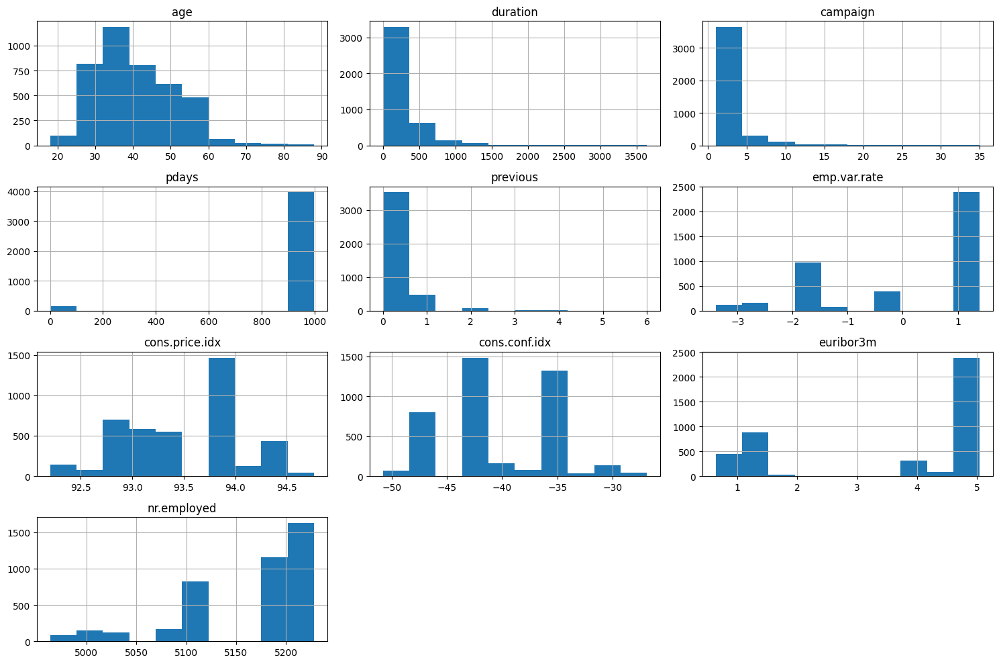

In [77]:
# Plotting the distribution of numerical features using histograms
Bank[numerical_cols].hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

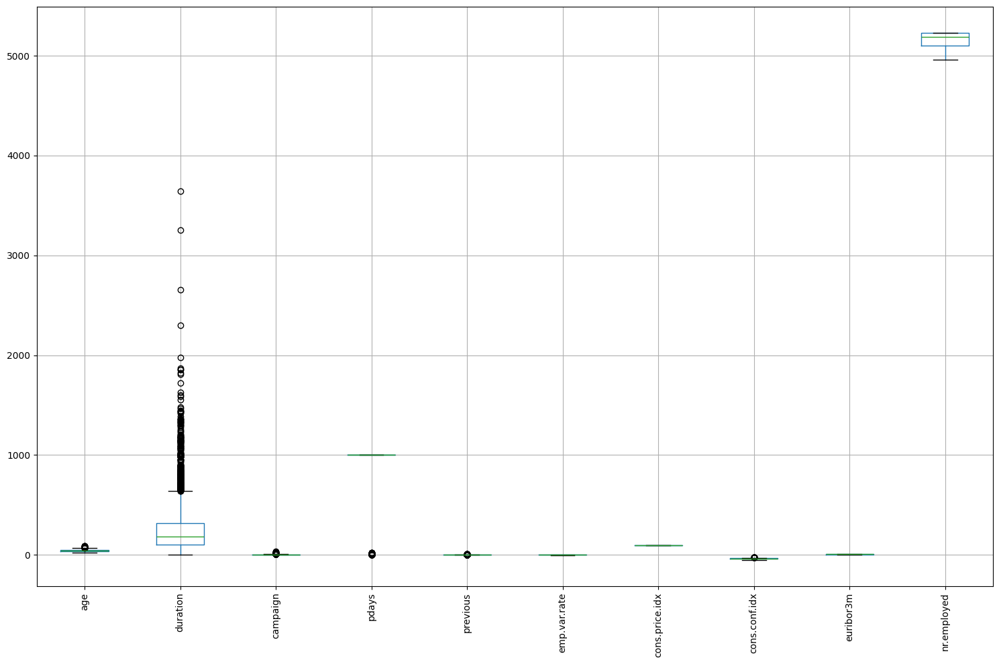

In [78]:
# Visualising the distributions of numerical features and identifying outliers using box plots
plt.figure(figsize=(15, 10))
Bank[numerical_cols].boxplot()
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

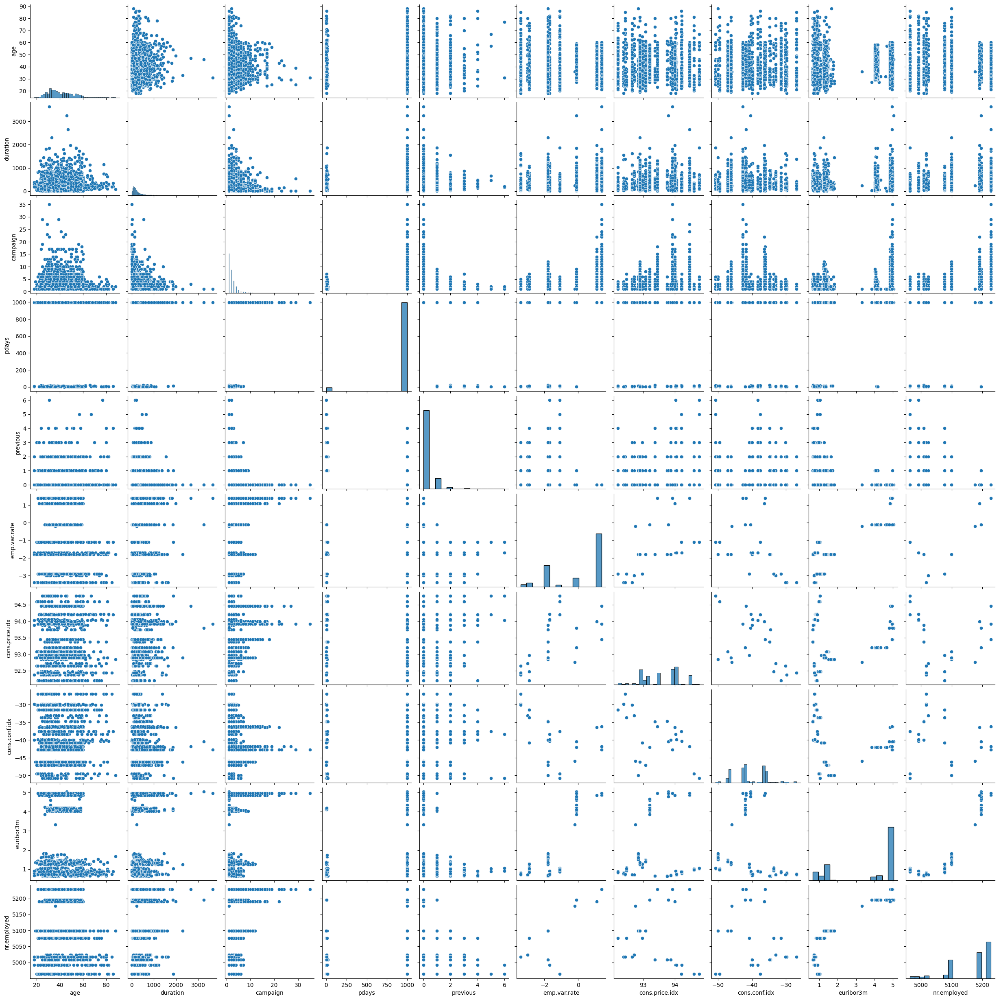

In [79]:
# Visualising the relationships between pairs of numerical variables using a pair plot
sns.pairplot(Bank[numerical_cols])
plt.show()

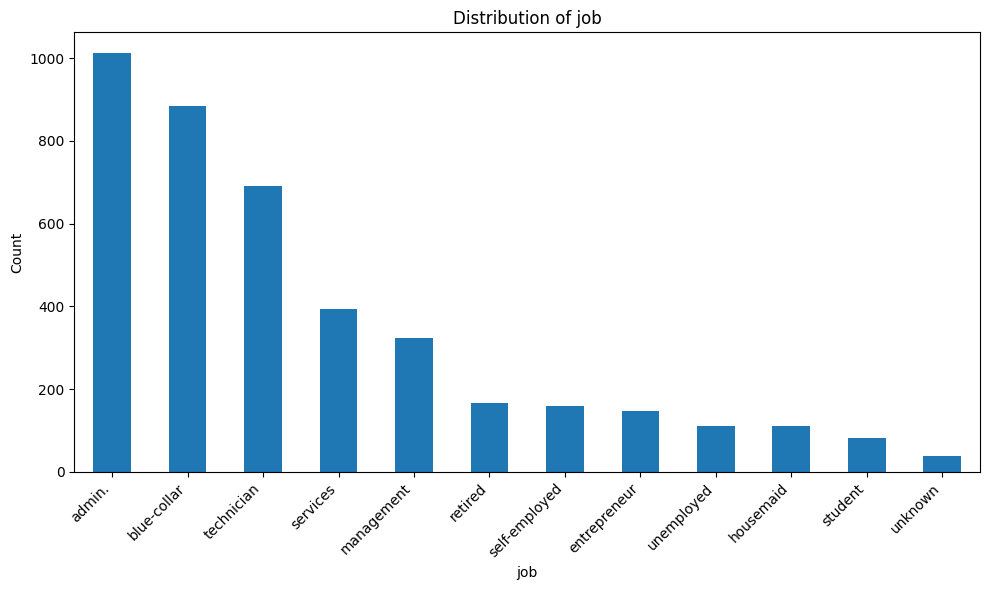

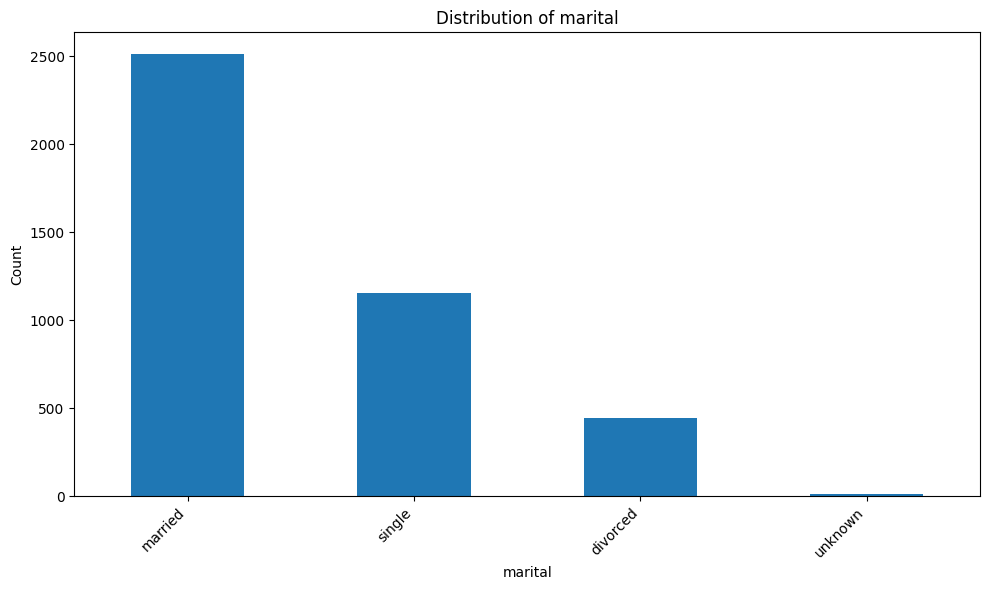

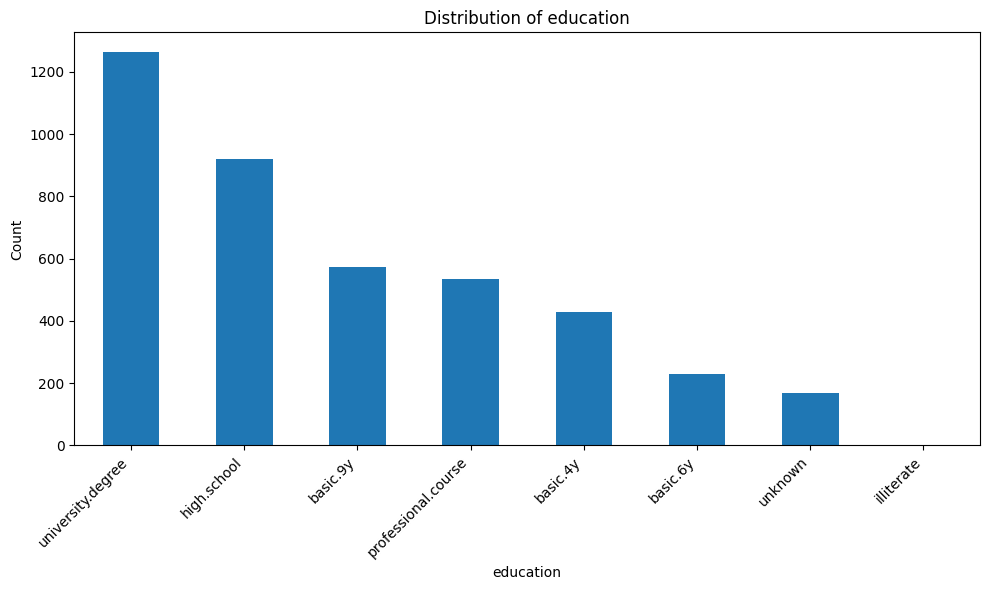

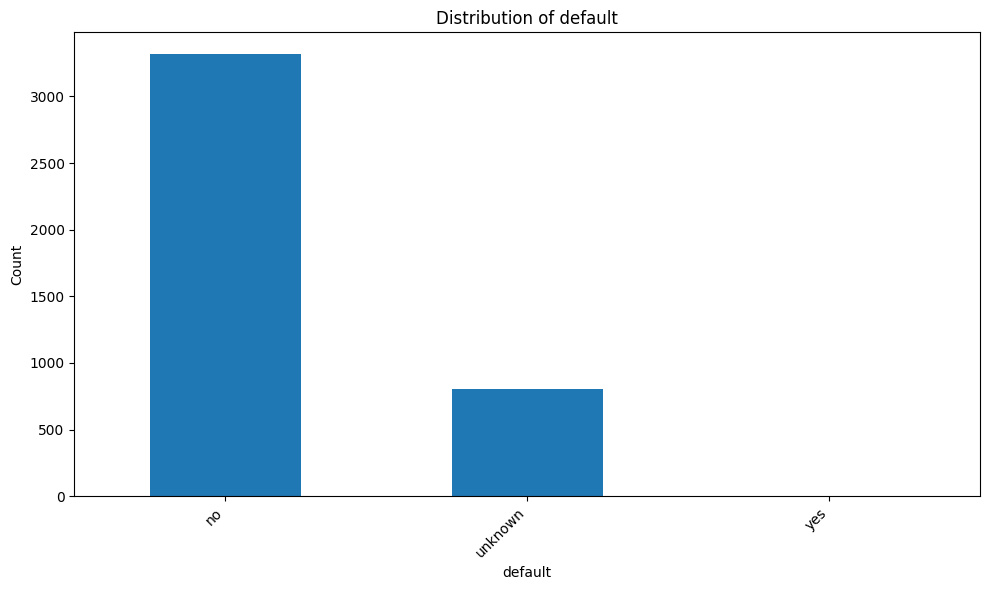

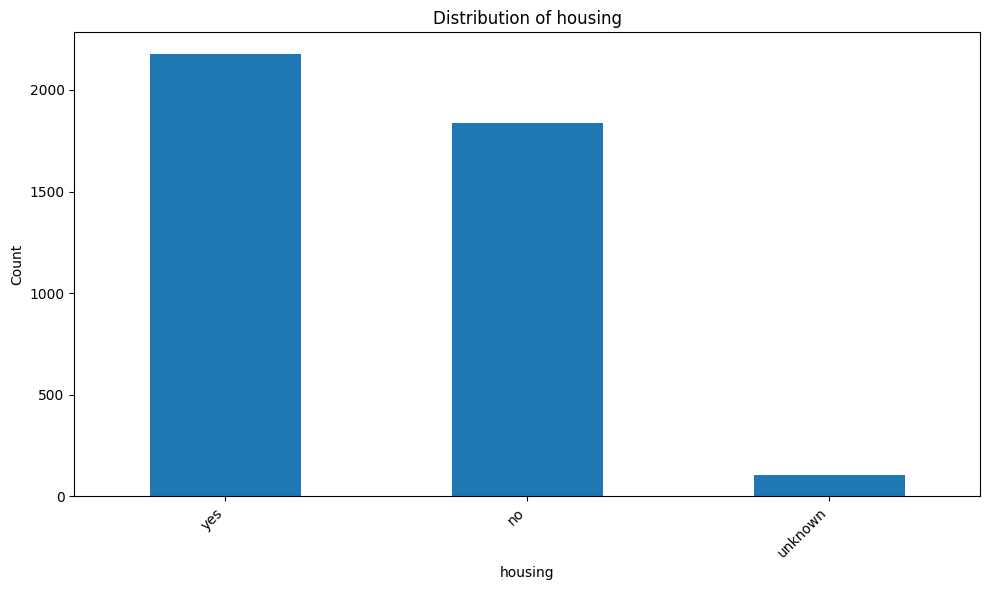

...

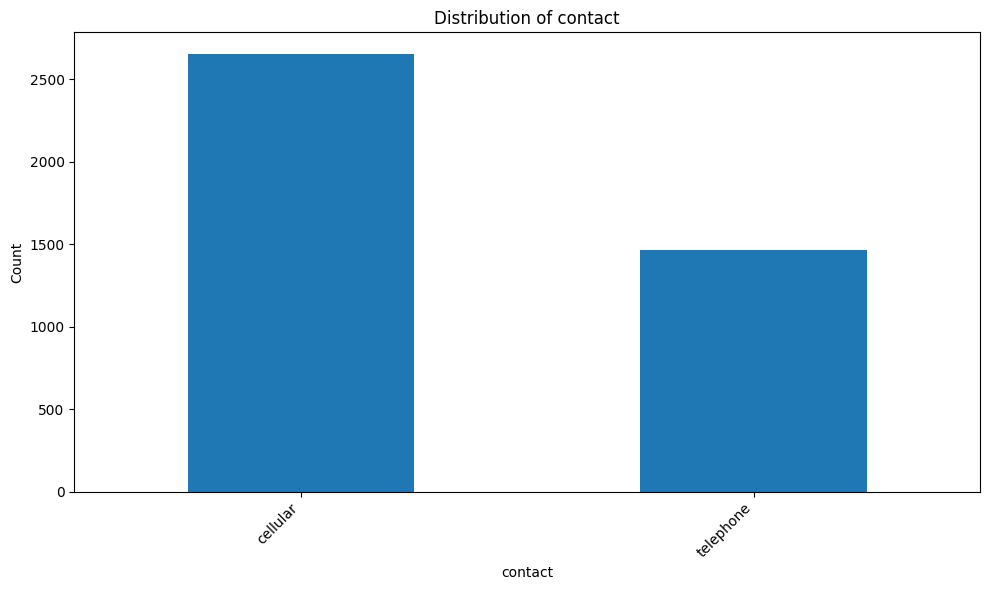

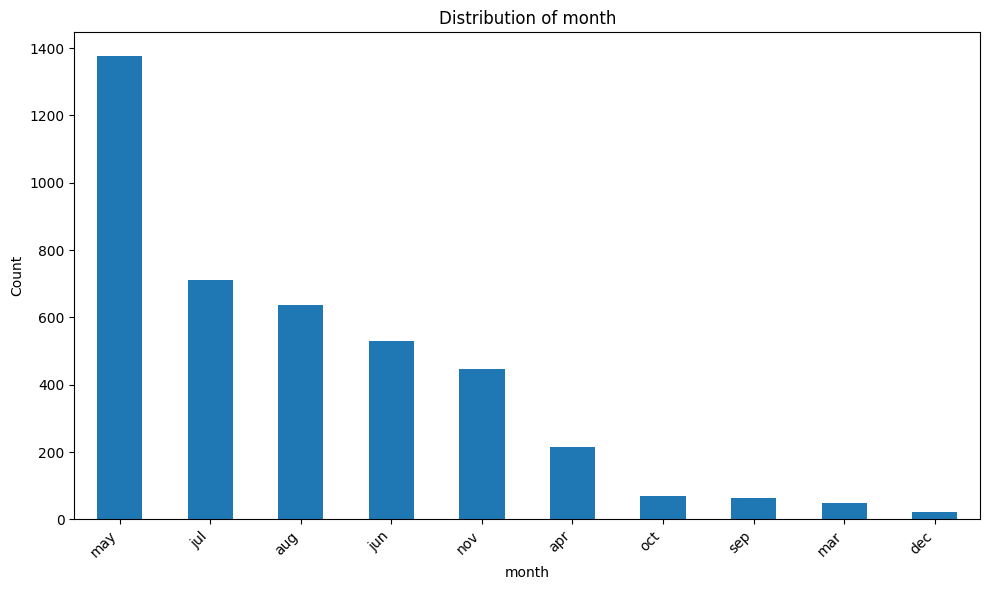

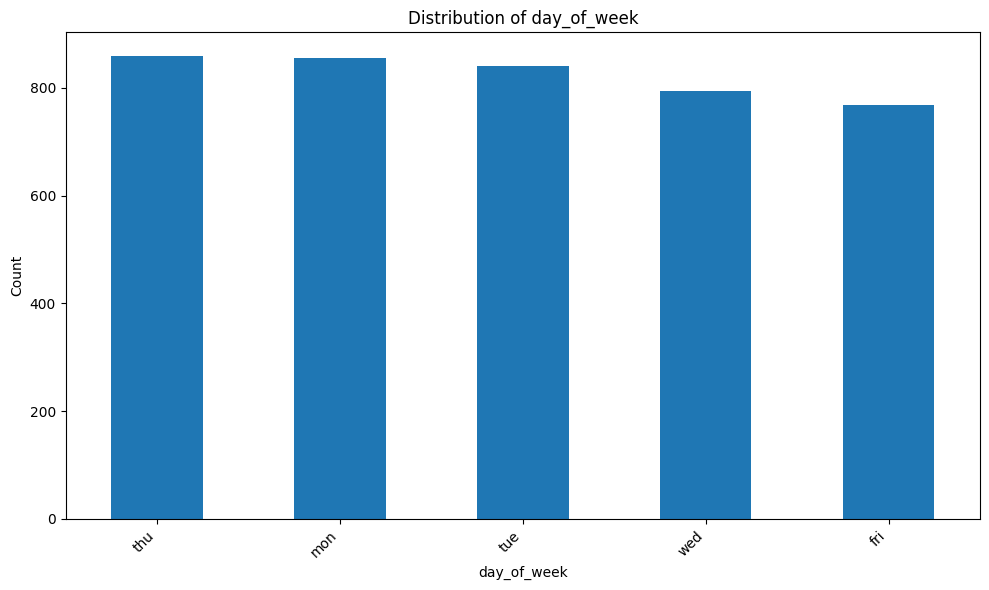

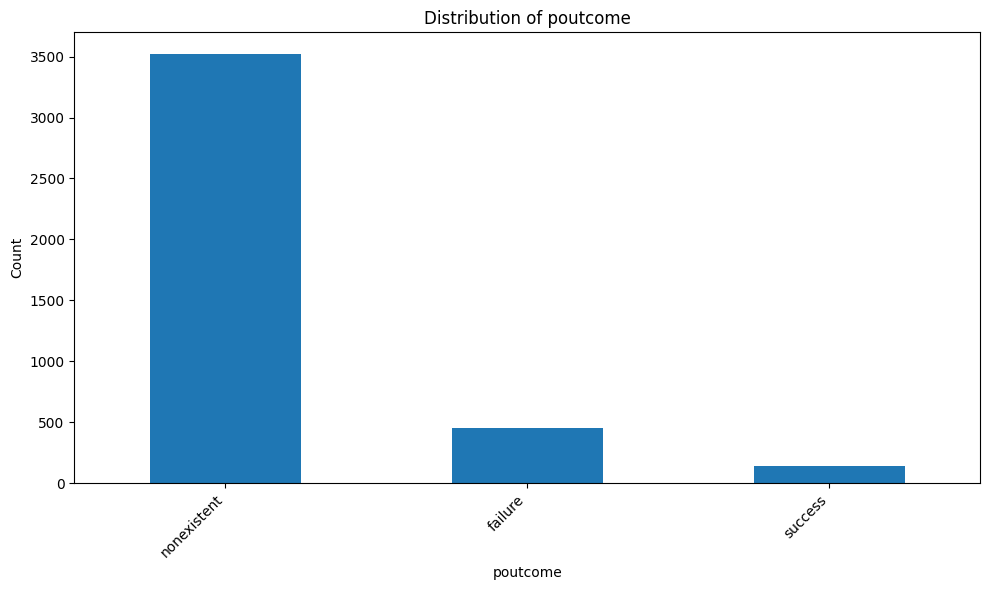

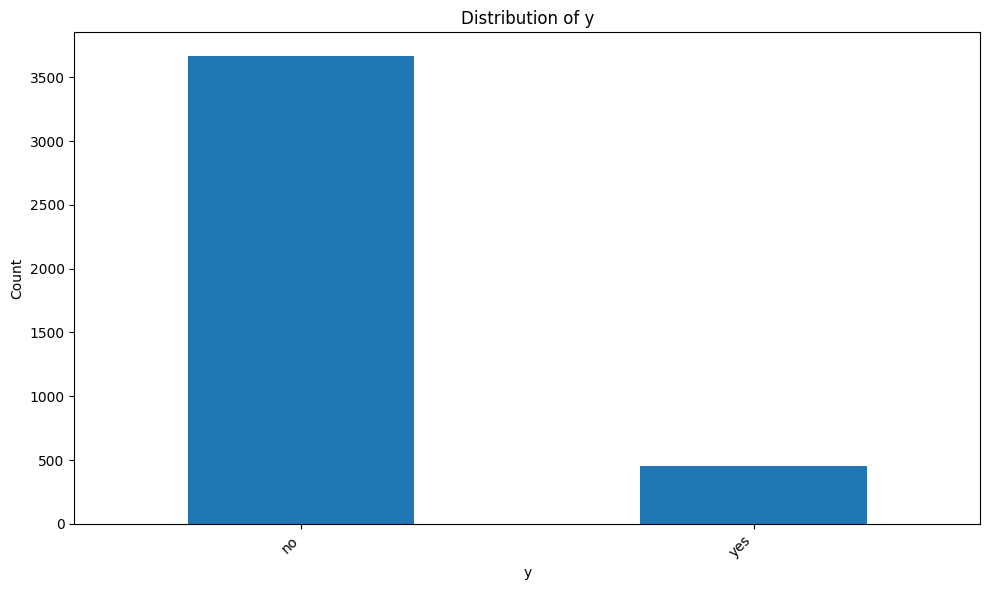

In [80]:
# Plotting the distribution of each categorical feature using bar plots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    Bank[col].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

<Figure size 1000x600 with 0 Axes>

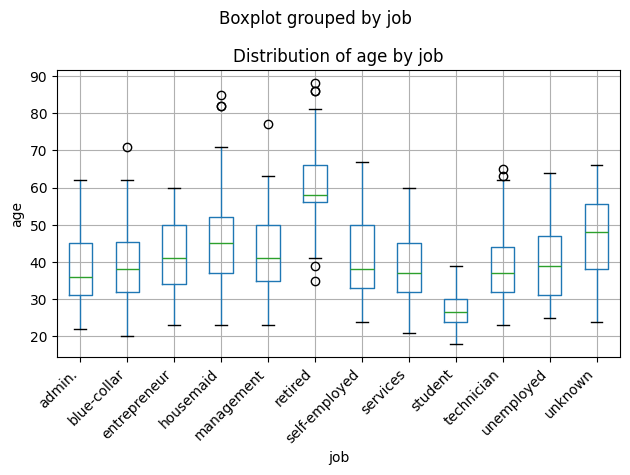

<Figure size 1000x600 with 0 Axes>

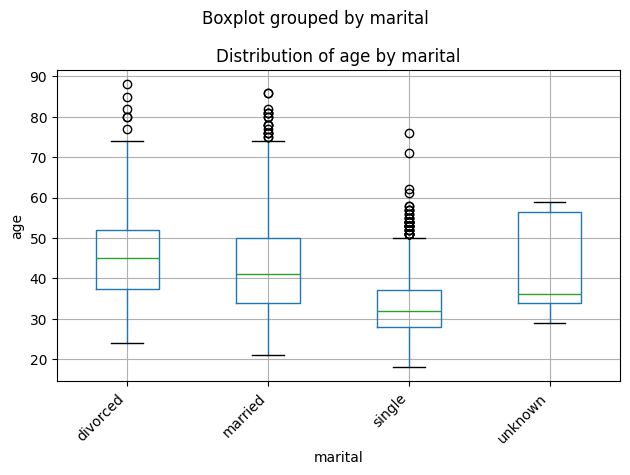

<Figure size 1000x600 with 0 Axes>

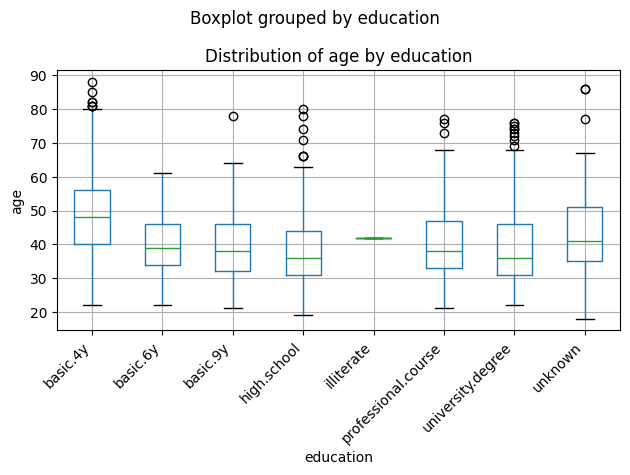

<Figure size 1000x600 with 0 Axes>

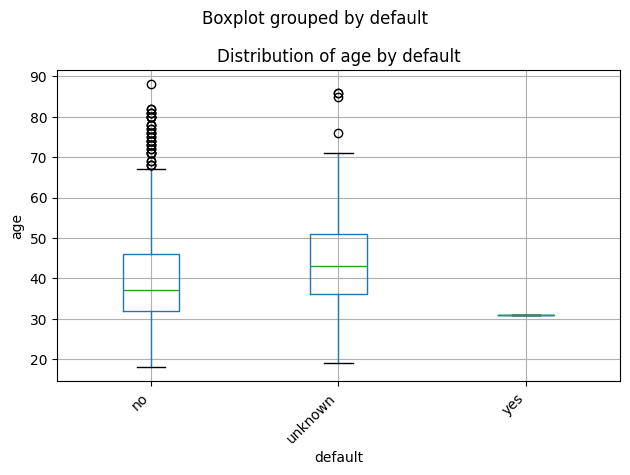

<Figure size 1000x600 with 0 Axes>

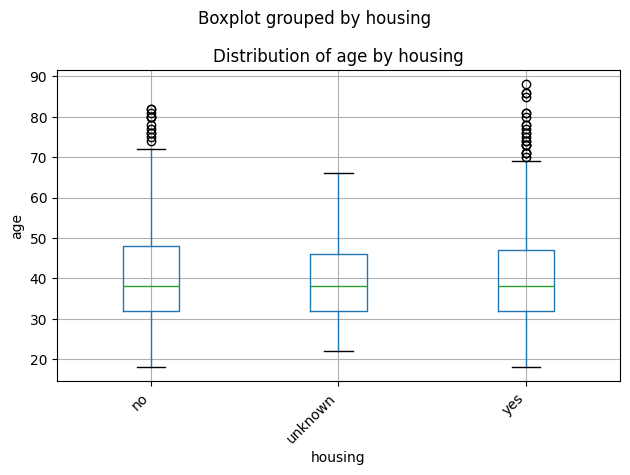

<Figure size 1000x600 with 0 Axes>

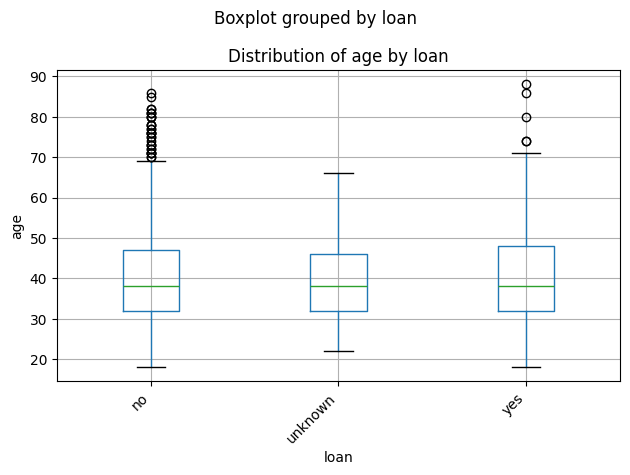

<Figure size 1000x600 with 0 Axes>

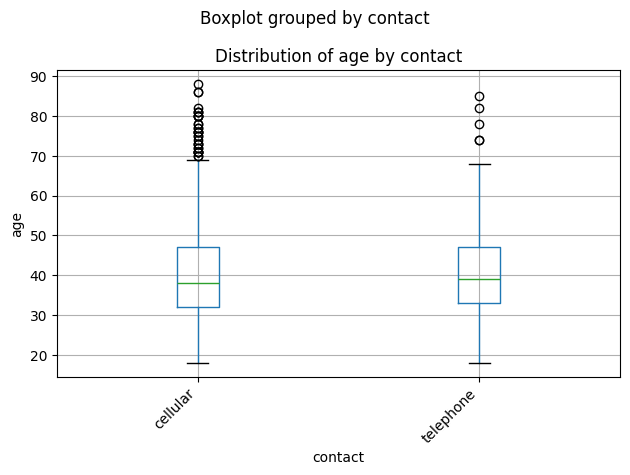

<Figure size 1000x600 with 0 Axes>

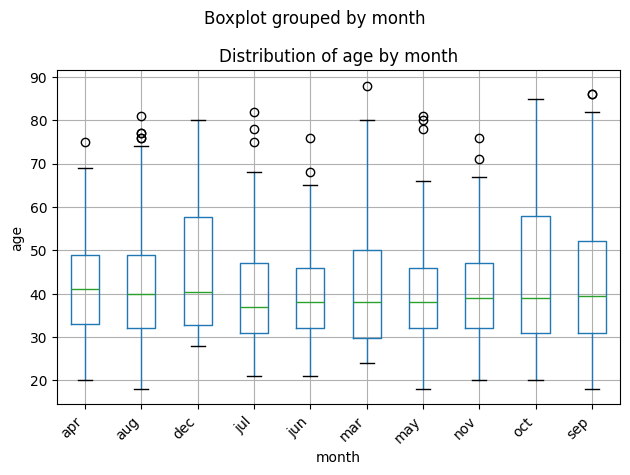

<Figure size 1000x600 with 0 Axes>

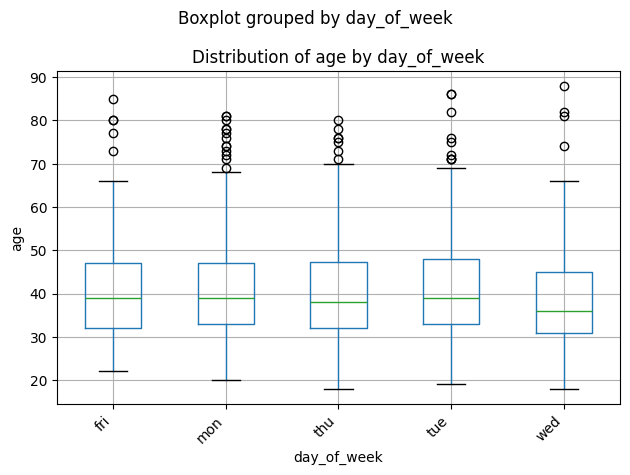

<Figure size 1000x600 with 0 Axes>

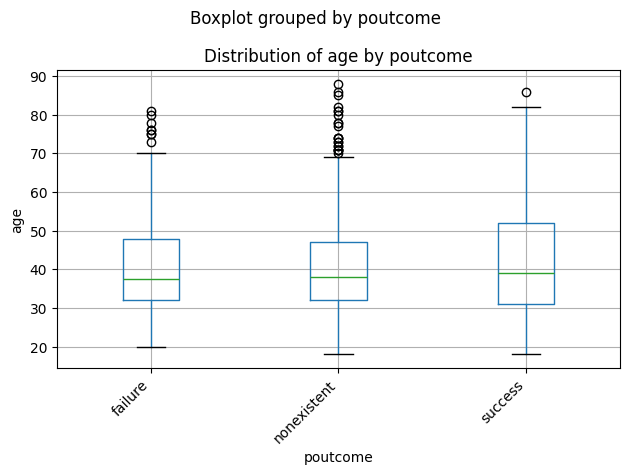

<Figure size 1000x600 with 0 Axes>

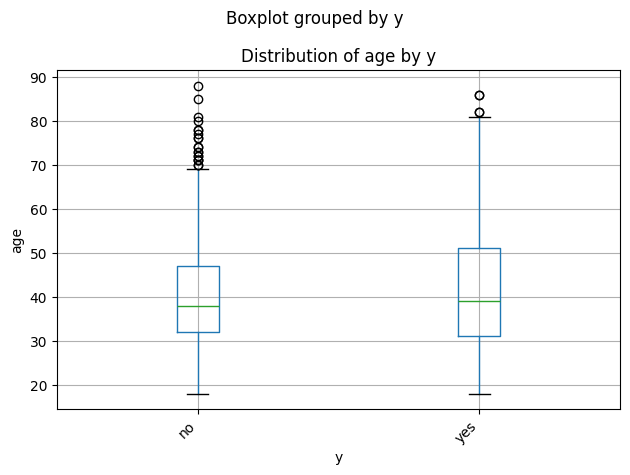

<Figure size 1000x600 with 0 Axes>

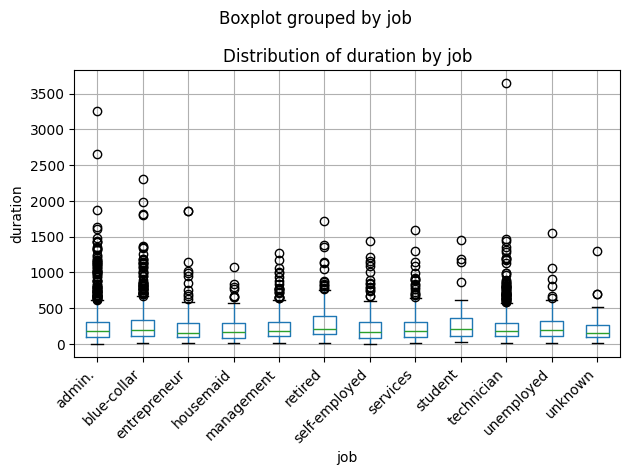

<Figure size 1000x600 with 0 Axes>

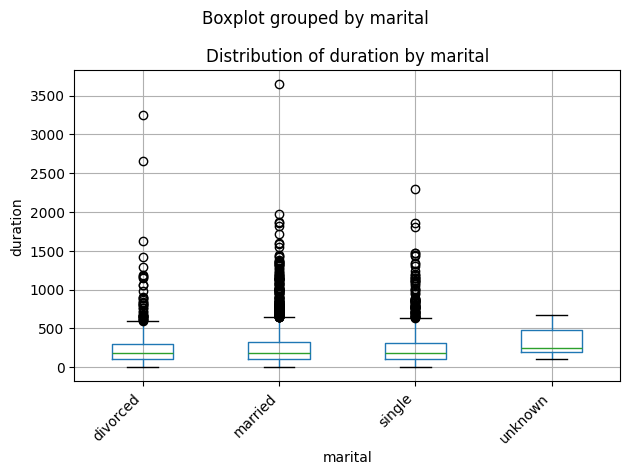

<Figure size 1000x600 with 0 Axes>

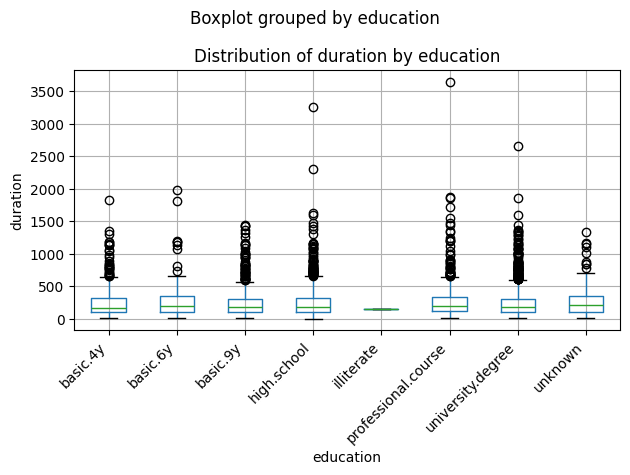

<Figure size 1000x600 with 0 Axes>

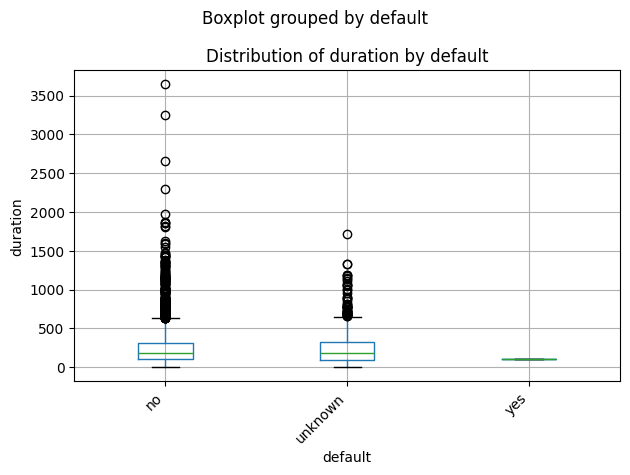

<Figure size 1000x600 with 0 Axes>

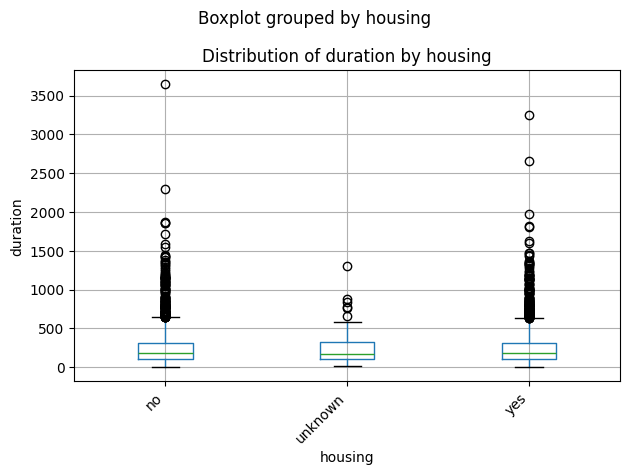

<Figure size 1000x600 with 0 Axes>

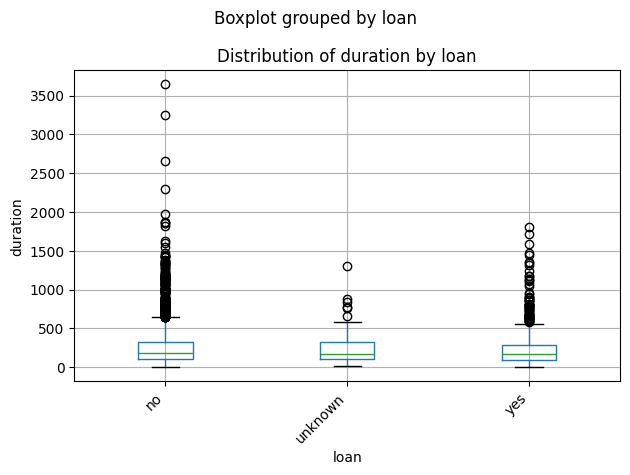

<Figure size 1000x600 with 0 Axes>

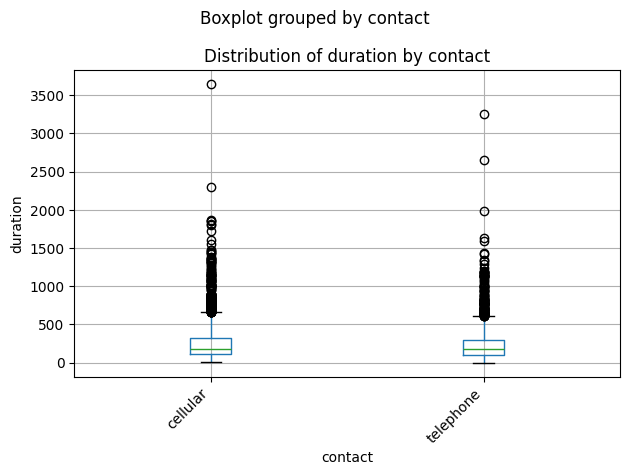

<Figure size 1000x600 with 0 Axes>

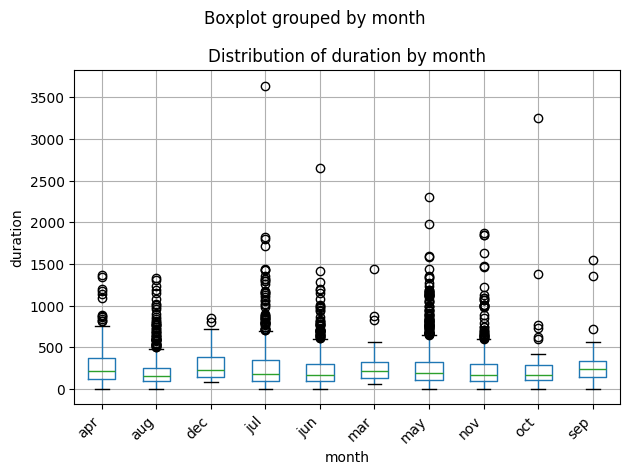

<Figure size 1000x600 with 0 Axes>

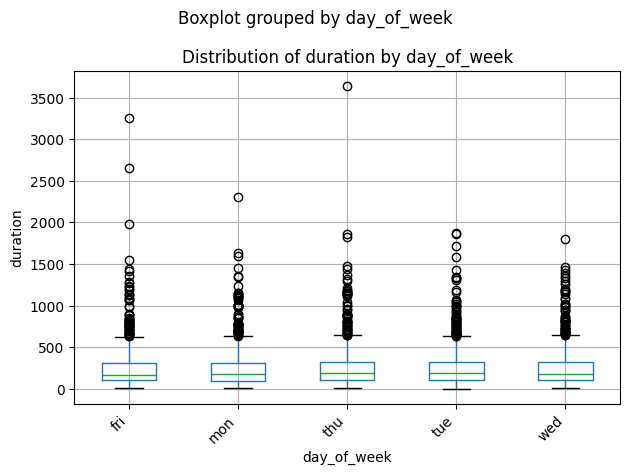

<Figure size 1000x600 with 0 Axes>

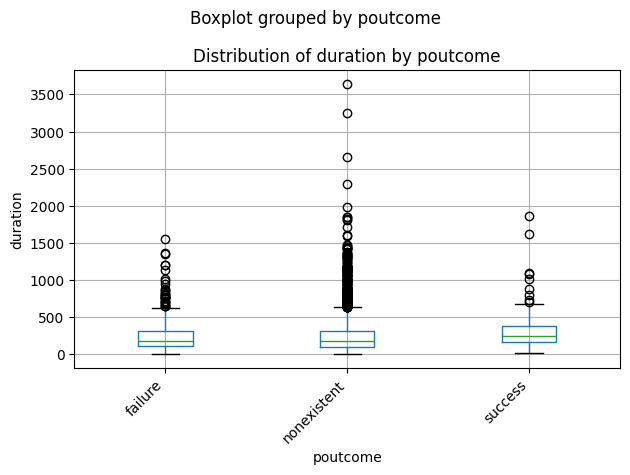

<Figure size 1000x600 with 0 Axes>

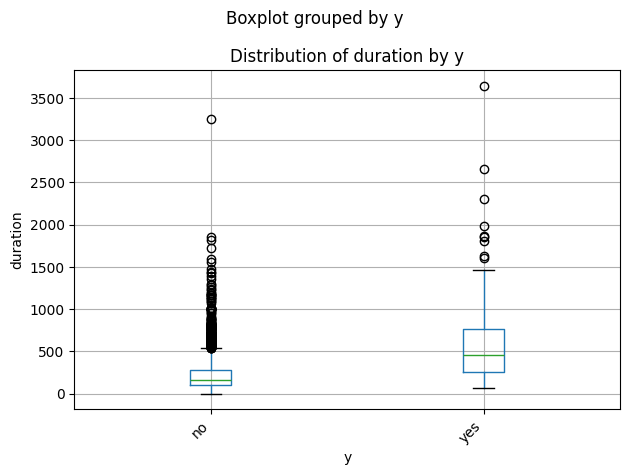

<Figure size 1000x600 with 0 Axes>

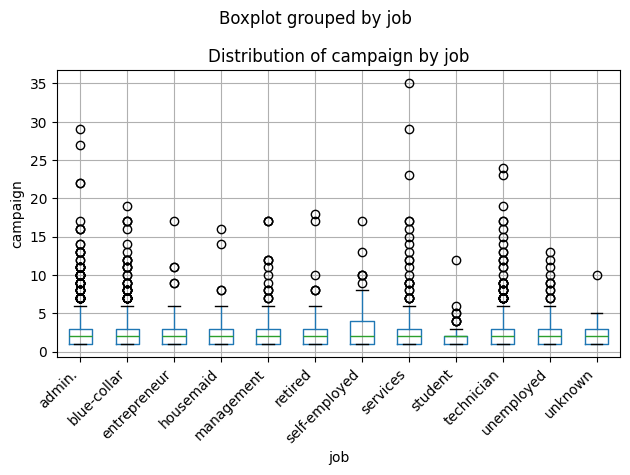

<Figure size 1000x600 with 0 Axes>

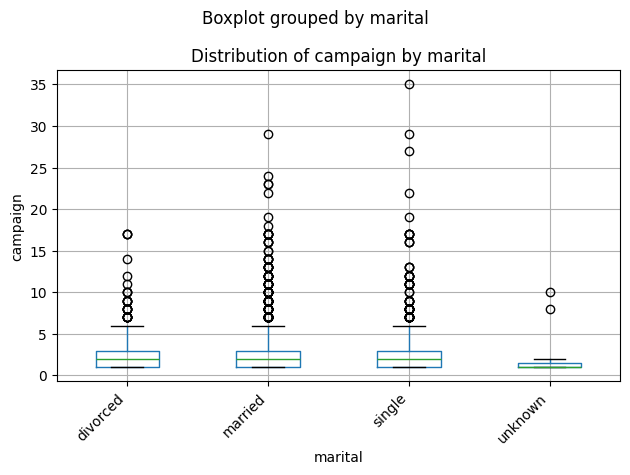

<Figure size 1000x600 with 0 Axes>

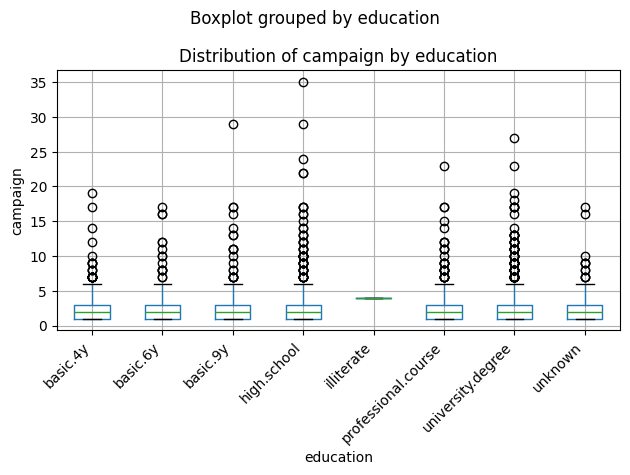

<Figure size 1000x600 with 0 Axes>

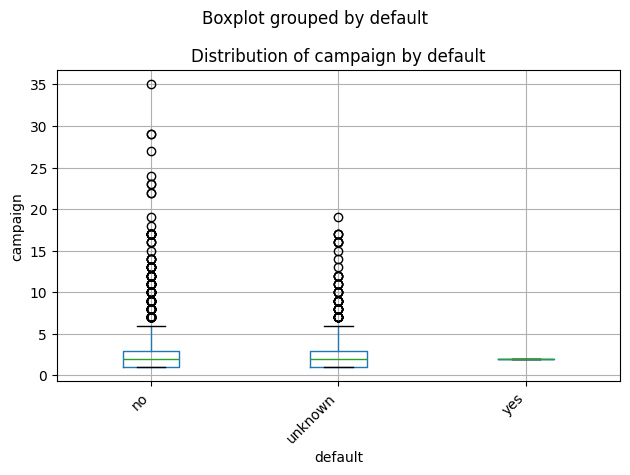

<Figure size 1000x600 with 0 Axes>

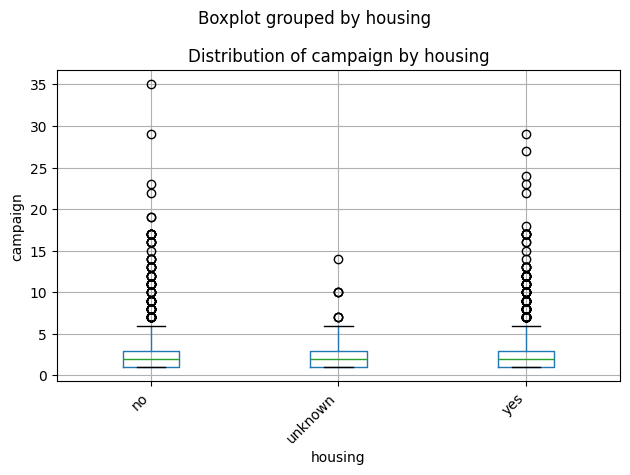

<Figure size 1000x600 with 0 Axes>

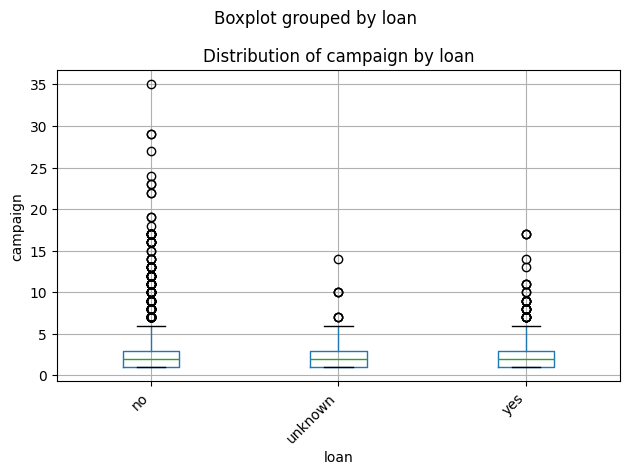

<Figure size 1000x600 with 0 Axes>

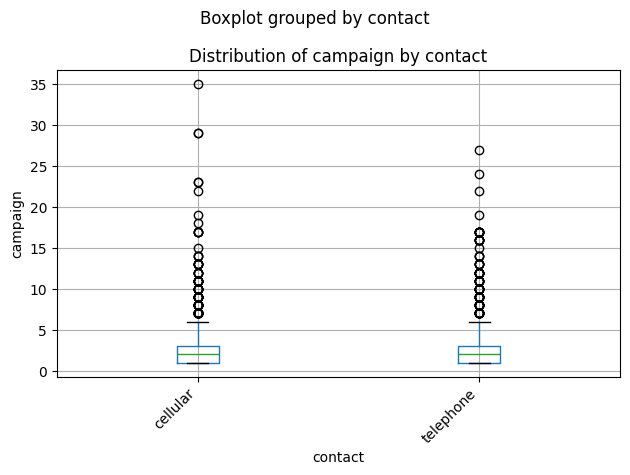

<Figure size 1000x600 with 0 Axes>

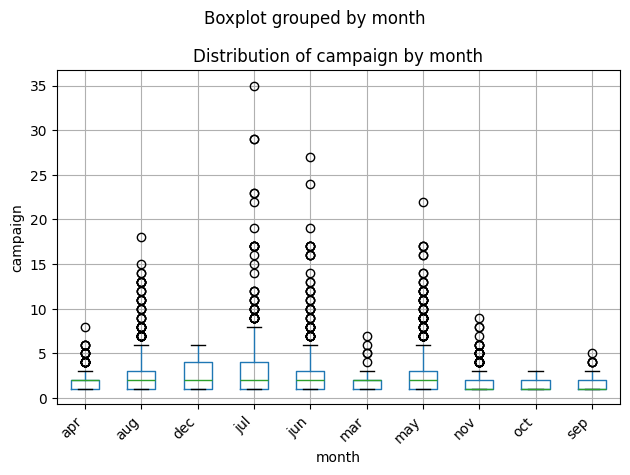

<Figure size 1000x600 with 0 Axes>

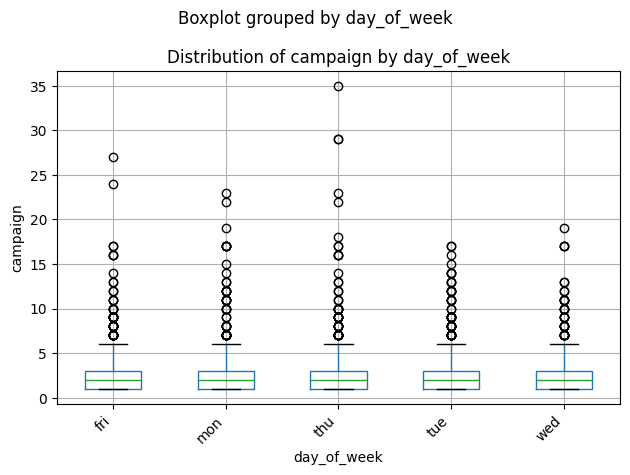

<Figure size 1000x600 with 0 Axes>

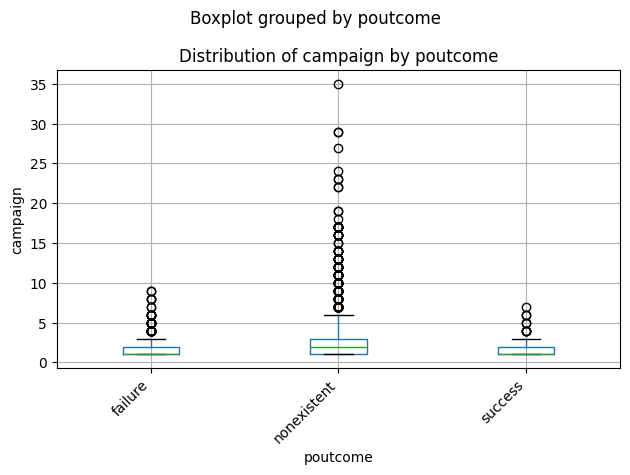

<Figure size 1000x600 with 0 Axes>

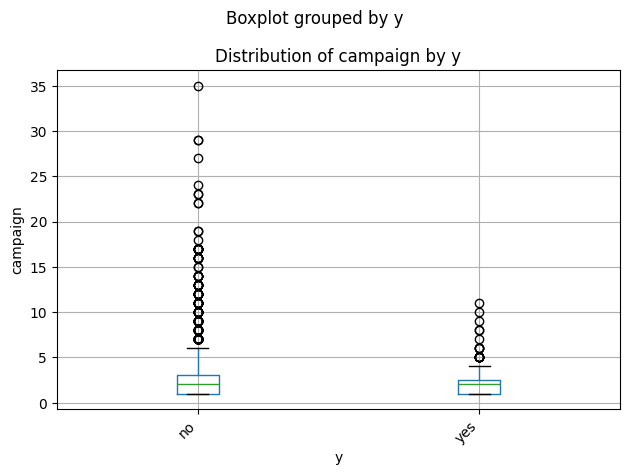

<Figure size 1000x600 with 0 Axes>

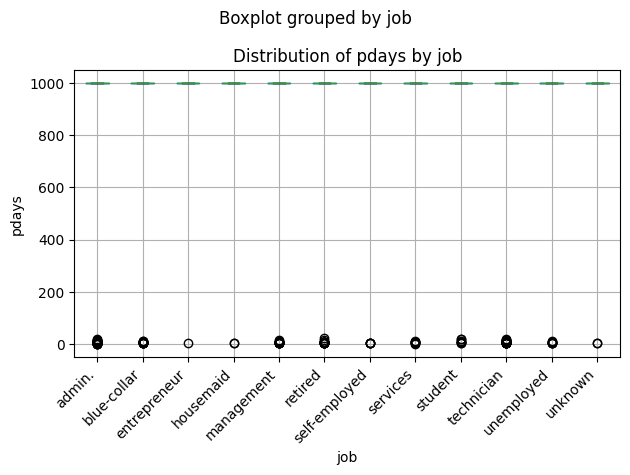

<Figure size 1000x600 with 0 Axes>

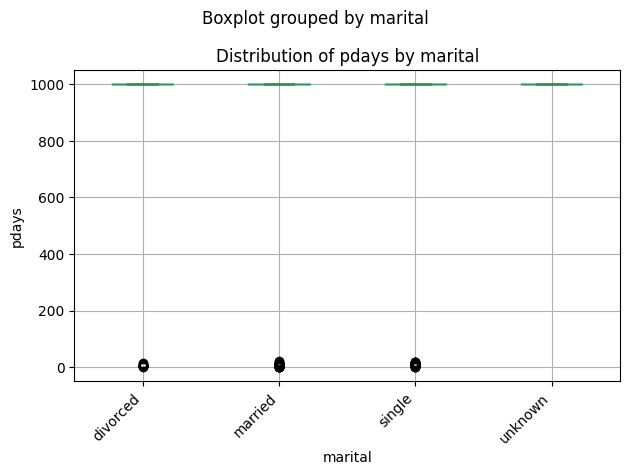

<Figure size 1000x600 with 0 Axes>

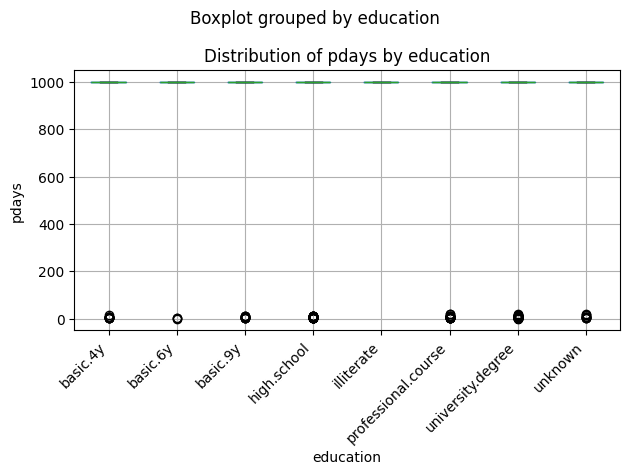

<Figure size 1000x600 with 0 Axes>

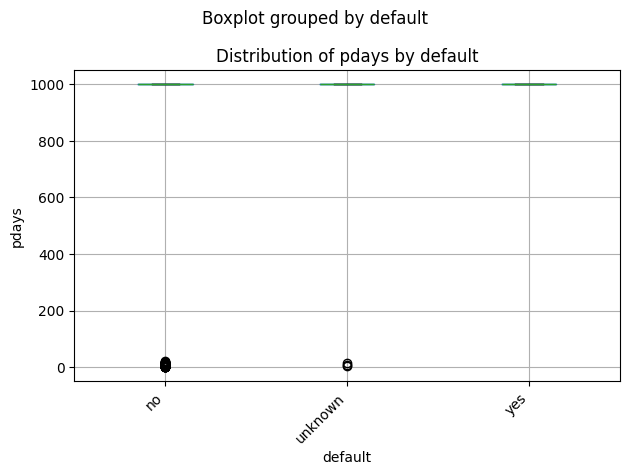

<Figure size 1000x600 with 0 Axes>

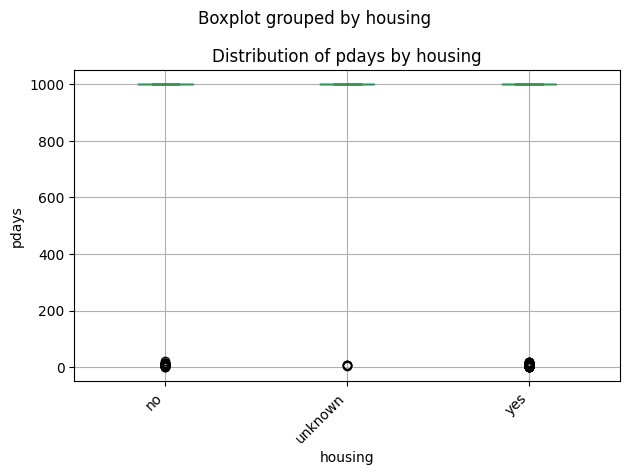

<Figure size 1000x600 with 0 Axes>

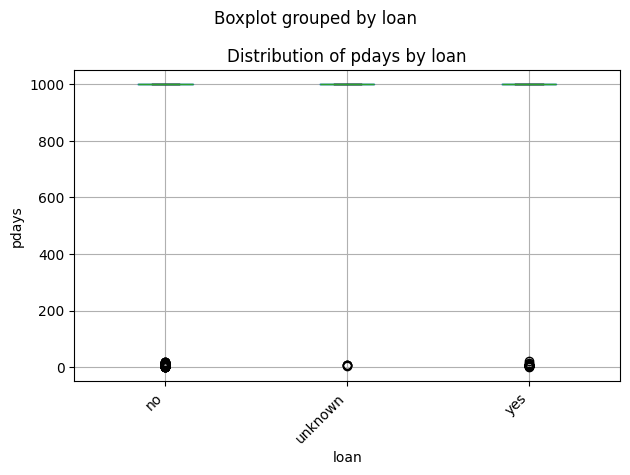

<Figure size 1000x600 with 0 Axes>

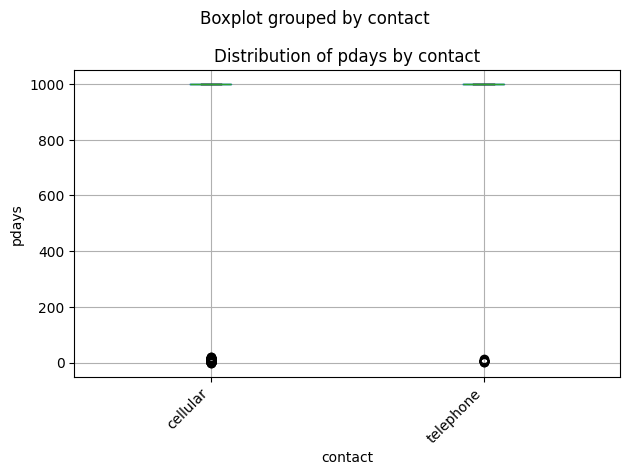

<Figure size 1000x600 with 0 Axes>

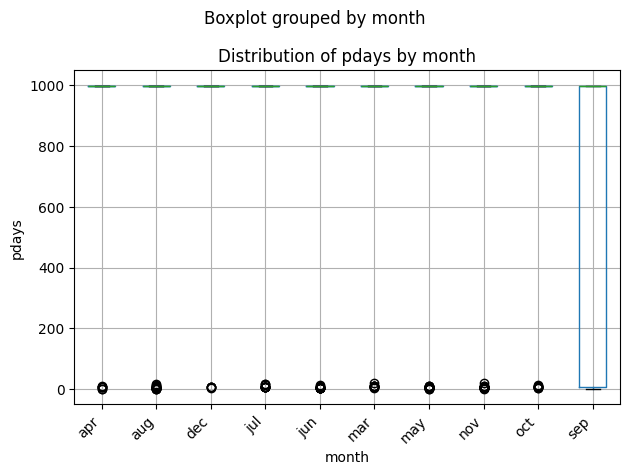

<Figure size 1000x600 with 0 Axes>

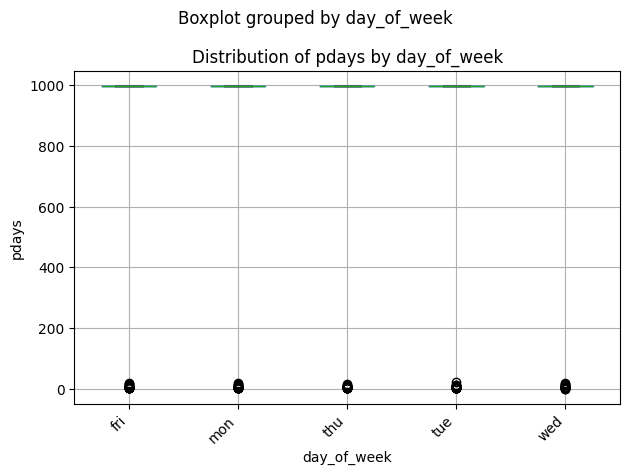

<Figure size 1000x600 with 0 Axes>

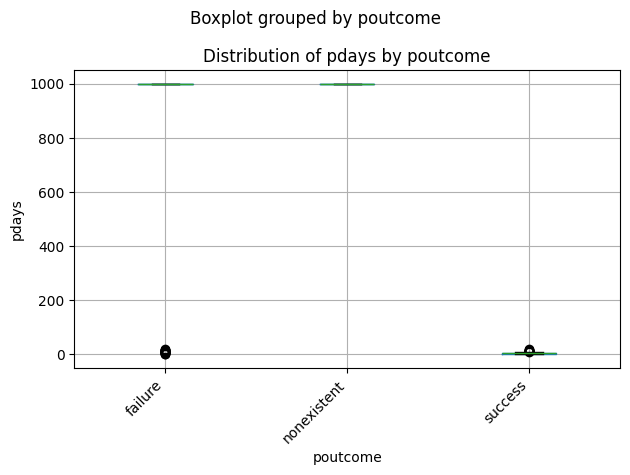

<Figure size 1000x600 with 0 Axes>

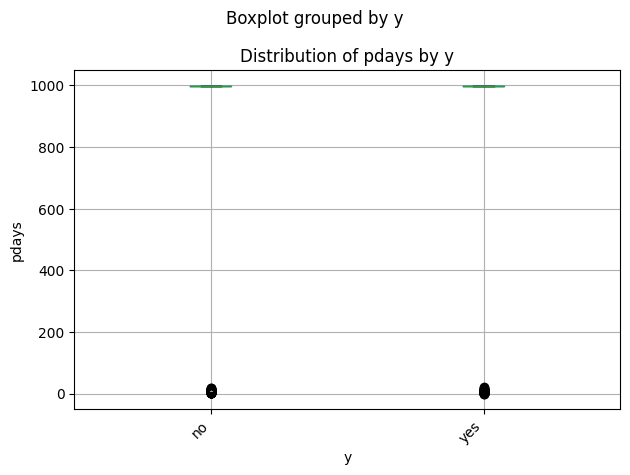

<Figure size 1000x600 with 0 Axes>

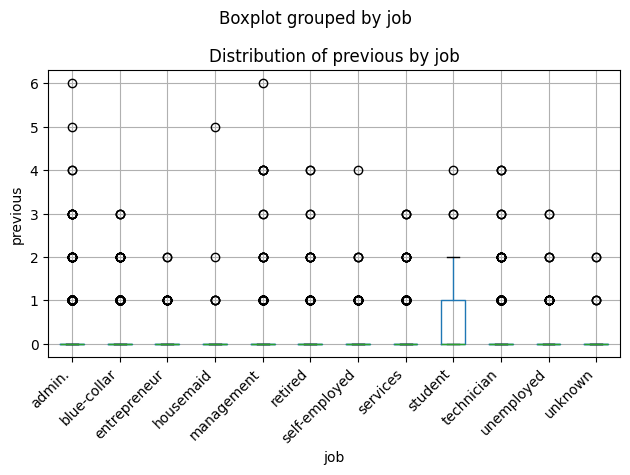

<Figure size 1000x600 with 0 Axes>

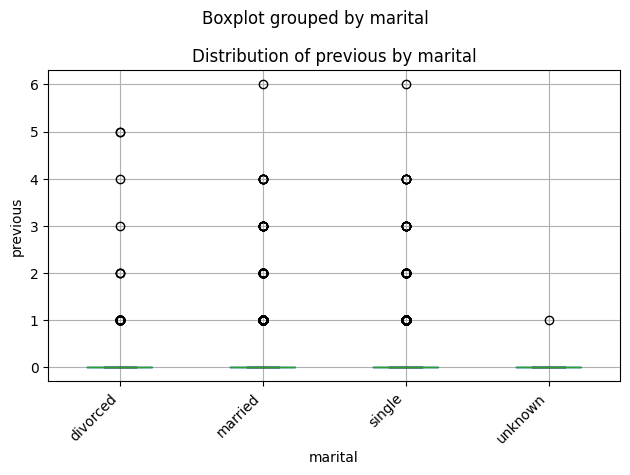

<Figure size 1000x600 with 0 Axes>

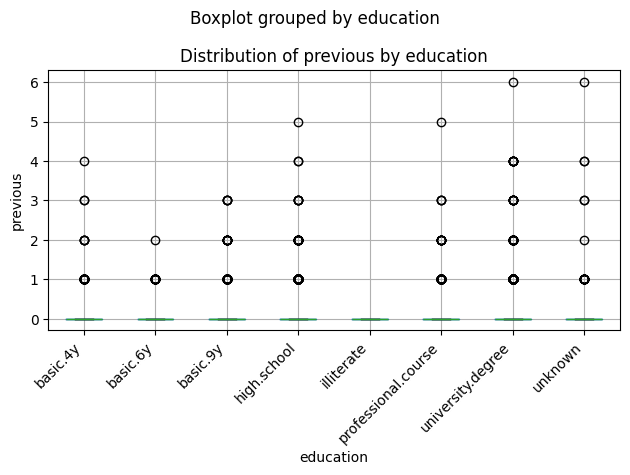

<Figure size 1000x600 with 0 Axes>

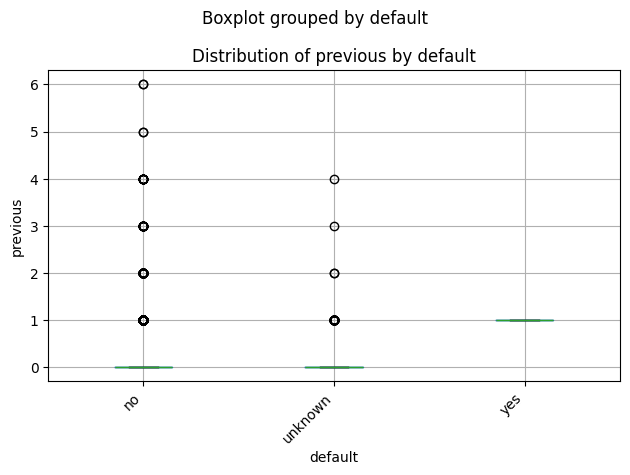

<Figure size 1000x600 with 0 Axes>

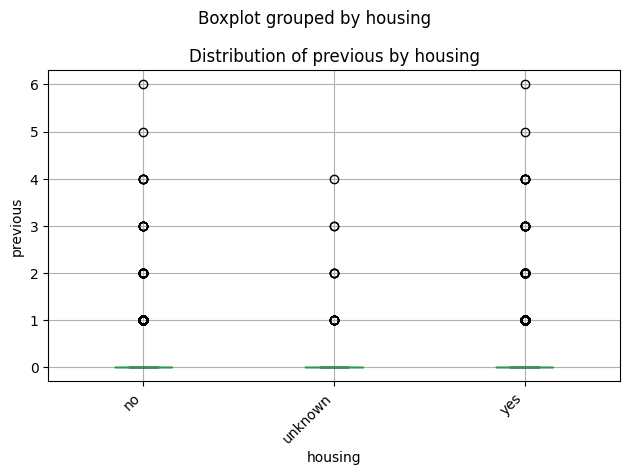

<Figure size 1000x600 with 0 Axes>

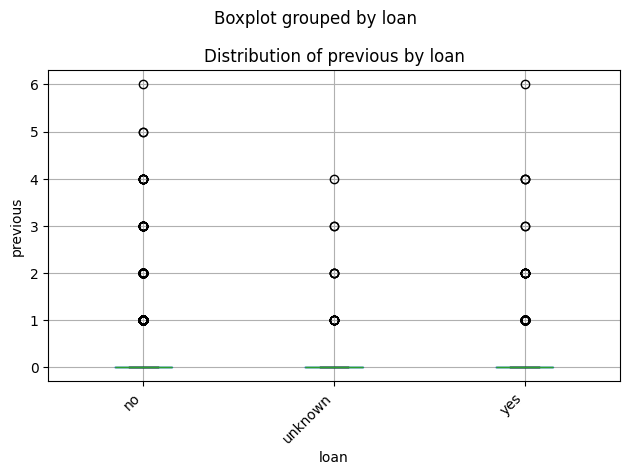

<Figure size 1000x600 with 0 Axes>

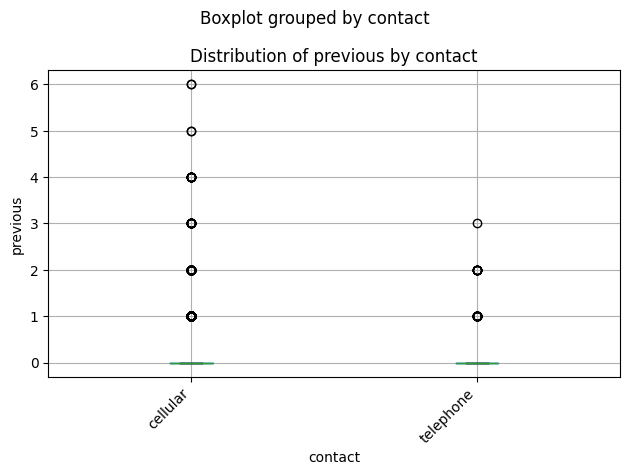

<Figure size 1000x600 with 0 Axes>

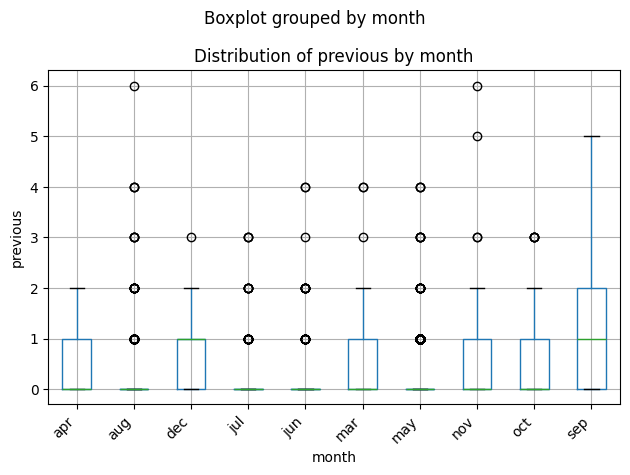

<Figure size 1000x600 with 0 Axes>

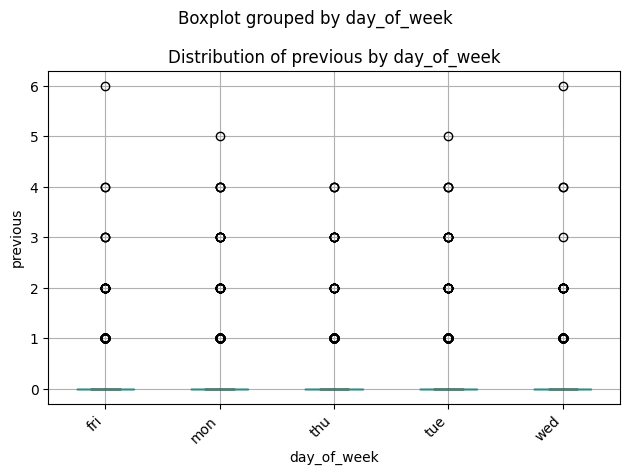

<Figure size 1000x600 with 0 Axes>

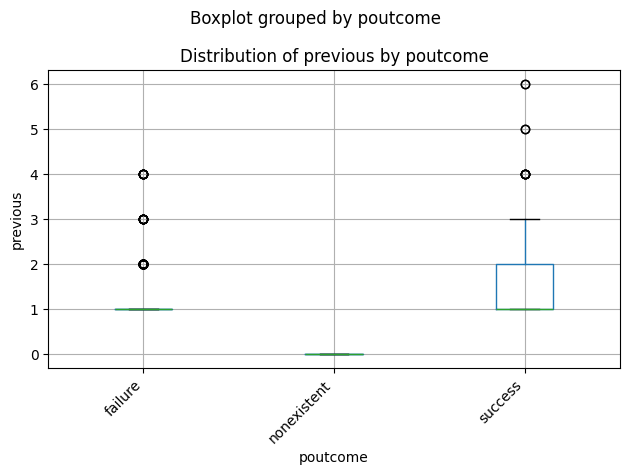

<Figure size 1000x600 with 0 Axes>

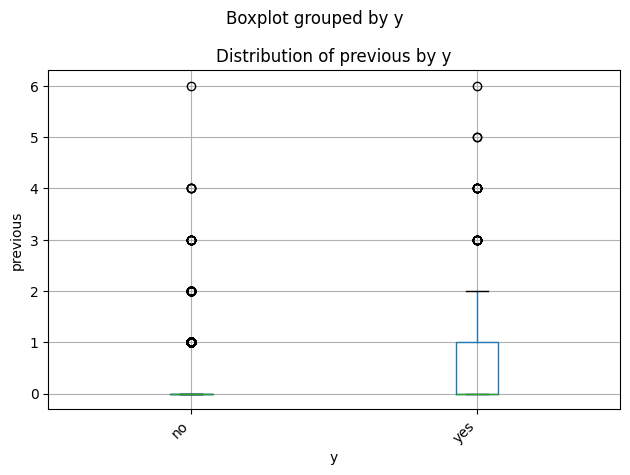

<Figure size 1000x600 with 0 Axes>

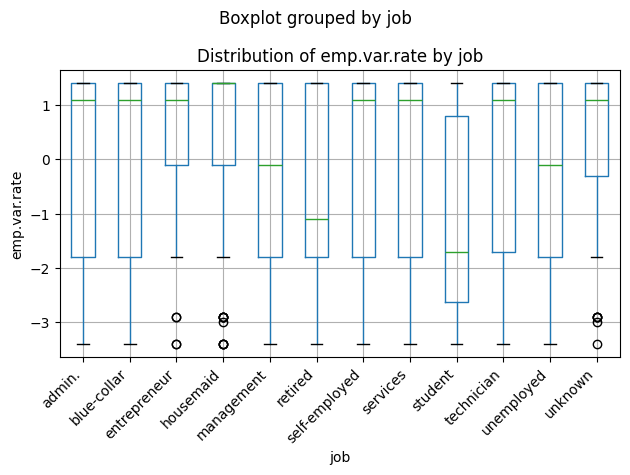

<Figure size 1000x600 with 0 Axes>

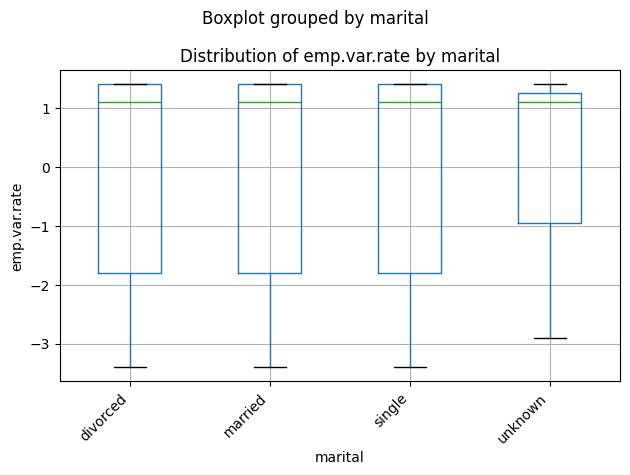

<Figure size 1000x600 with 0 Axes>

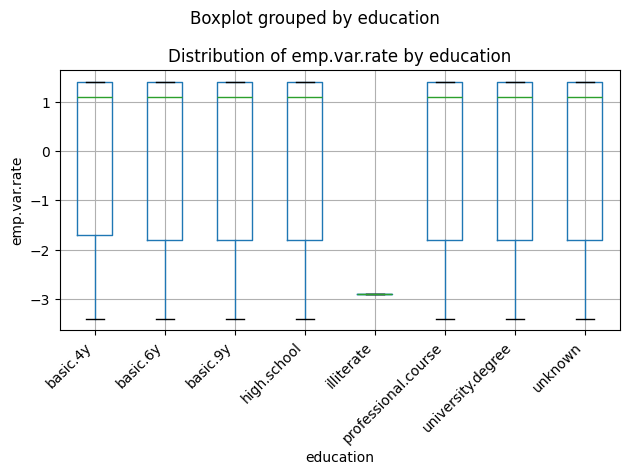

<Figure size 1000x600 with 0 Axes>

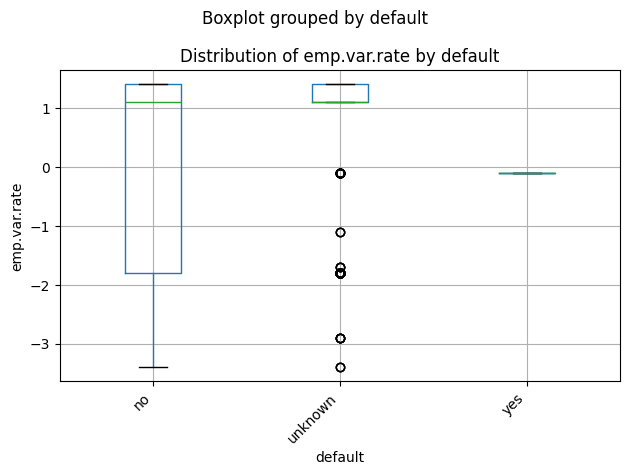

<Figure size 1000x600 with 0 Axes>

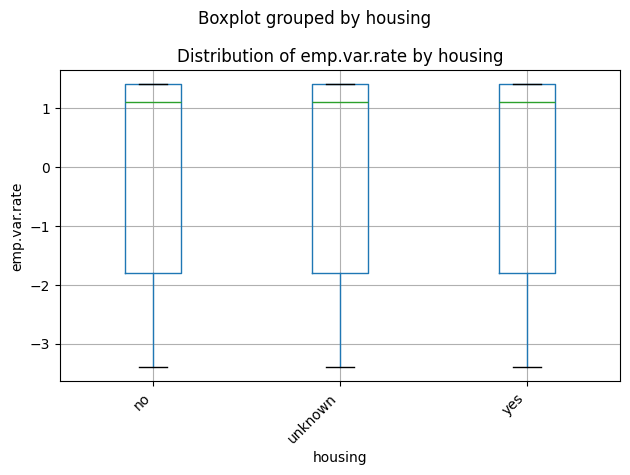

<Figure size 1000x600 with 0 Axes>

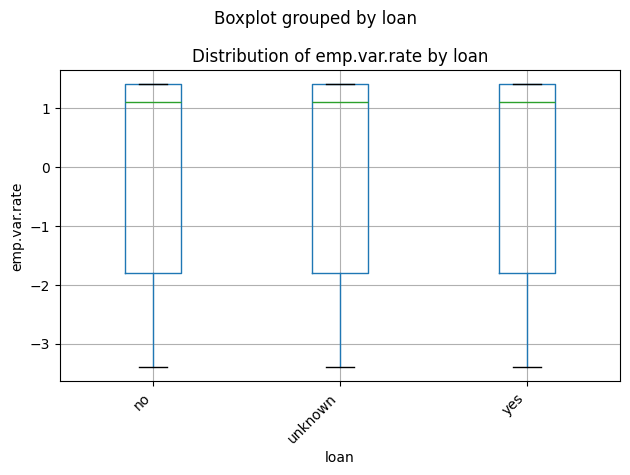

<Figure size 1000x600 with 0 Axes>

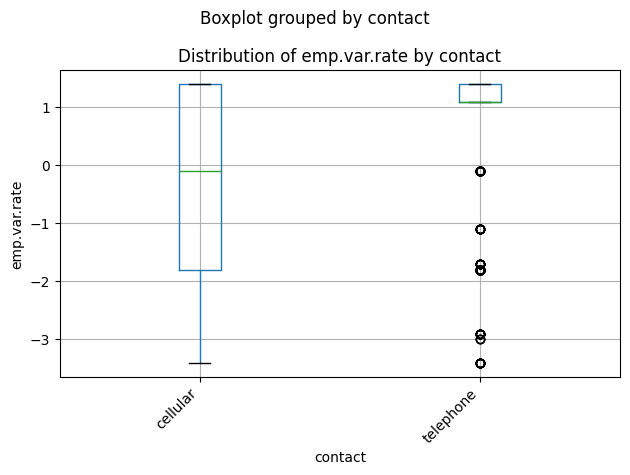

<Figure size 1000x600 with 0 Axes>

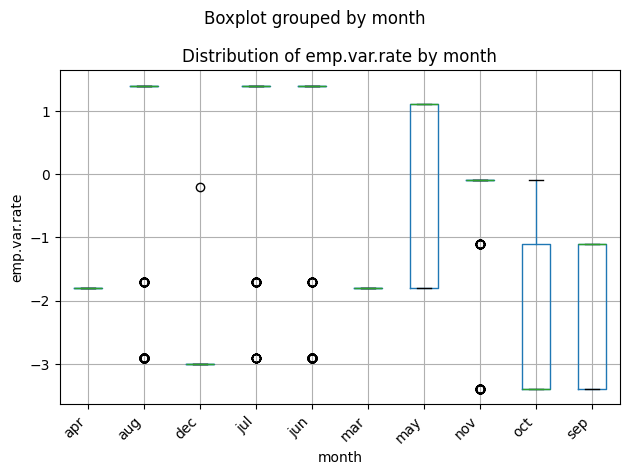

<Figure size 1000x600 with 0 Axes>

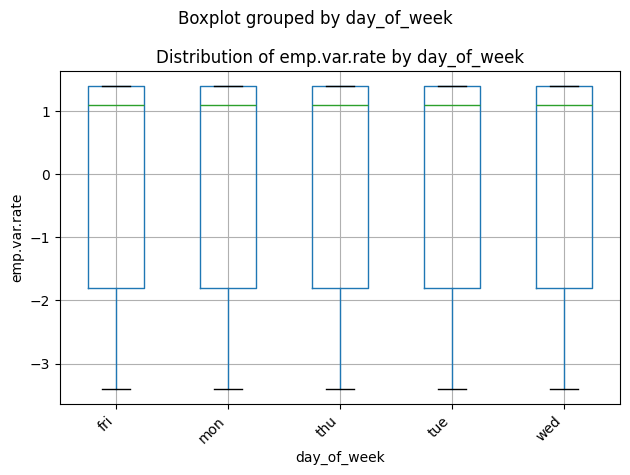

<Figure size 1000x600 with 0 Axes>

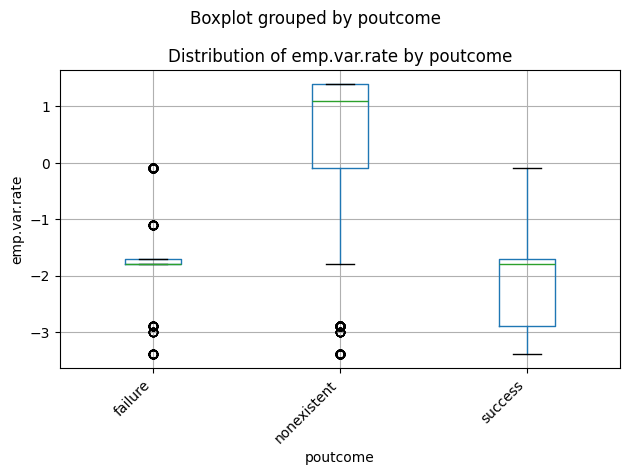

<Figure size 1000x600 with 0 Axes>

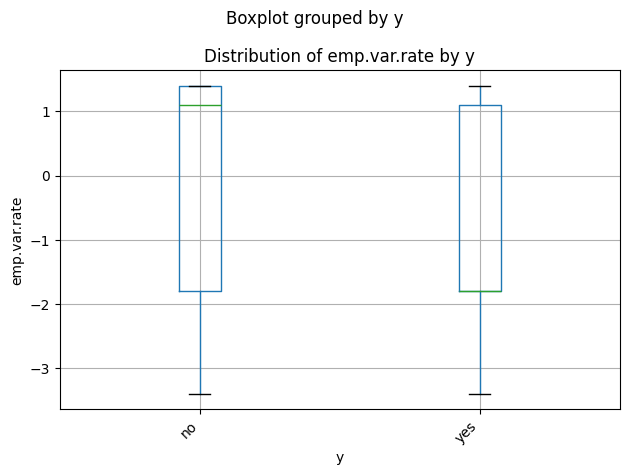

<Figure size 1000x600 with 0 Axes>

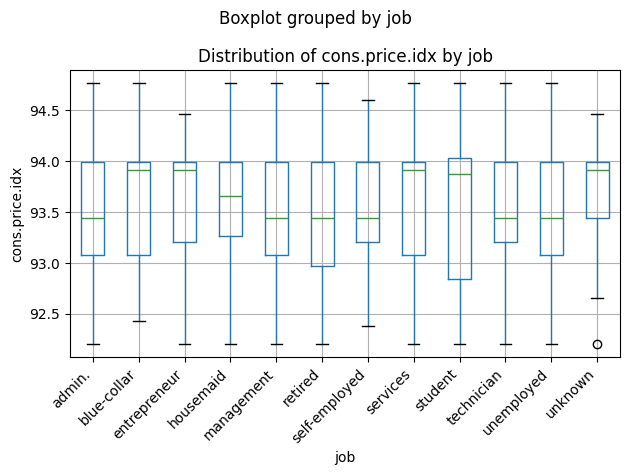

<Figure size 1000x600 with 0 Axes>

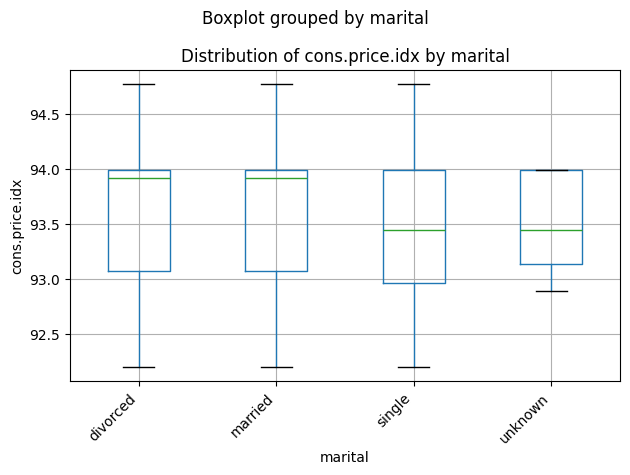

<Figure size 1000x600 with 0 Axes>

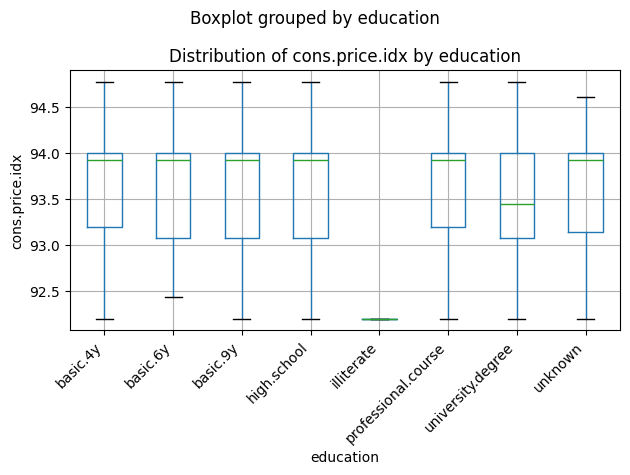

<Figure size 1000x600 with 0 Axes>

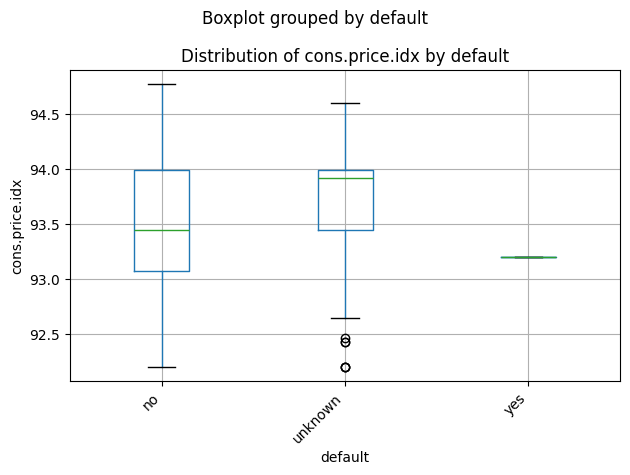

<Figure size 1000x600 with 0 Axes>

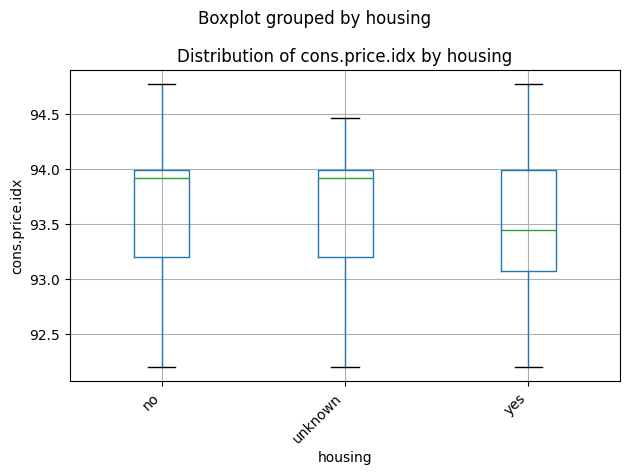

<Figure size 1000x600 with 0 Axes>

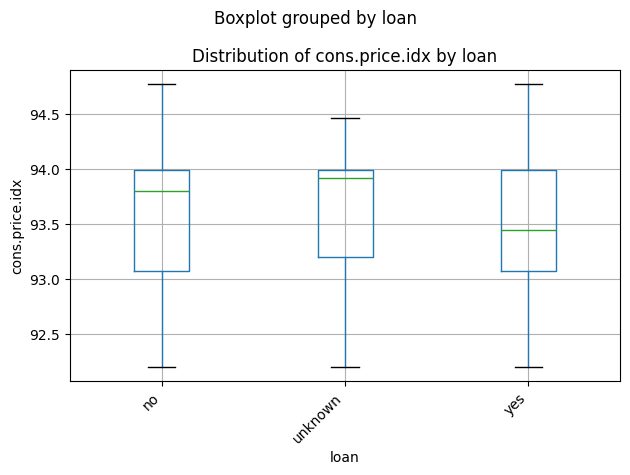

<Figure size 1000x600 with 0 Axes>

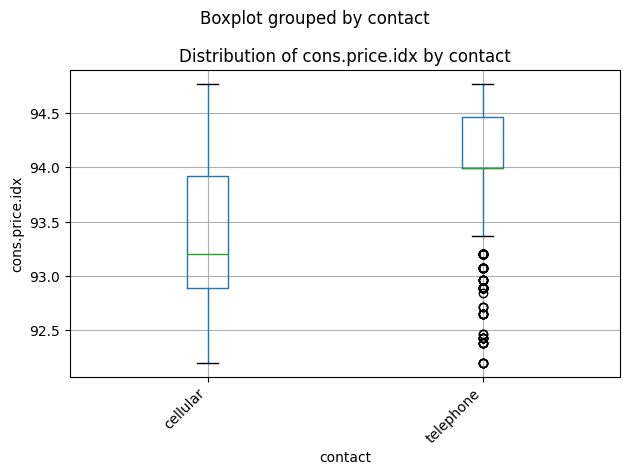

<Figure size 1000x600 with 0 Axes>

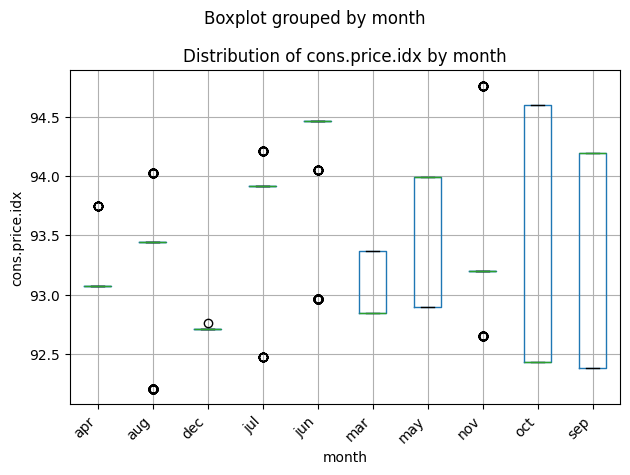

<Figure size 1000x600 with 0 Axes>

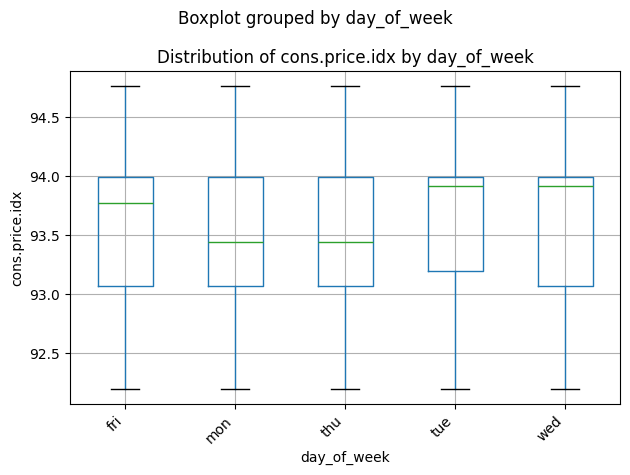

<Figure size 1000x600 with 0 Axes>

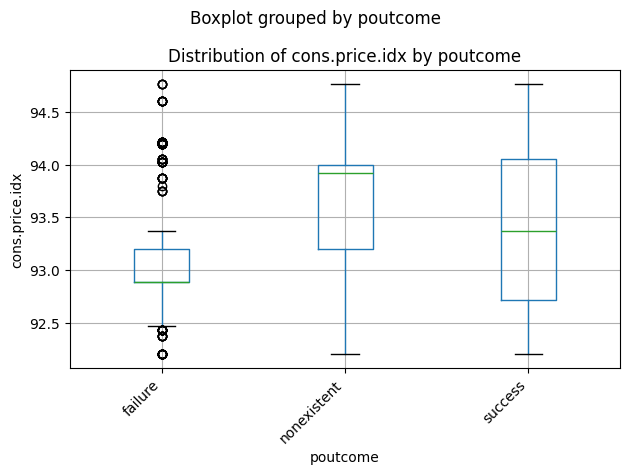

<Figure size 1000x600 with 0 Axes>

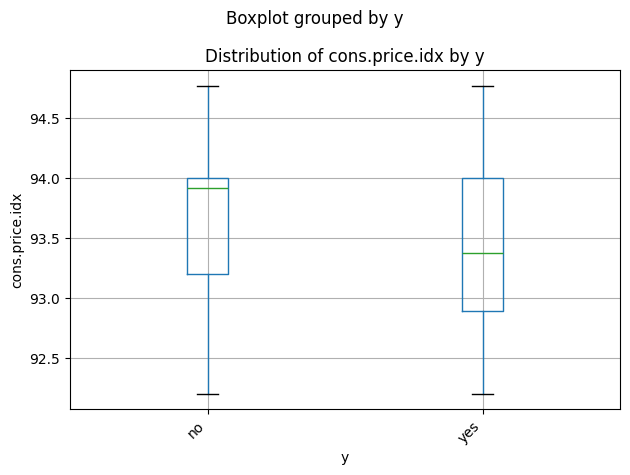

<Figure size 1000x600 with 0 Axes>

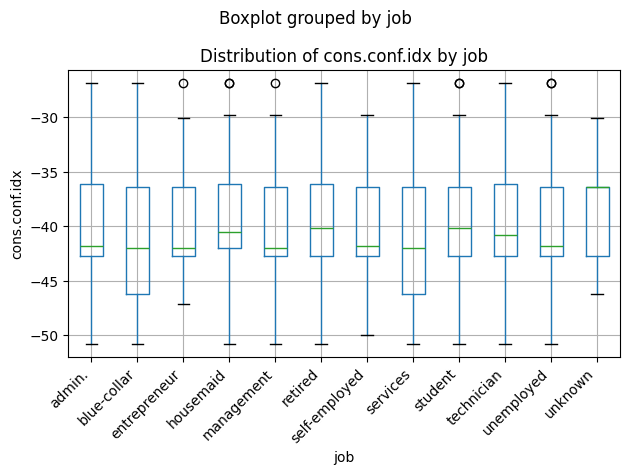

<Figure size 1000x600 with 0 Axes>

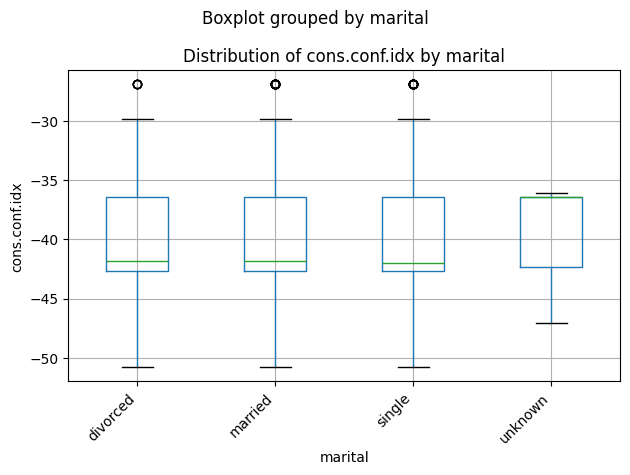

<Figure size 1000x600 with 0 Axes>

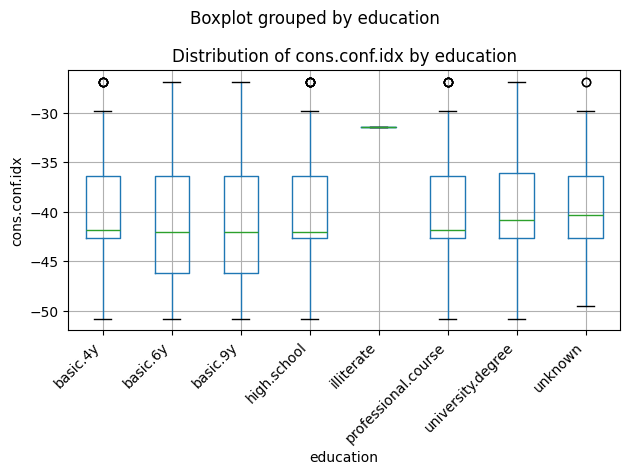

<Figure size 1000x600 with 0 Axes>

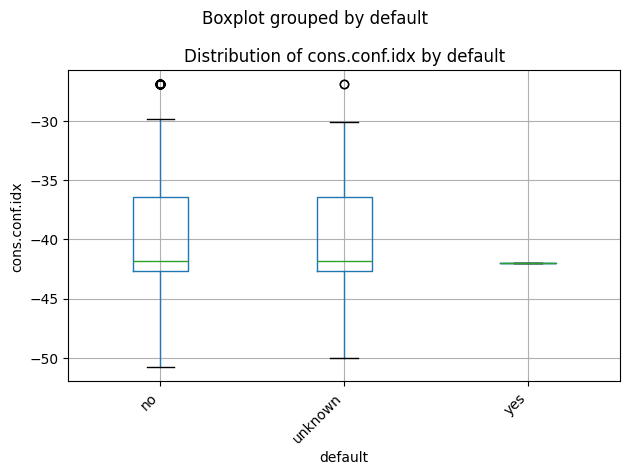

<Figure size 1000x600 with 0 Axes>

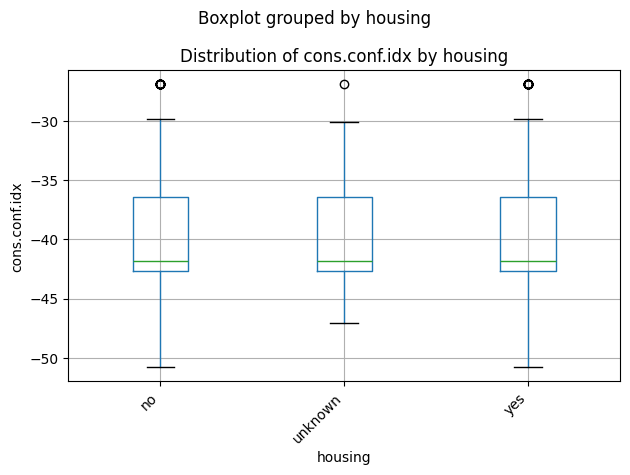

<Figure size 1000x600 with 0 Axes>

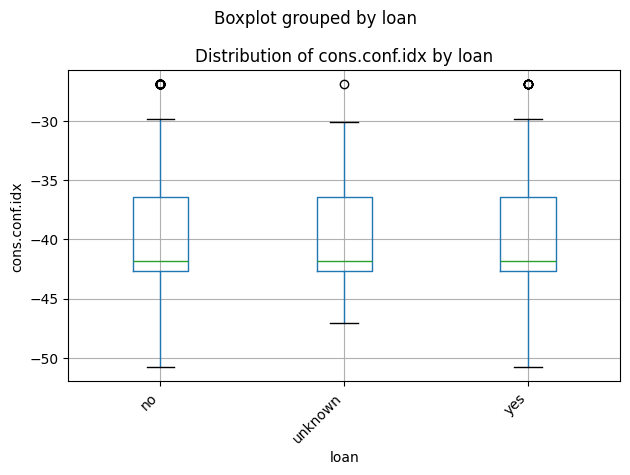

<Figure size 1000x600 with 0 Axes>

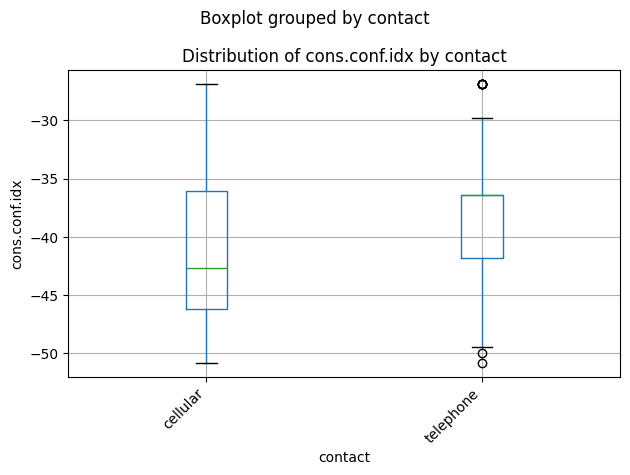

<Figure size 1000x600 with 0 Axes>

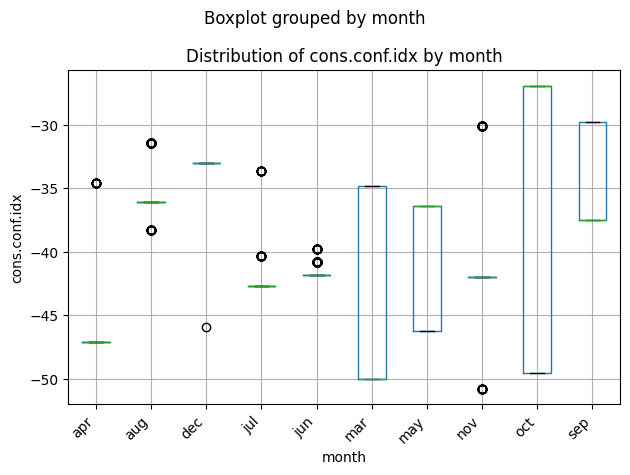

<Figure size 1000x600 with 0 Axes>

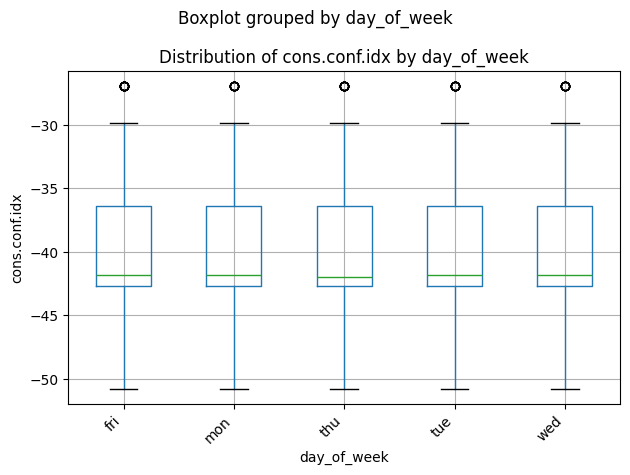

<Figure size 1000x600 with 0 Axes>

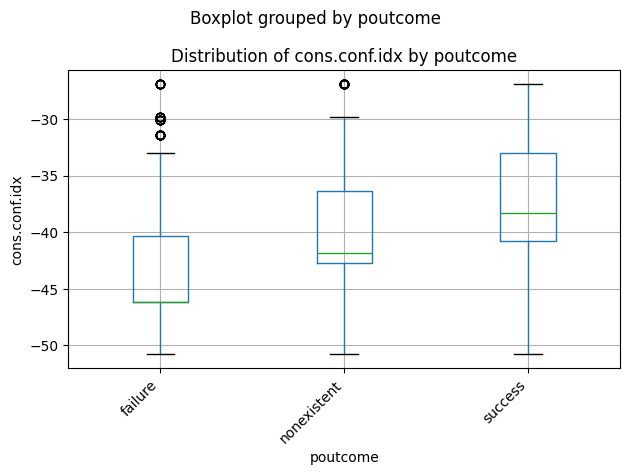

<Figure size 1000x600 with 0 Axes>

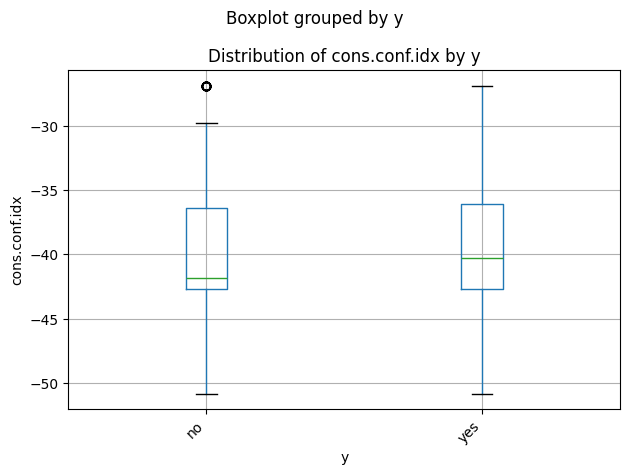

<Figure size 1000x600 with 0 Axes>

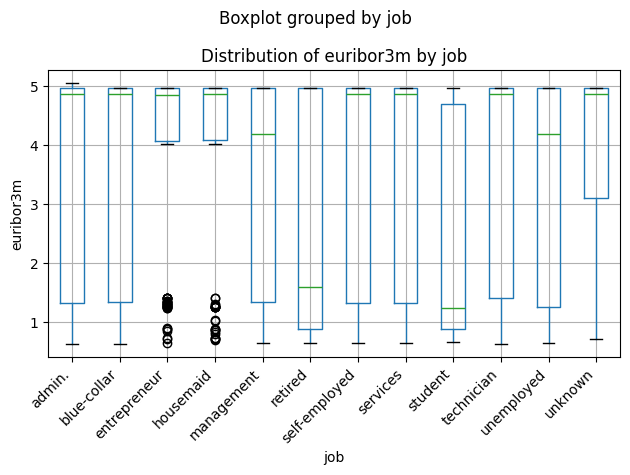

<Figure size 1000x600 with 0 Axes>

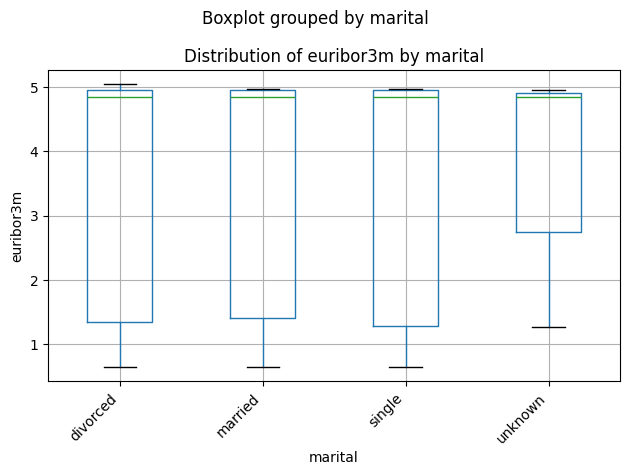

<Figure size 1000x600 with 0 Axes>

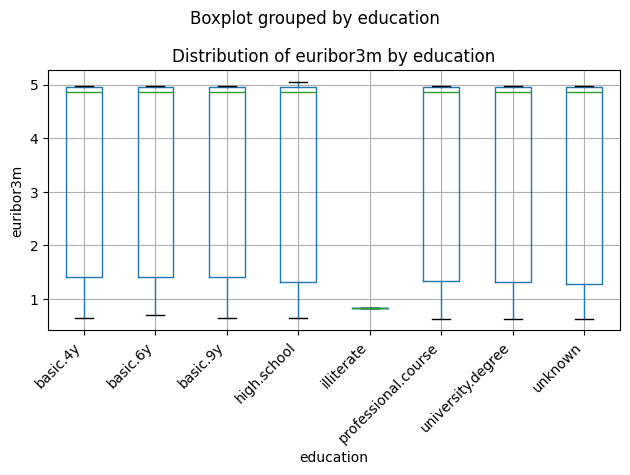

<Figure size 1000x600 with 0 Axes>

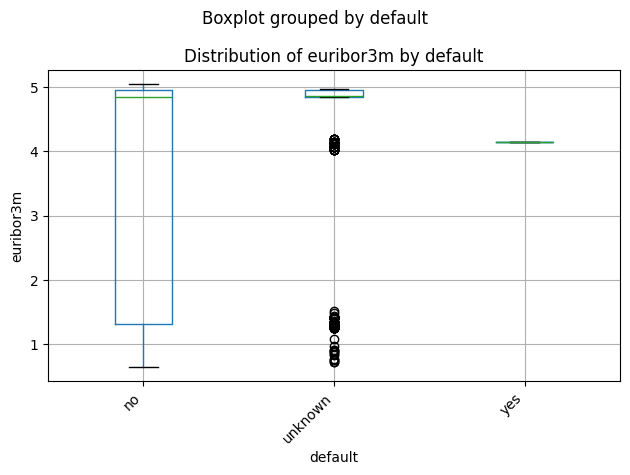

<Figure size 1000x600 with 0 Axes>

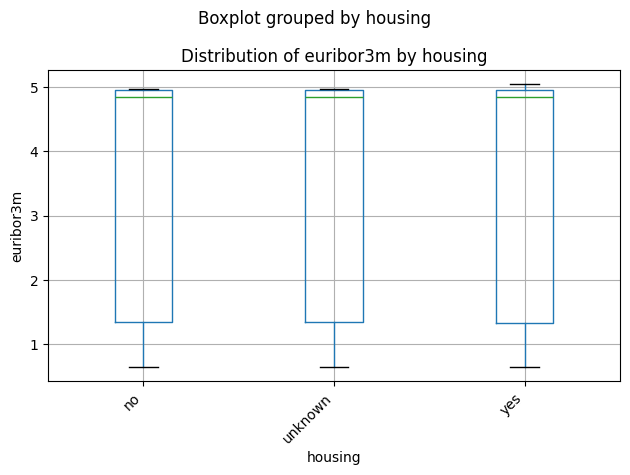

<Figure size 1000x600 with 0 Axes>

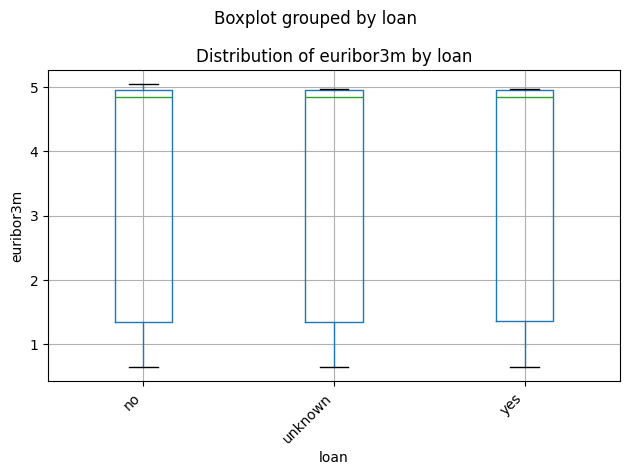

<Figure size 1000x600 with 0 Axes>

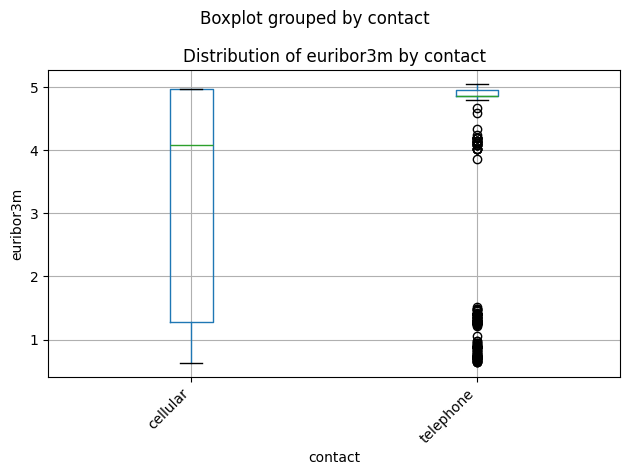

<Figure size 1000x600 with 0 Axes>

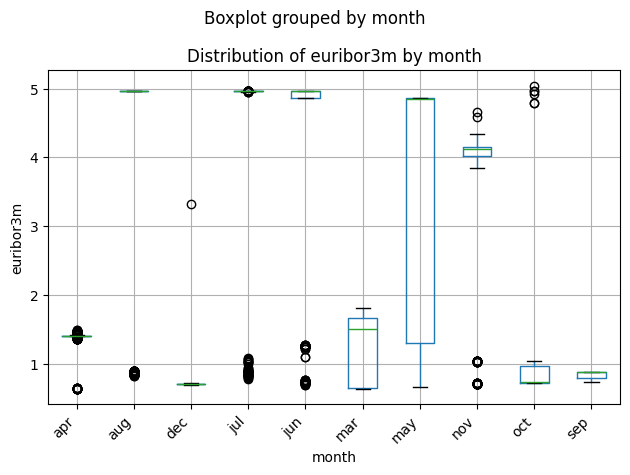

<Figure size 1000x600 with 0 Axes>

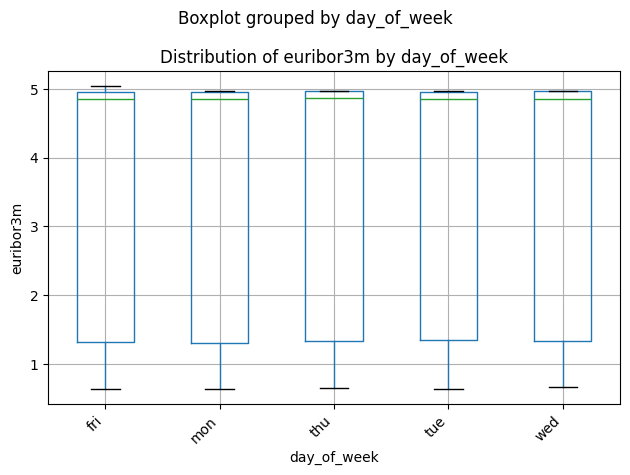

<Figure size 1000x600 with 0 Axes>

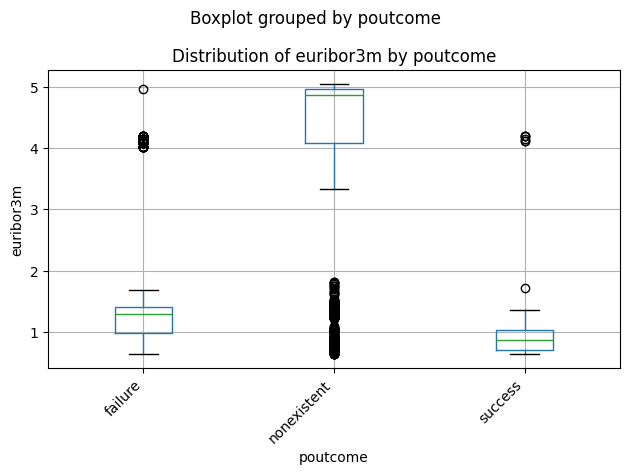

<Figure size 1000x600 with 0 Axes>

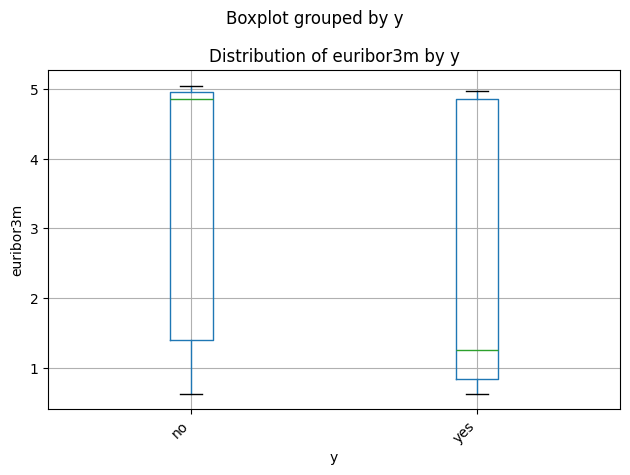

<Figure size 1000x600 with 0 Axes>

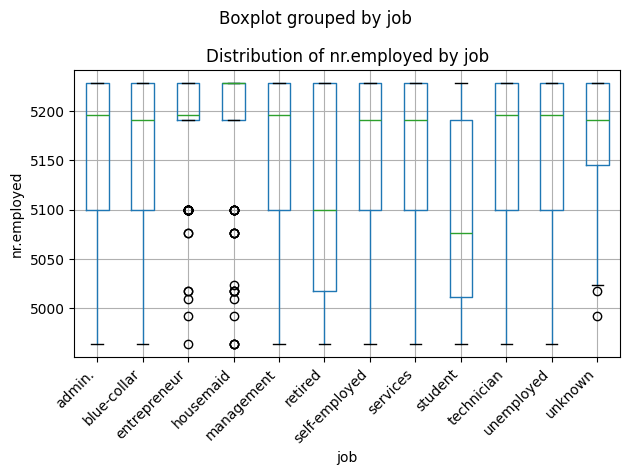

<Figure size 1000x600 with 0 Axes>

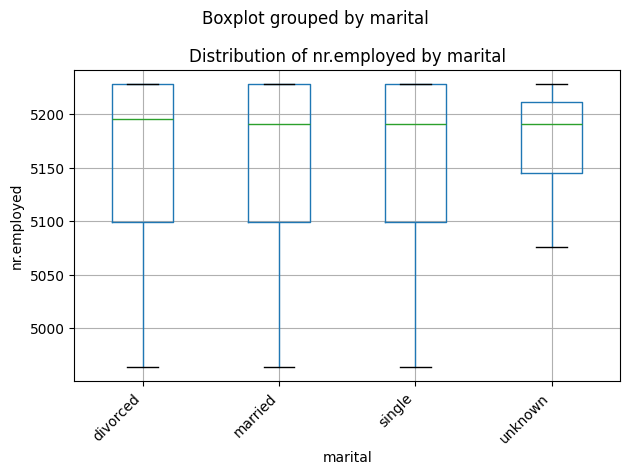

<Figure size 1000x600 with 0 Axes>

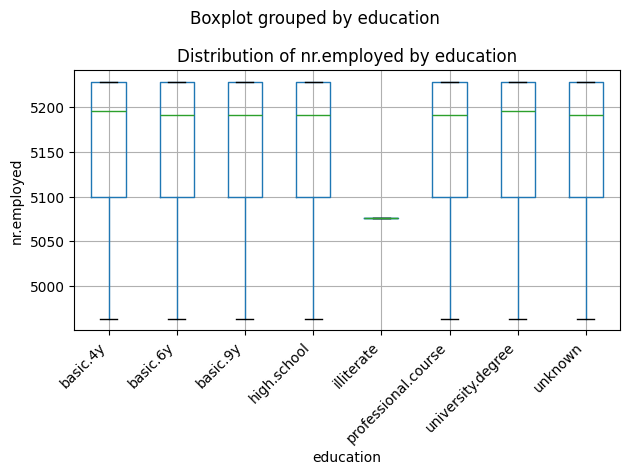

<Figure size 1000x600 with 0 Axes>

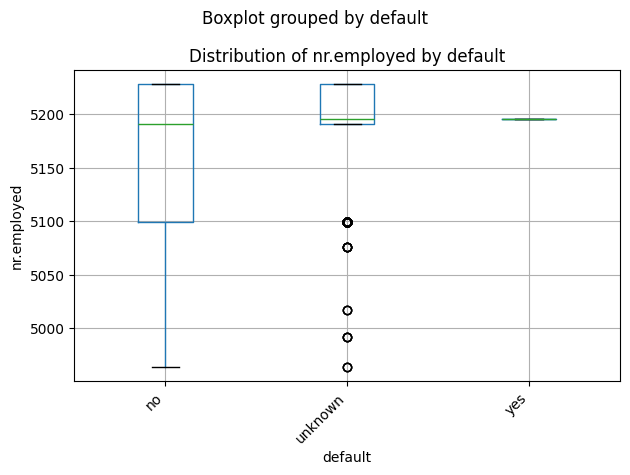

<Figure size 1000x600 with 0 Axes>

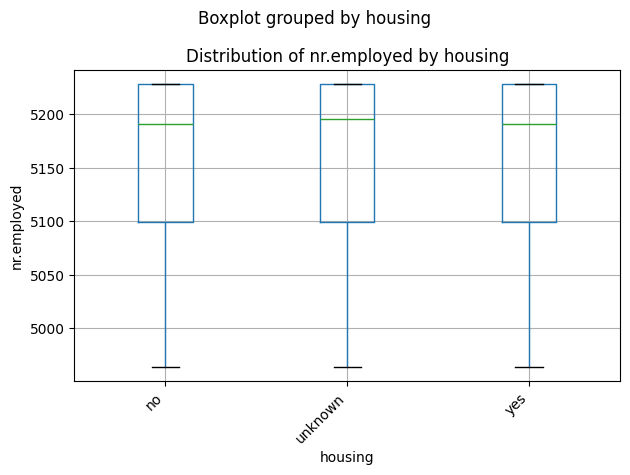

<Figure size 1000x600 with 0 Axes>

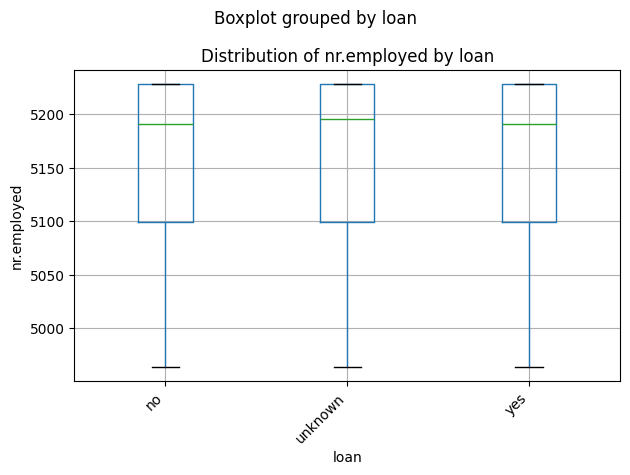

<Figure size 1000x600 with 0 Axes>

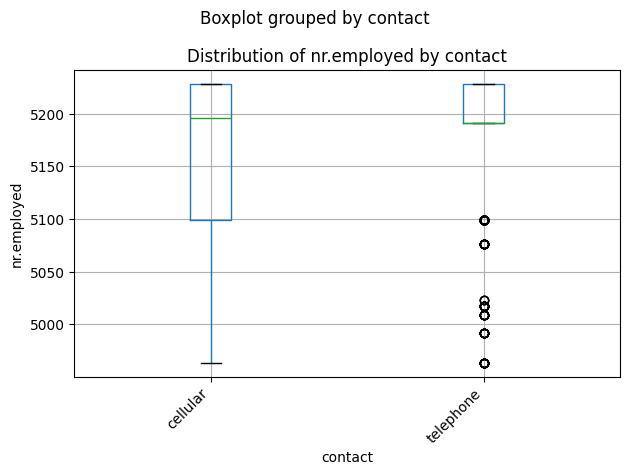

<Figure size 1000x600 with 0 Axes>

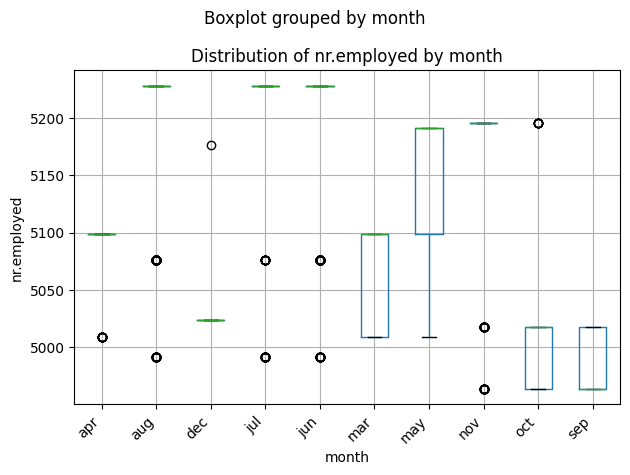

<Figure size 1000x600 with 0 Axes>

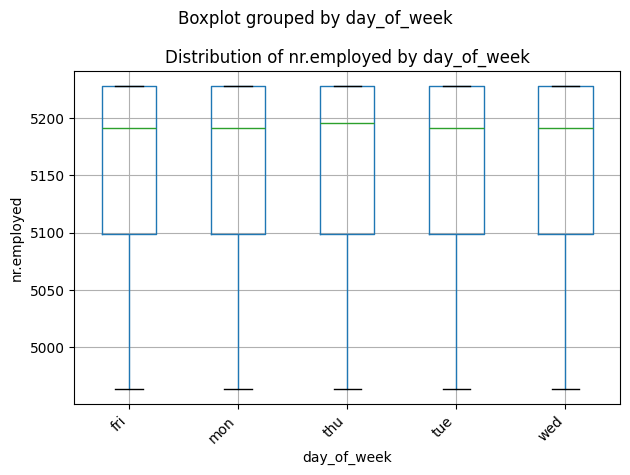

<Figure size 1000x600 with 0 Axes>

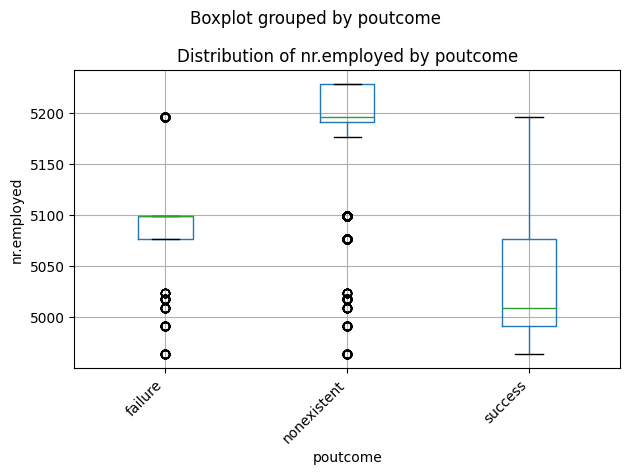

<Figure size 1000x600 with 0 Axes>

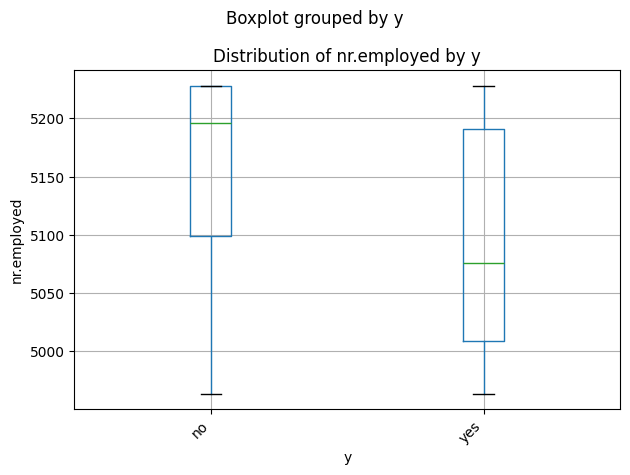

In [81]:
# Visualizing the distribution of numerical features across different categories using box plots
for num_col in numerical_cols:
    for cat_col in categorical_cols:
        plt.figure(figsize=(10, 6))
        Bank.boxplot(column=num_col, by=cat_col)
        plt.title(f'Distribution of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

<Figure size 1200x800 with 0 Axes>

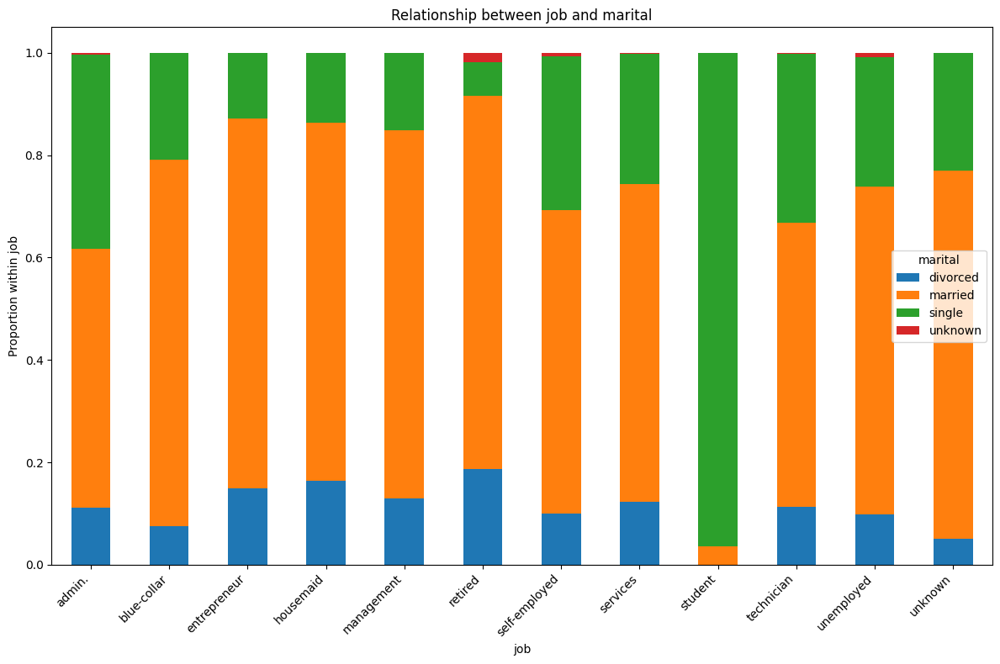

<Figure size 1200x800 with 0 Axes>

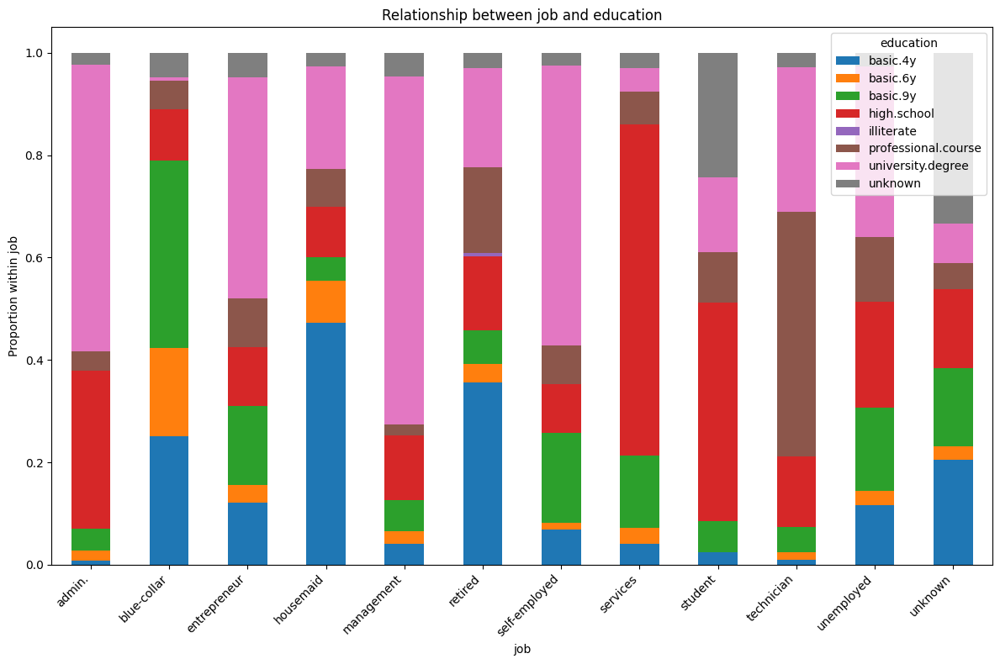

<Figure size 1200x800 with 0 Axes>

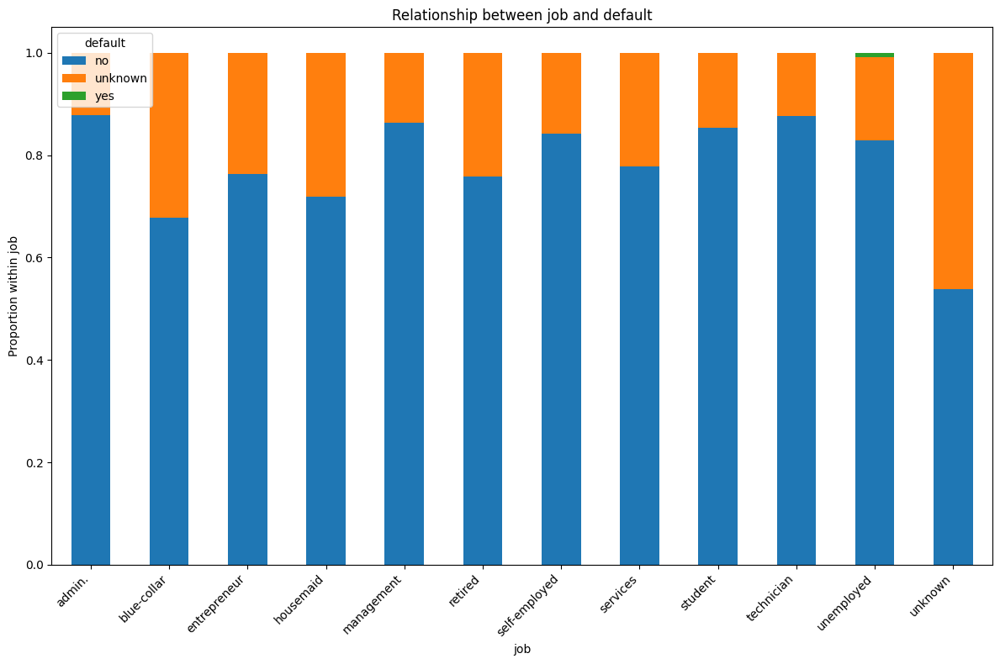

<Figure size 1200x800 with 0 Axes>

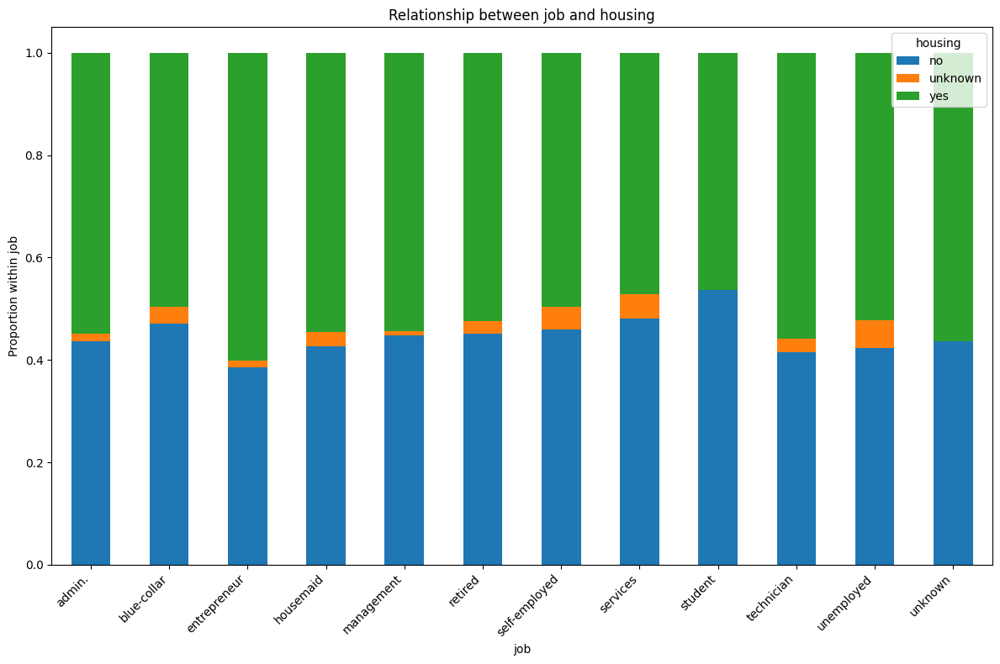

<Figure size 1200x800 with 0 Axes>

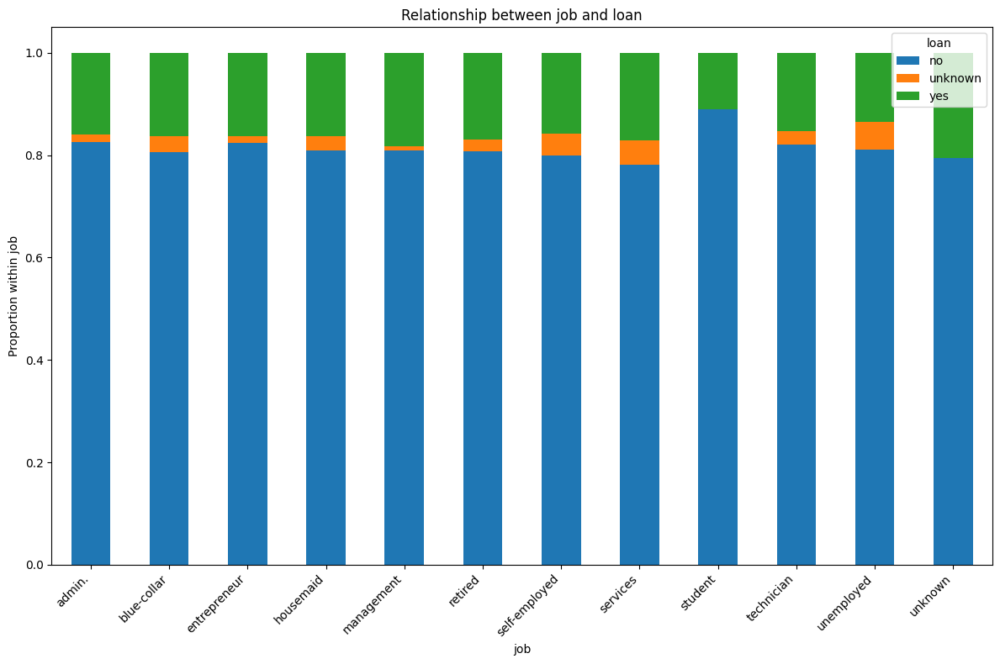

<Figure size 1200x800 with 0 Axes>

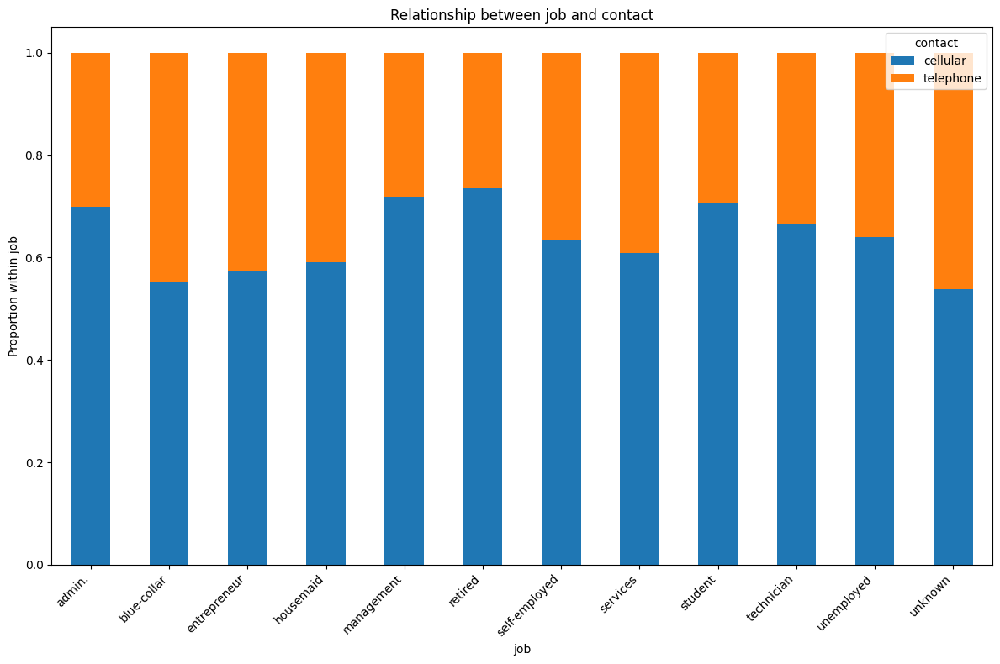

<Figure size 1200x800 with 0 Axes>

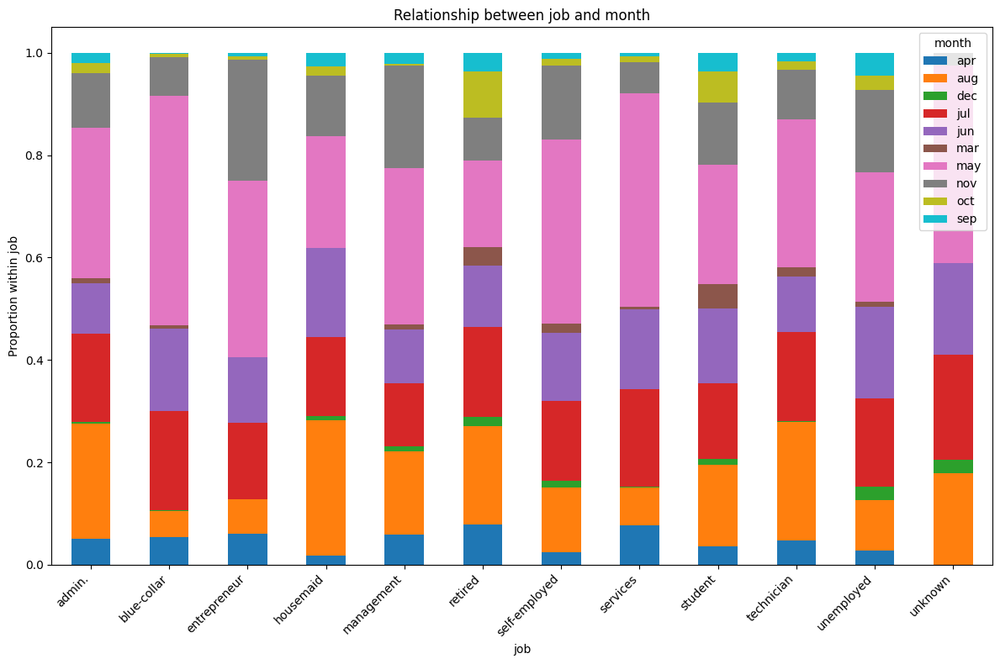

<Figure size 1200x800 with 0 Axes>

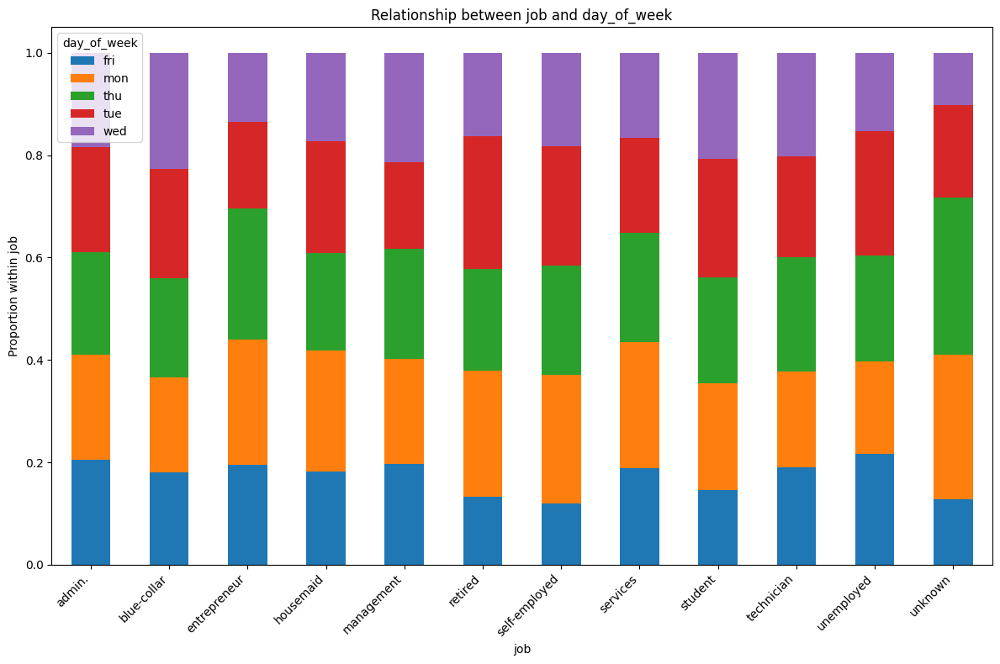

<Figure size 1200x800 with 0 Axes>

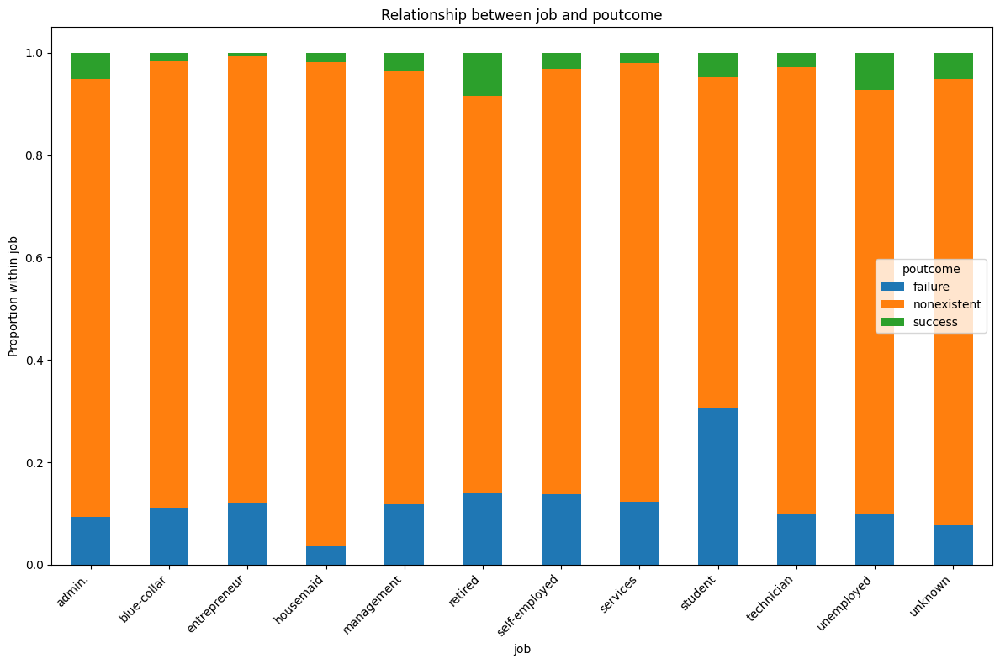

<Figure size 1200x800 with 0 Axes>

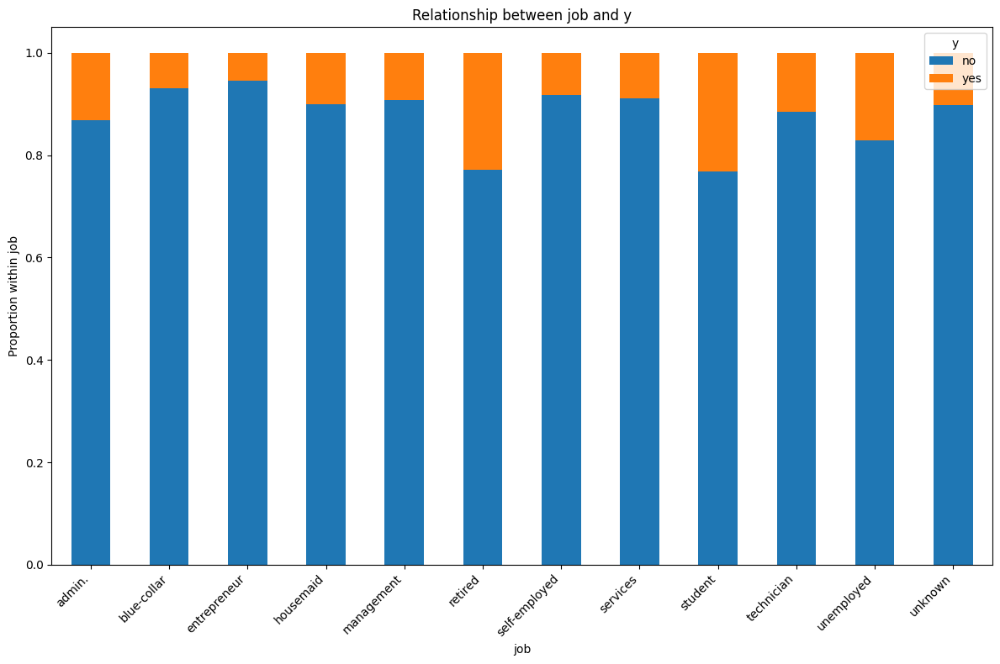

<Figure size 1200x800 with 0 Axes>

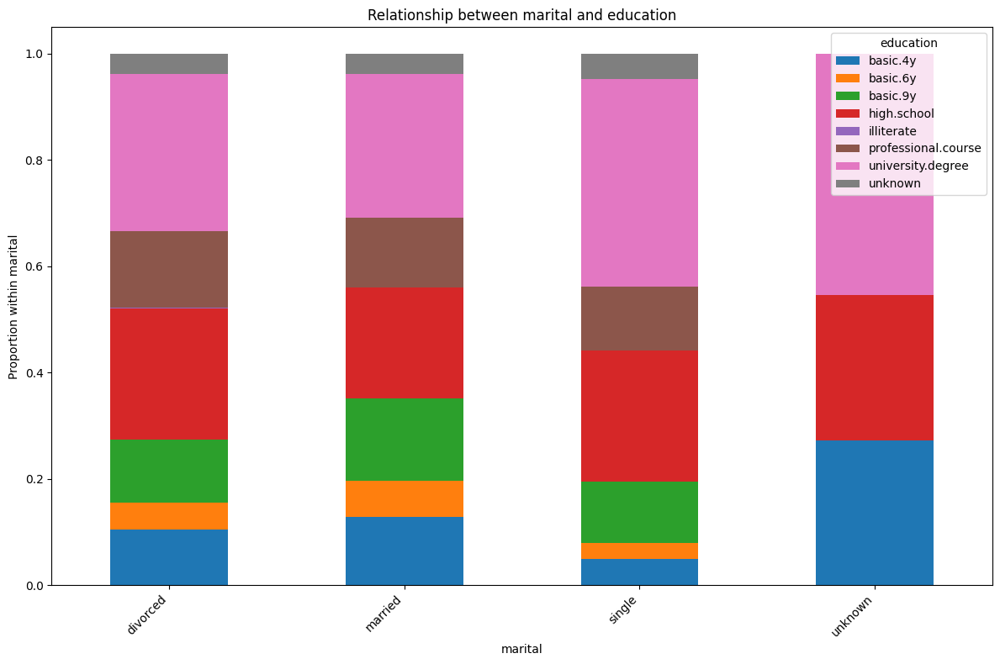

<Figure size 1200x800 with 0 Axes>

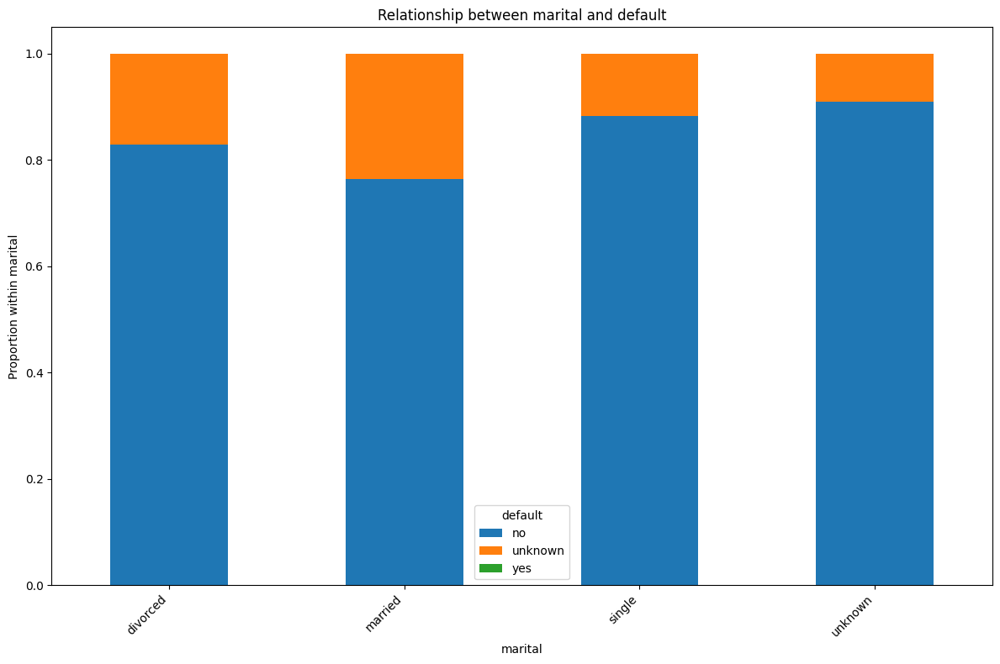

<Figure size 1200x800 with 0 Axes>

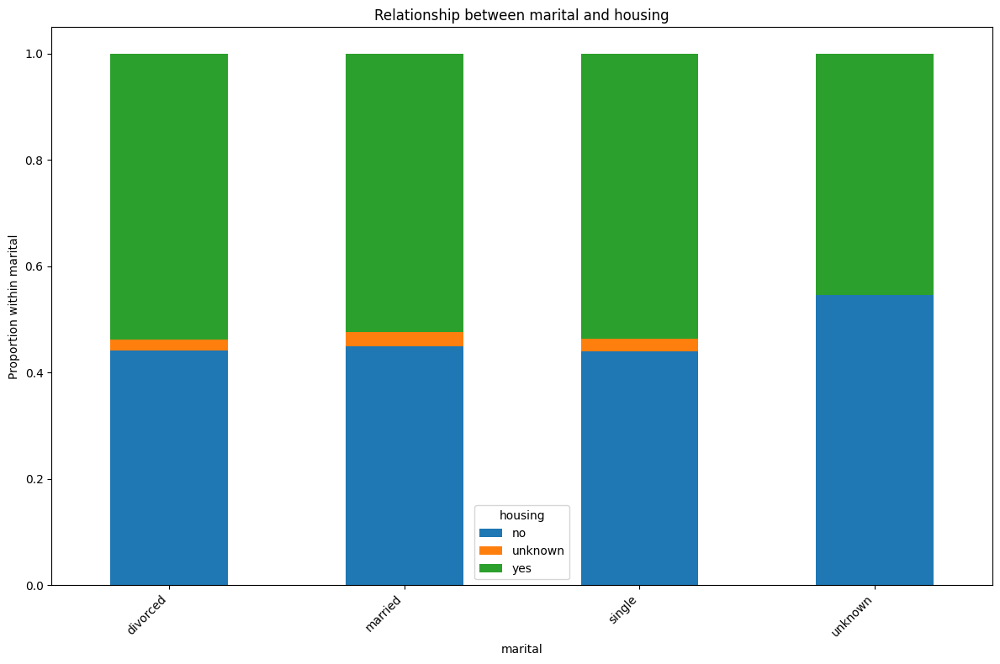

<Figure size 1200x800 with 0 Axes>

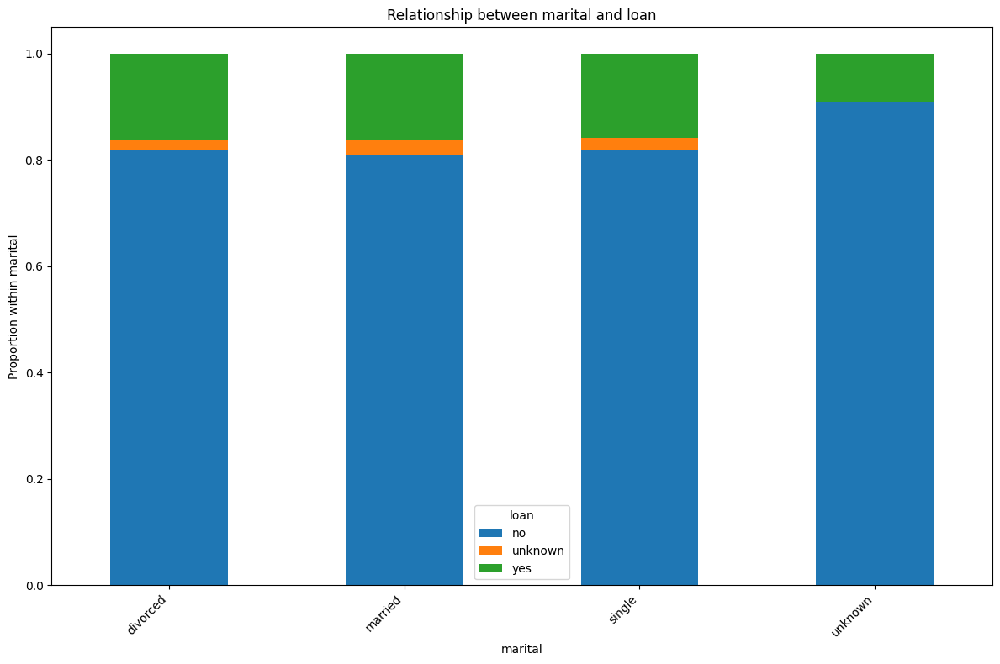

<Figure size 1200x800 with 0 Axes>

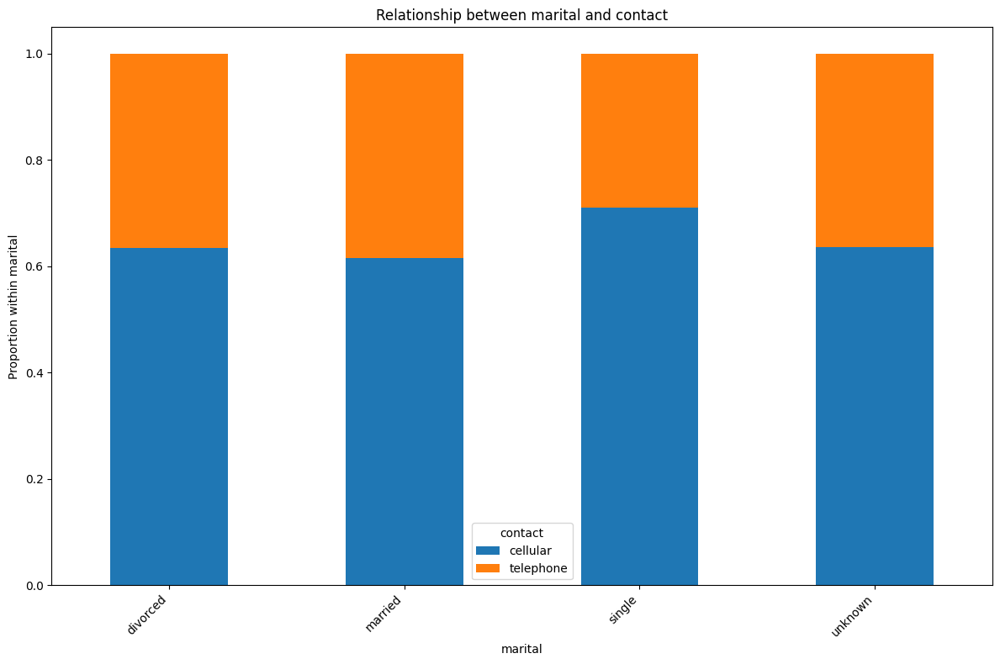

<Figure size 1200x800 with 0 Axes>

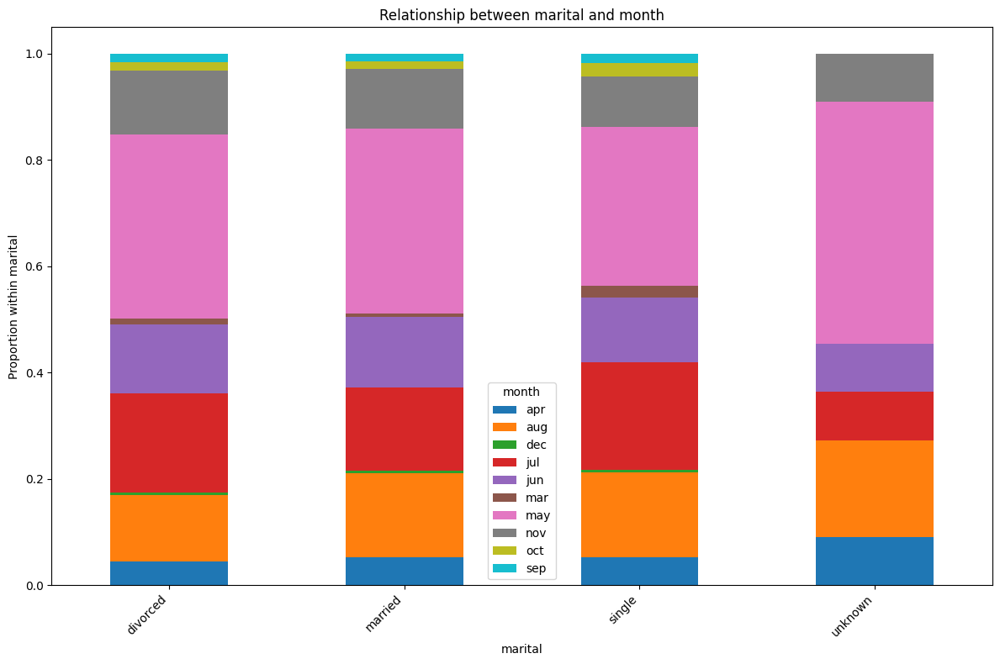

<Figure size 1200x800 with 0 Axes>

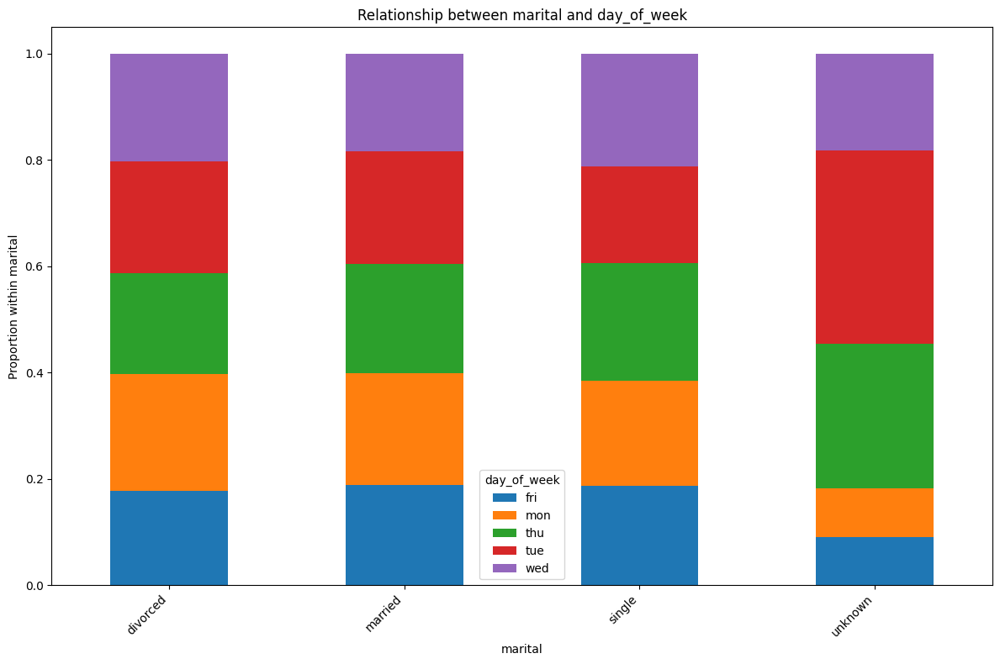

<Figure size 1200x800 with 0 Axes>

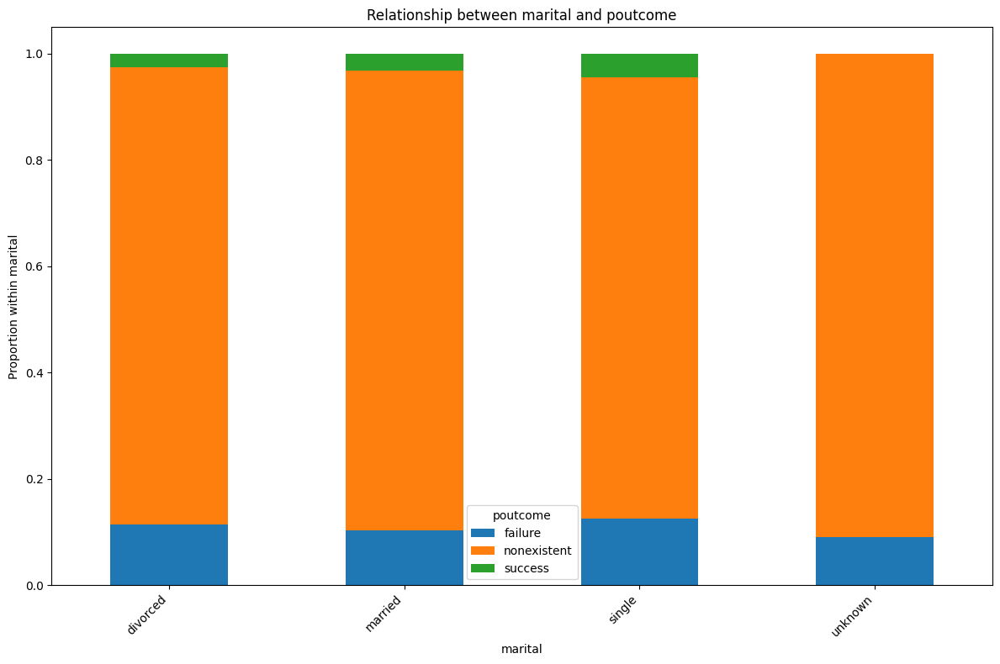

<Figure size 1200x800 with 0 Axes>

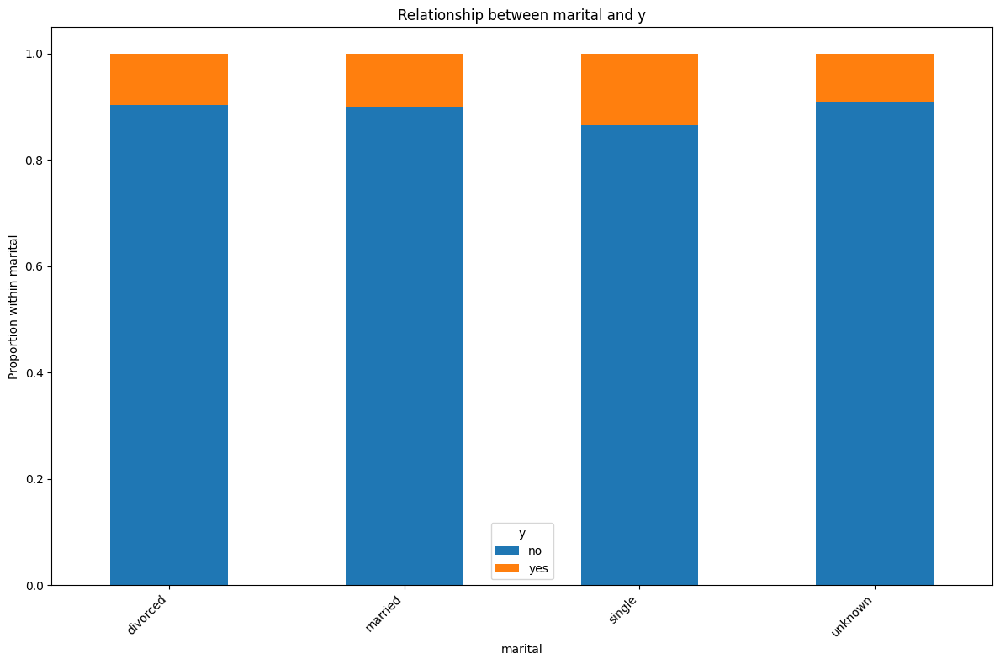

<Figure size 1200x800 with 0 Axes>

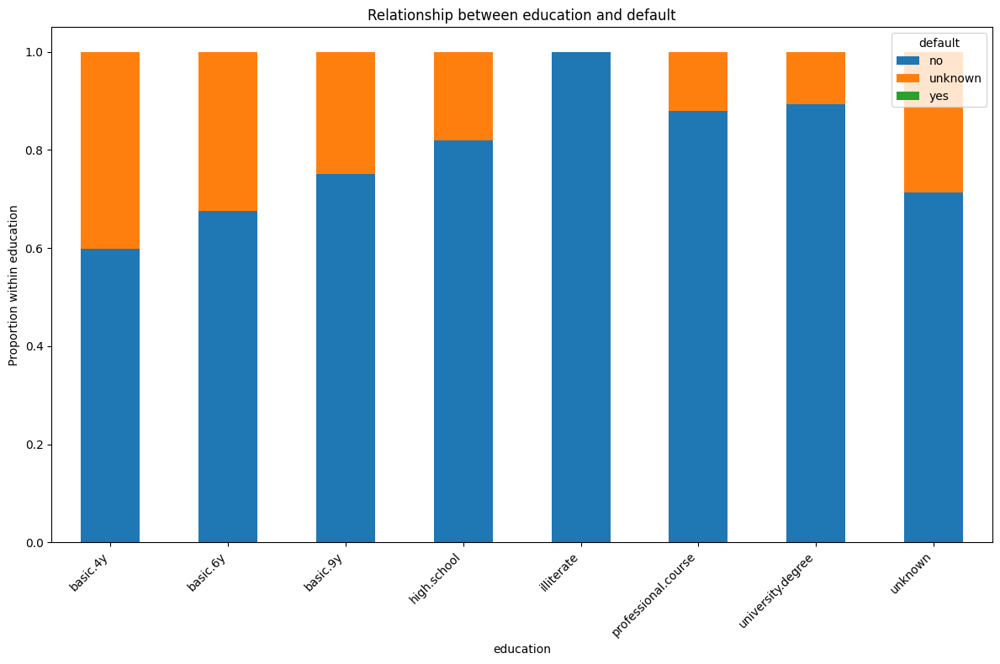

<Figure size 1200x800 with 0 Axes>

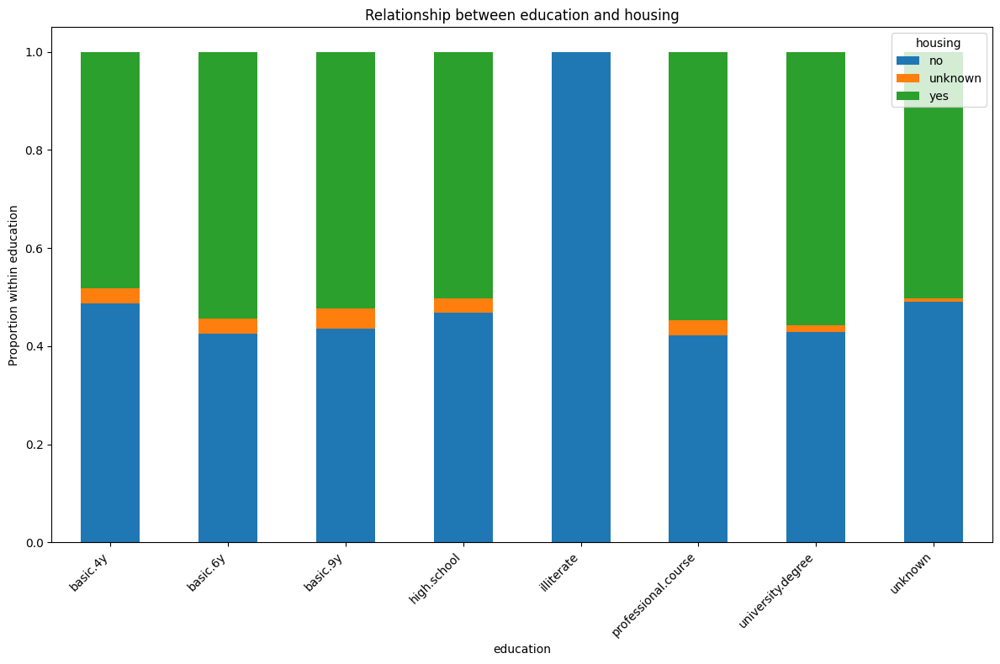

<Figure size 1200x800 with 0 Axes>

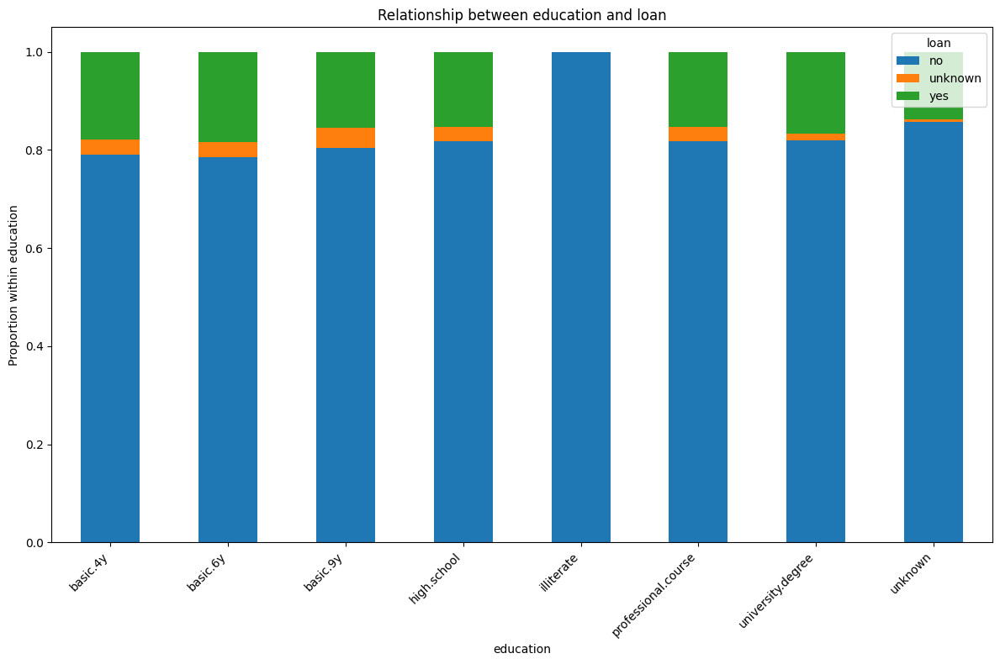

<Figure size 1200x800 with 0 Axes>

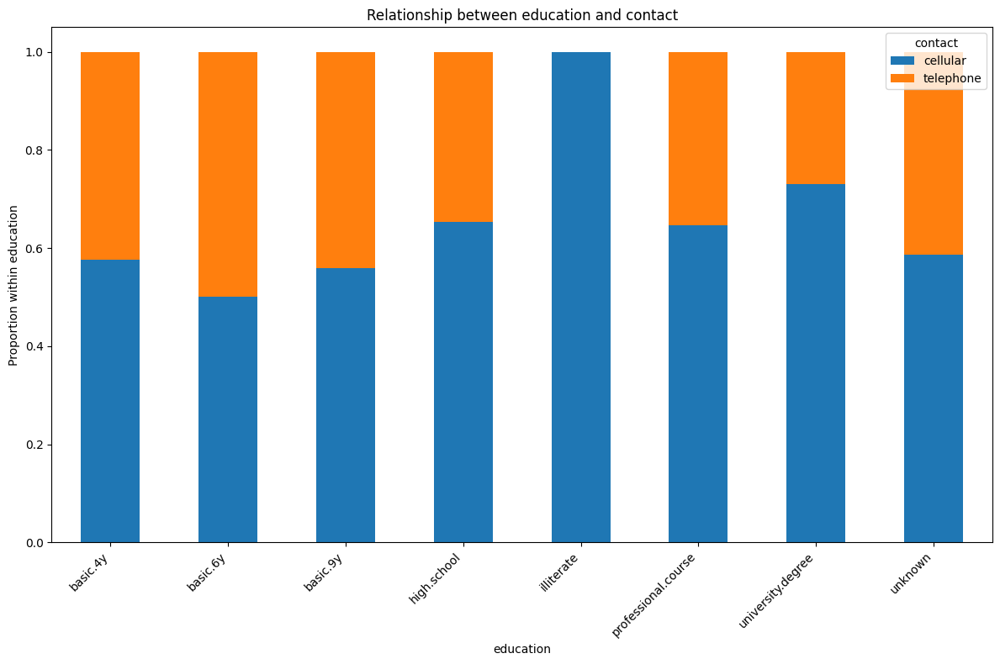

<Figure size 1200x800 with 0 Axes>

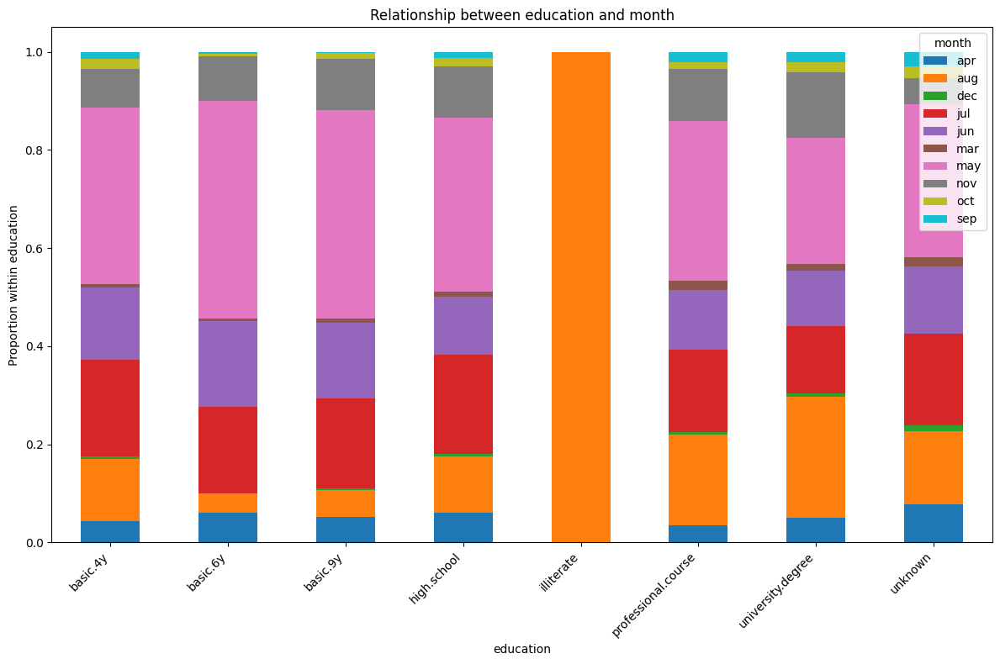

<Figure size 1200x800 with 0 Axes>

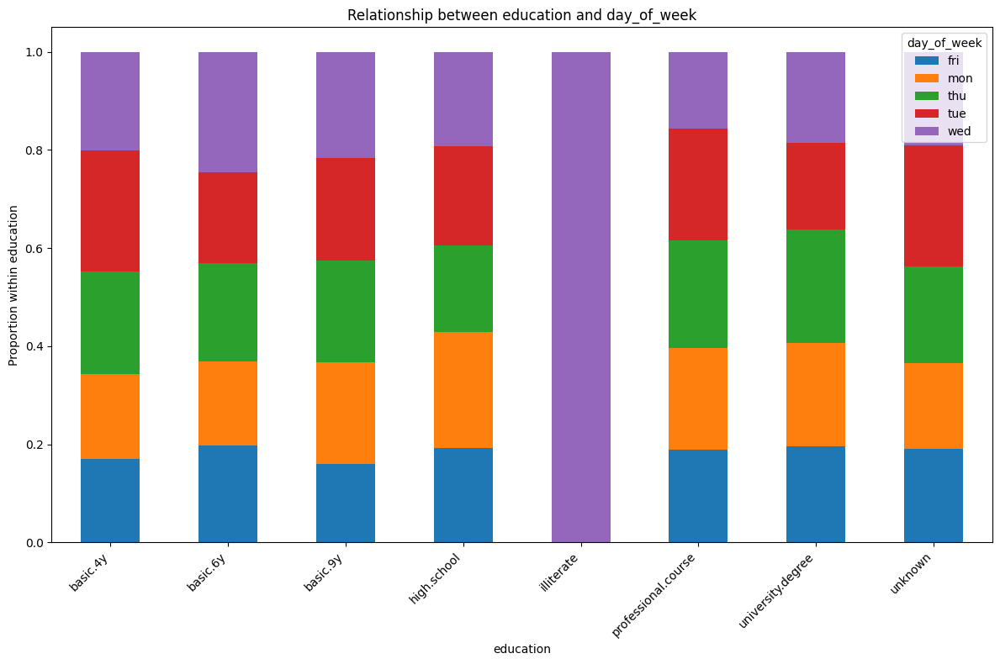

<Figure size 1200x800 with 0 Axes>

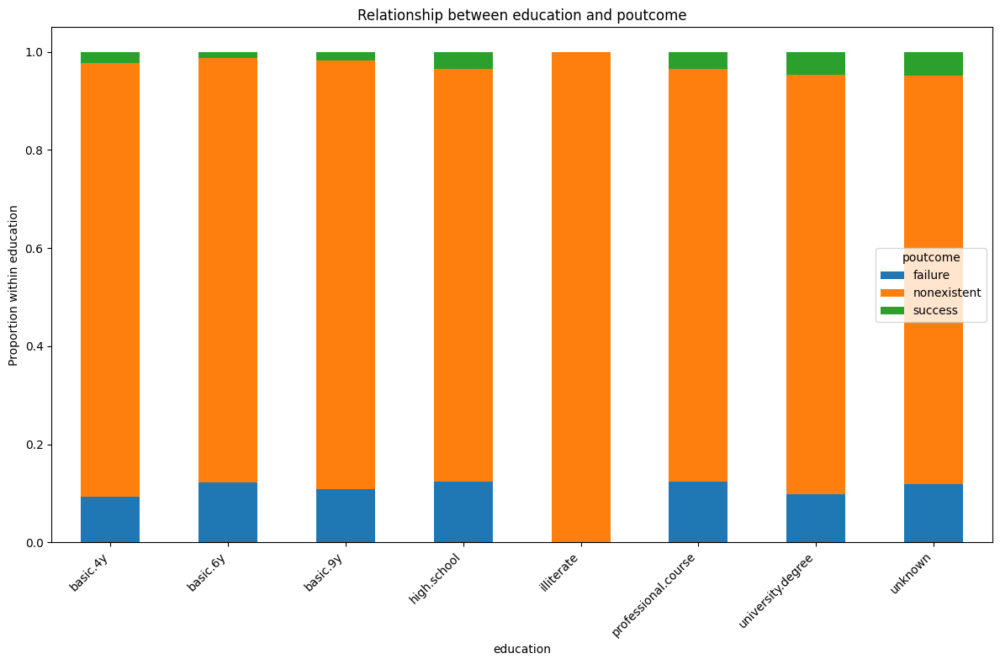

<Figure size 1200x800 with 0 Axes>

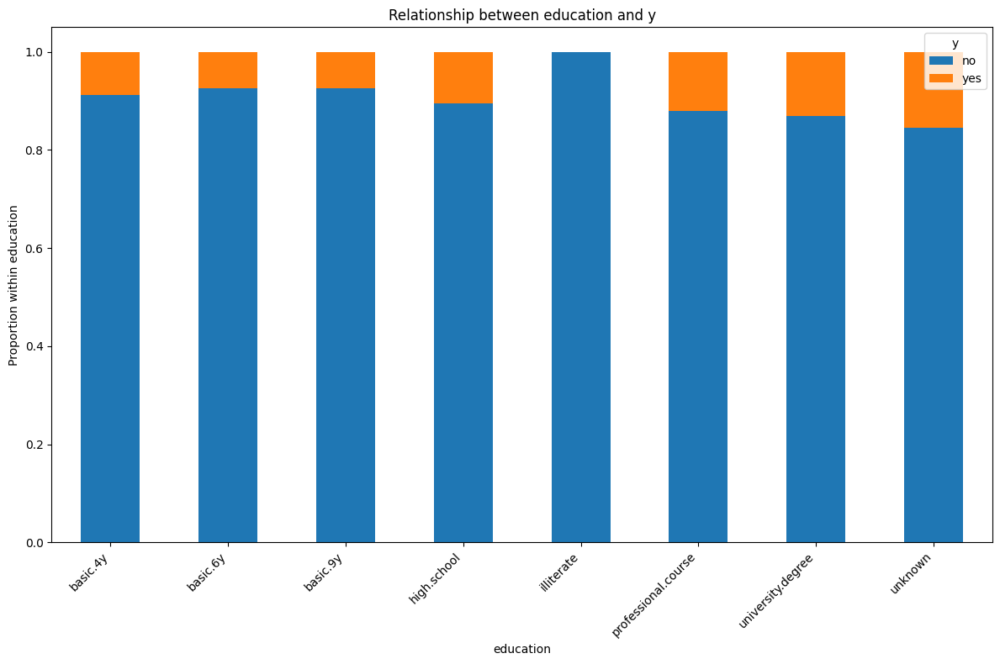

<Figure size 1200x800 with 0 Axes>

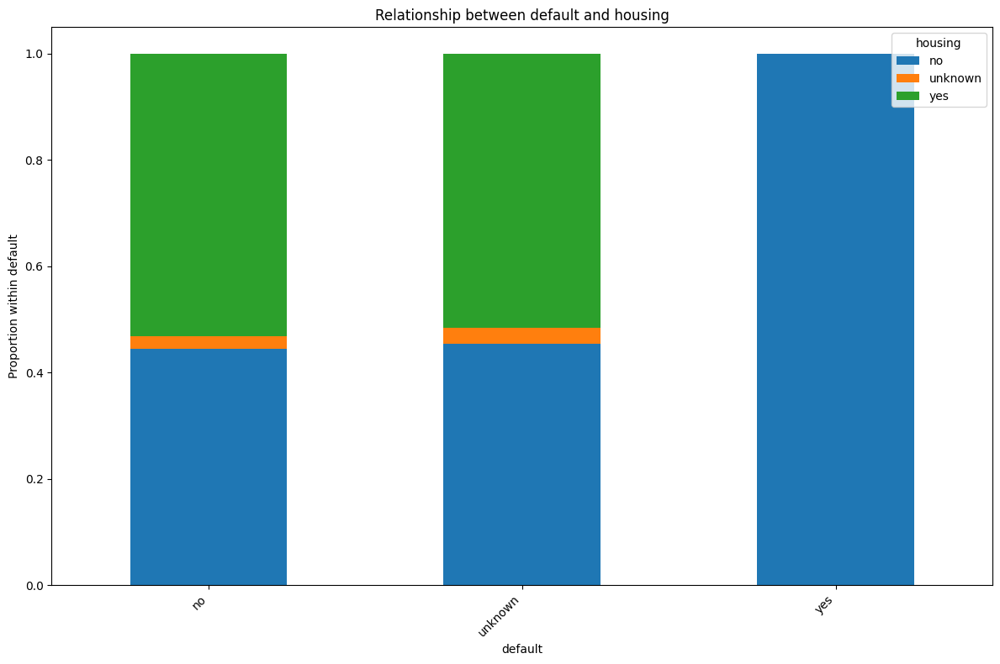

<Figure size 1200x800 with 0 Axes>

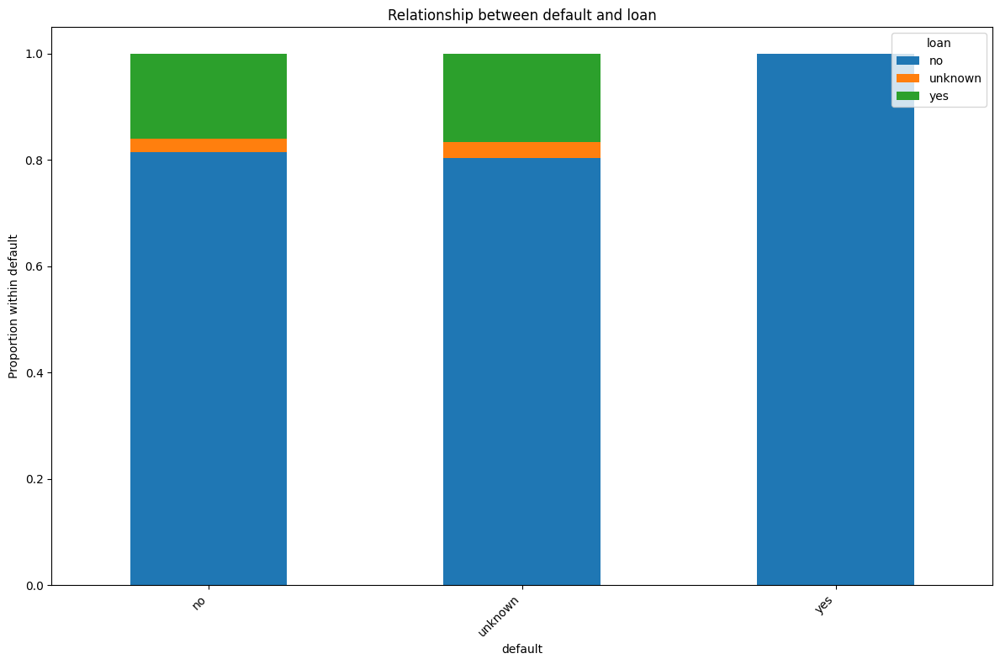

<Figure size 1200x800 with 0 Axes>

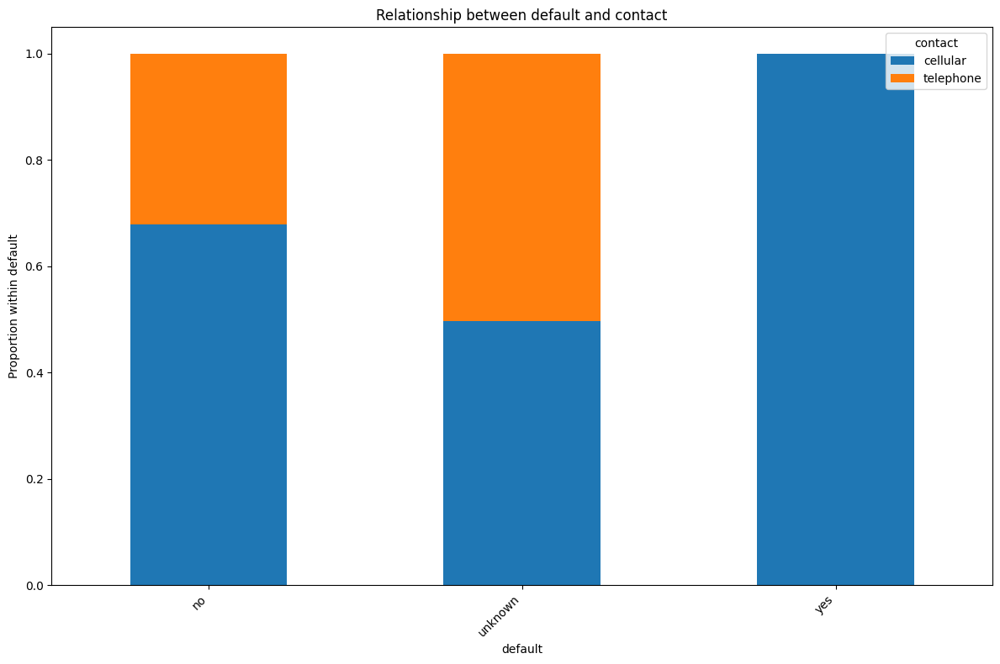

<Figure size 1200x800 with 0 Axes>

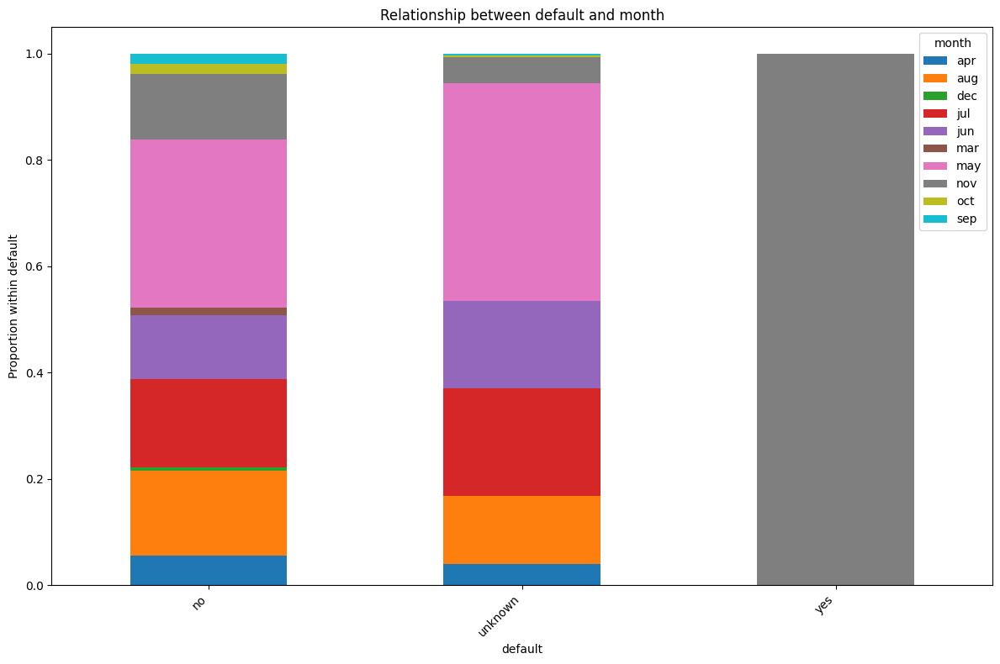

<Figure size 1200x800 with 0 Axes>

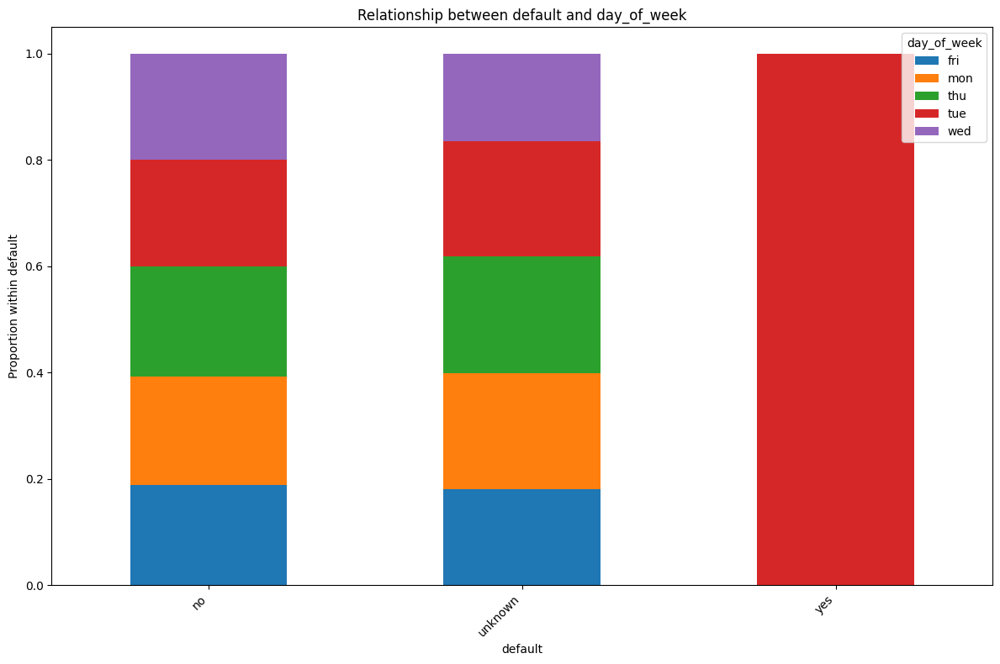

<Figure size 1200x800 with 0 Axes>

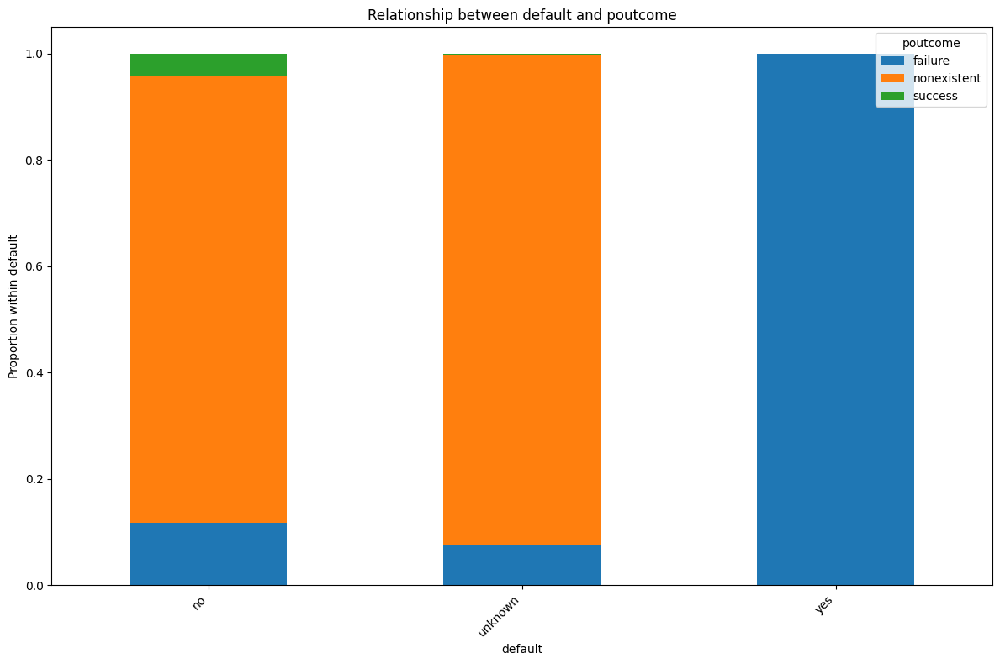

<Figure size 1200x800 with 0 Axes>

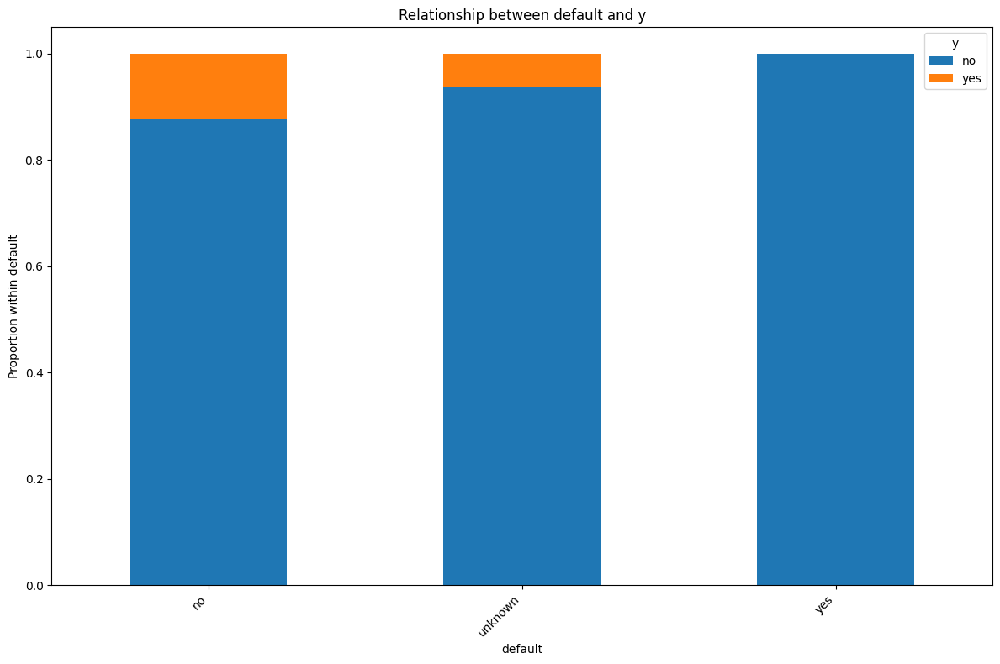

<Figure size 1200x800 with 0 Axes>

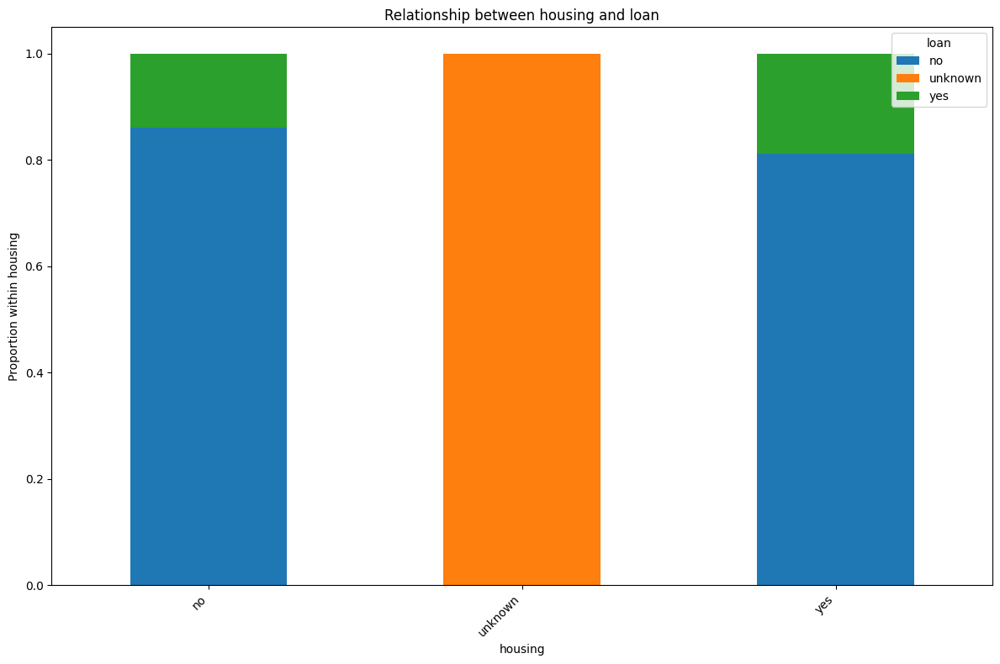

<Figure size 1200x800 with 0 Axes>

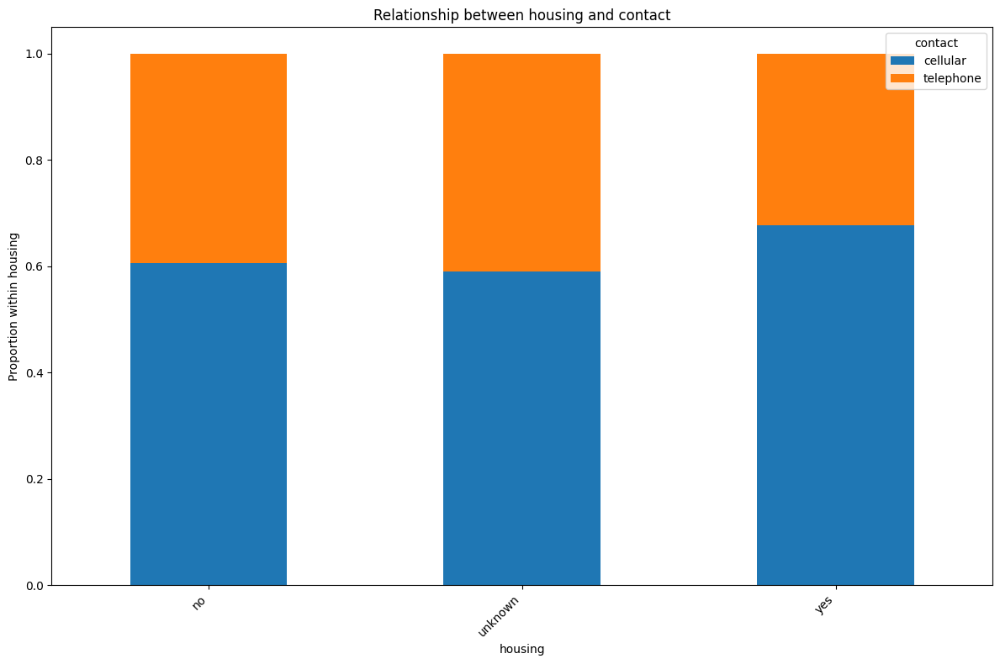

<Figure size 1200x800 with 0 Axes>

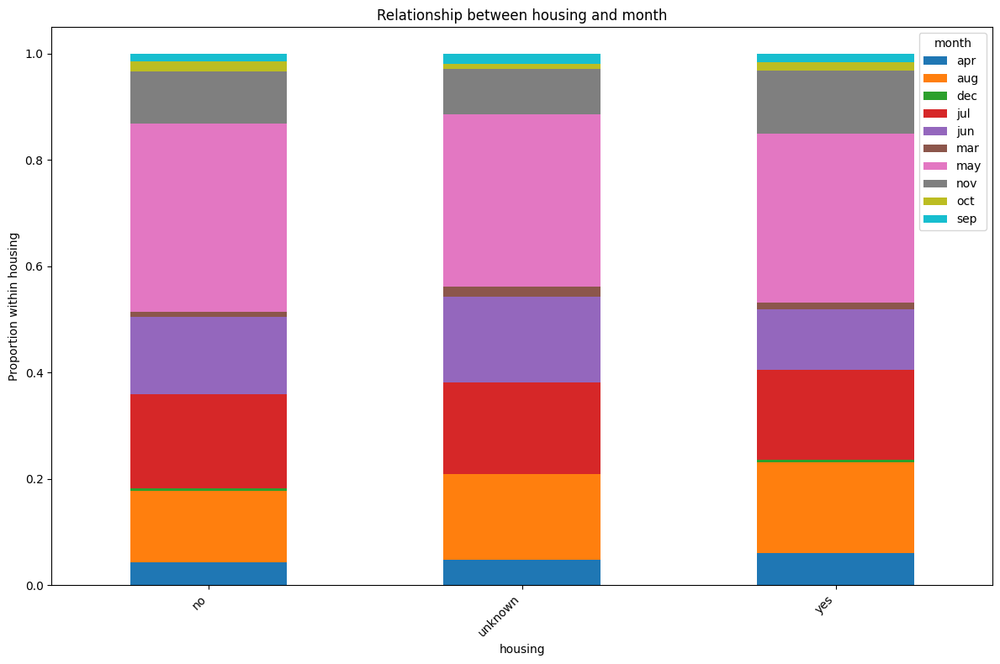

<Figure size 1200x800 with 0 Axes>

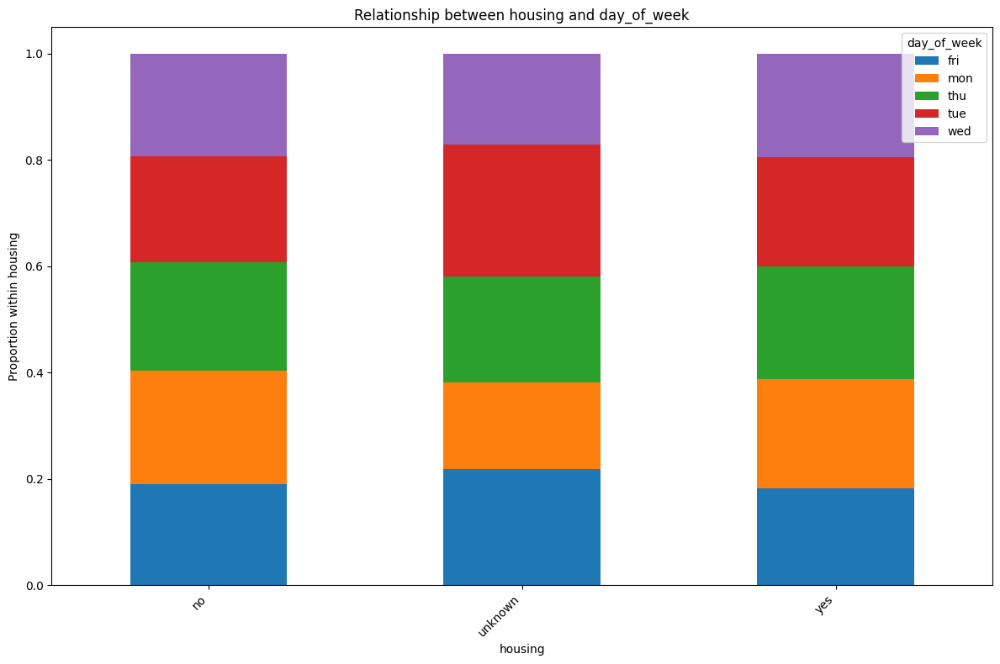

<Figure size 1200x800 with 0 Axes>

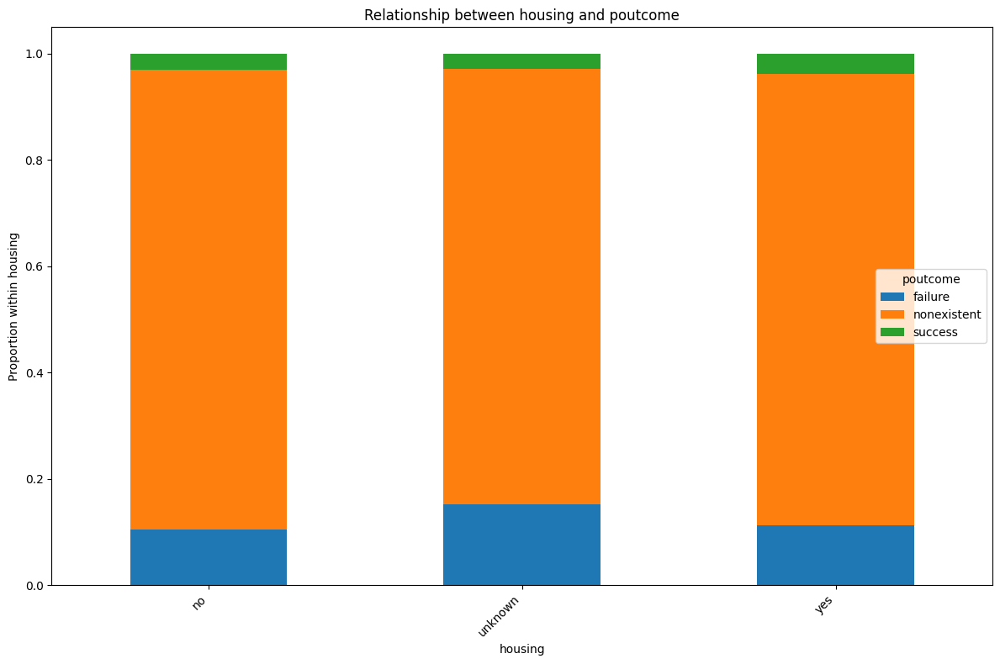

<Figure size 1200x800 with 0 Axes>

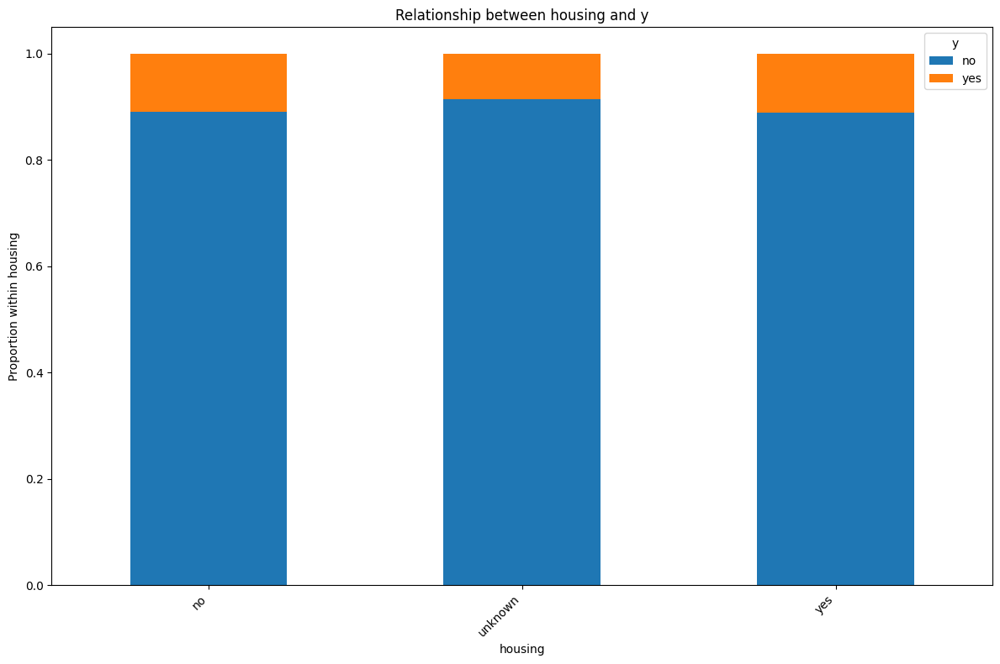

<Figure size 1200x800 with 0 Axes>

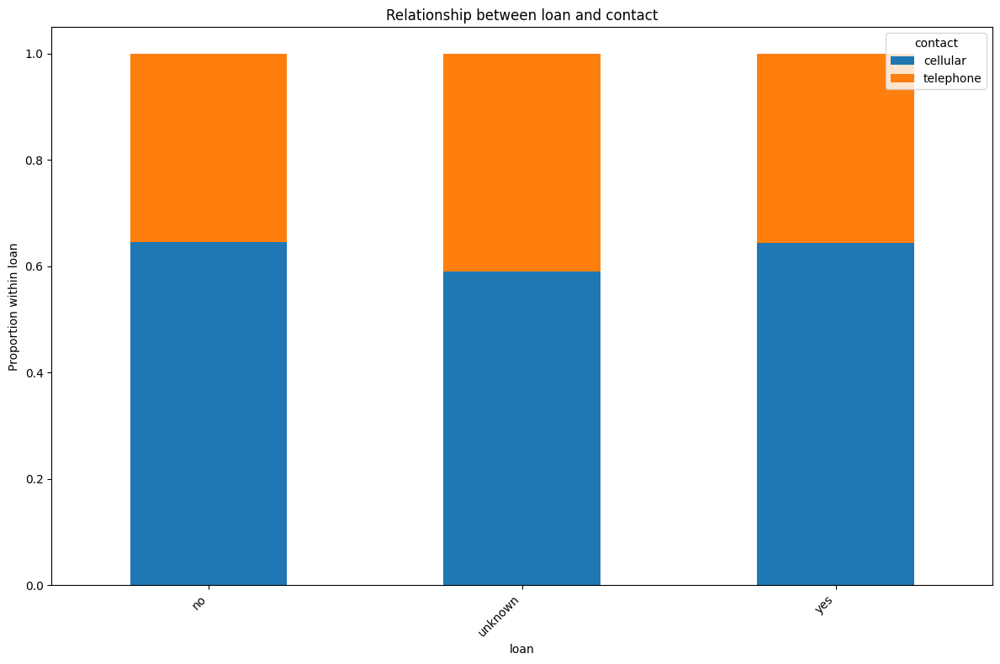

<Figure size 1200x800 with 0 Axes>

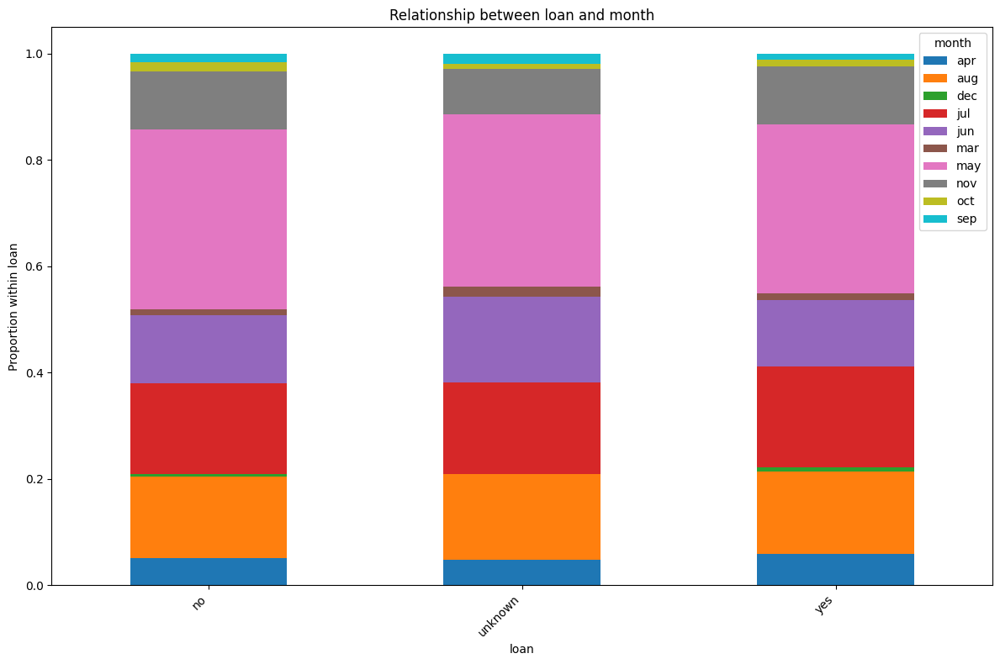

<Figure size 1200x800 with 0 Axes>

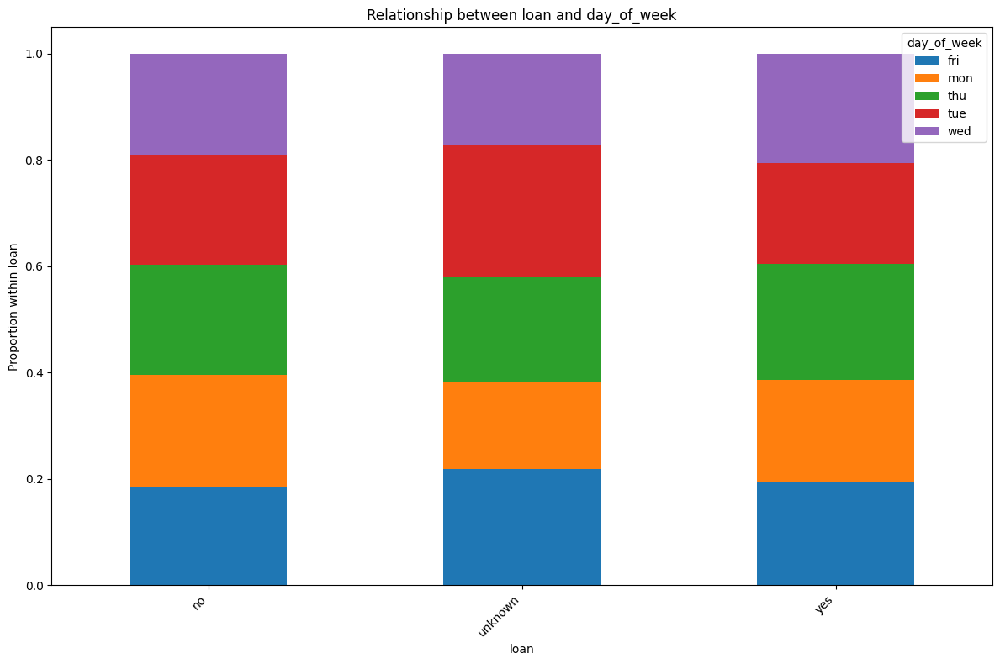

<Figure size 1200x800 with 0 Axes>

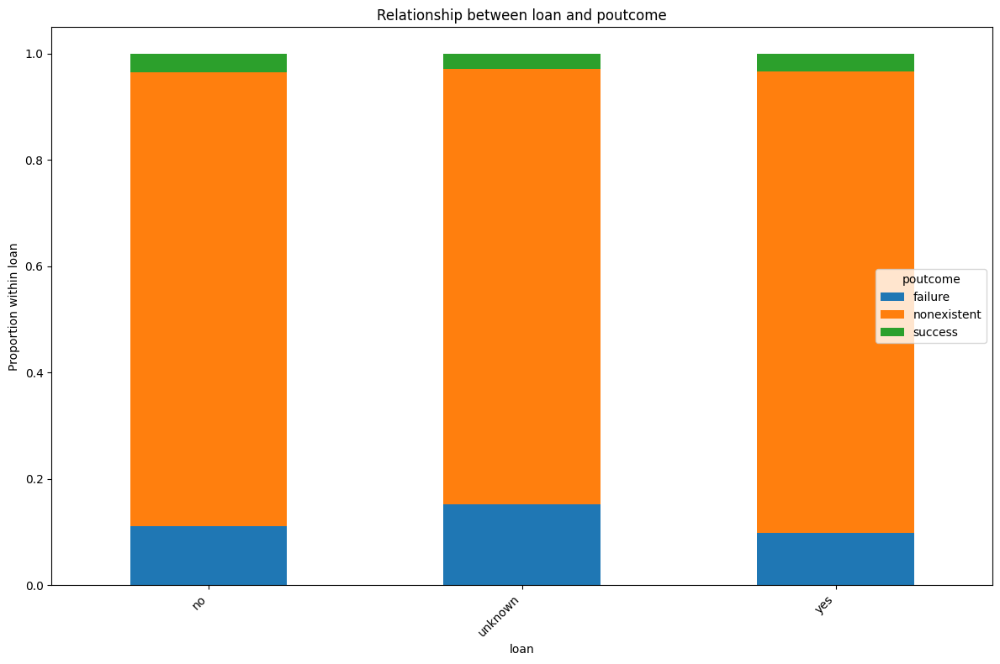

<Figure size 1200x800 with 0 Axes>

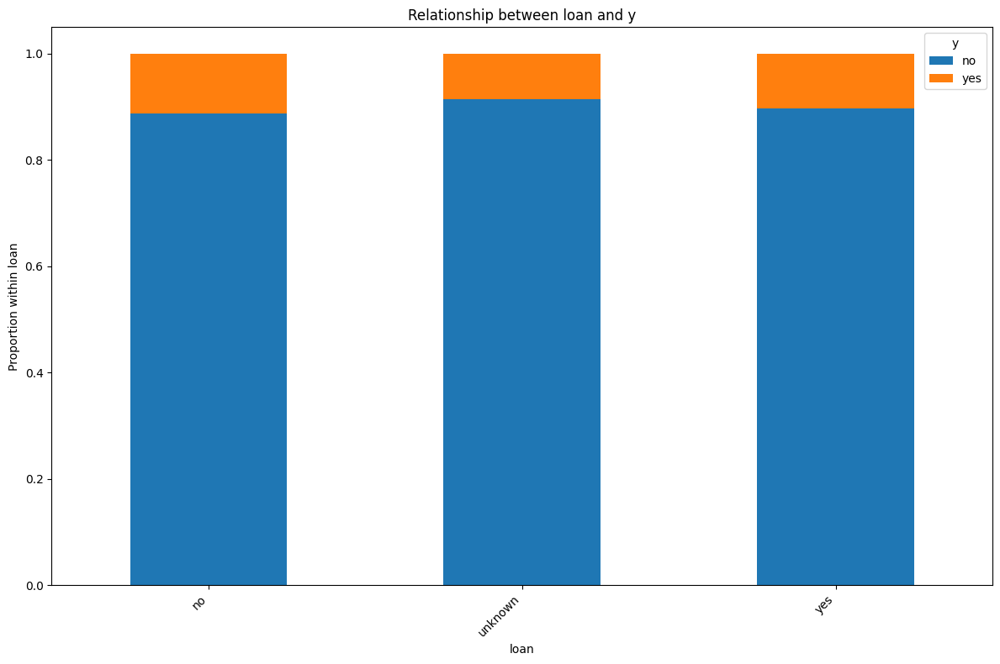

<Figure size 1200x800 with 0 Axes>

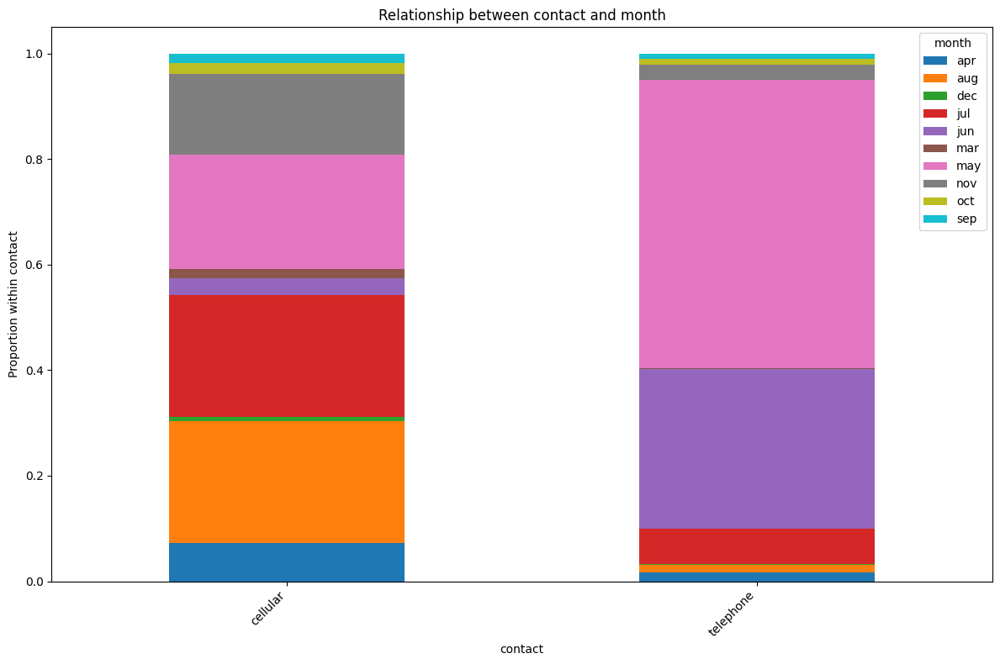

<Figure size 1200x800 with 0 Axes>

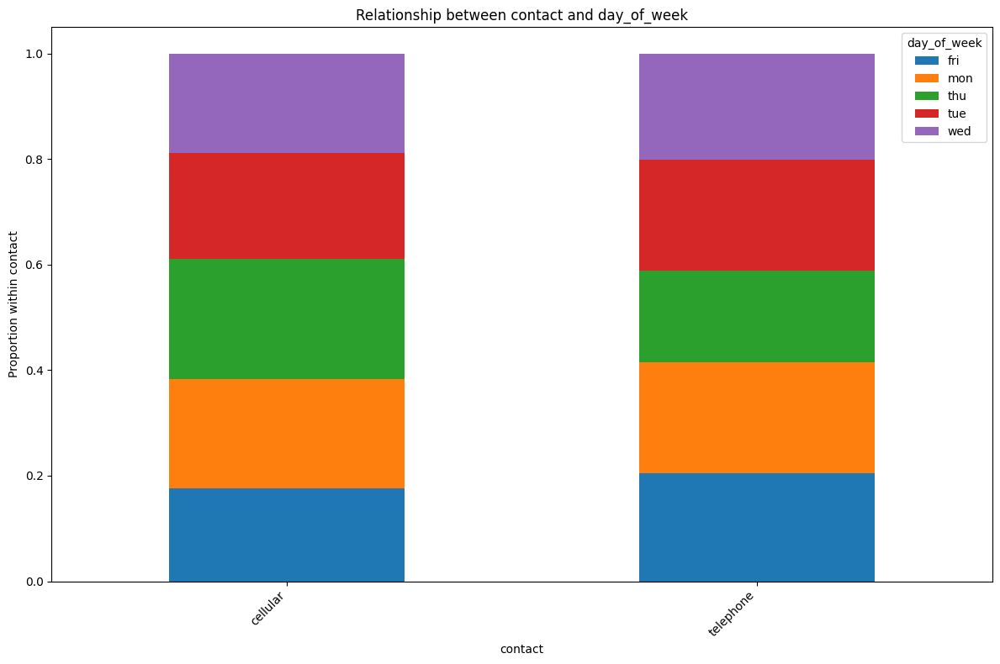

<Figure size 1200x800 with 0 Axes>

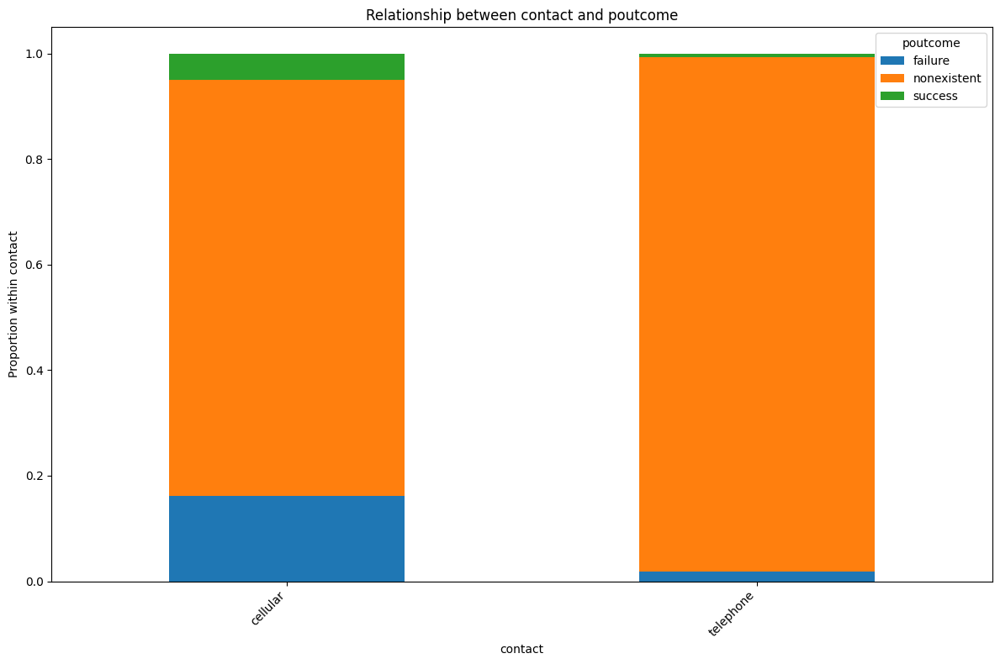

<Figure size 1200x800 with 0 Axes>

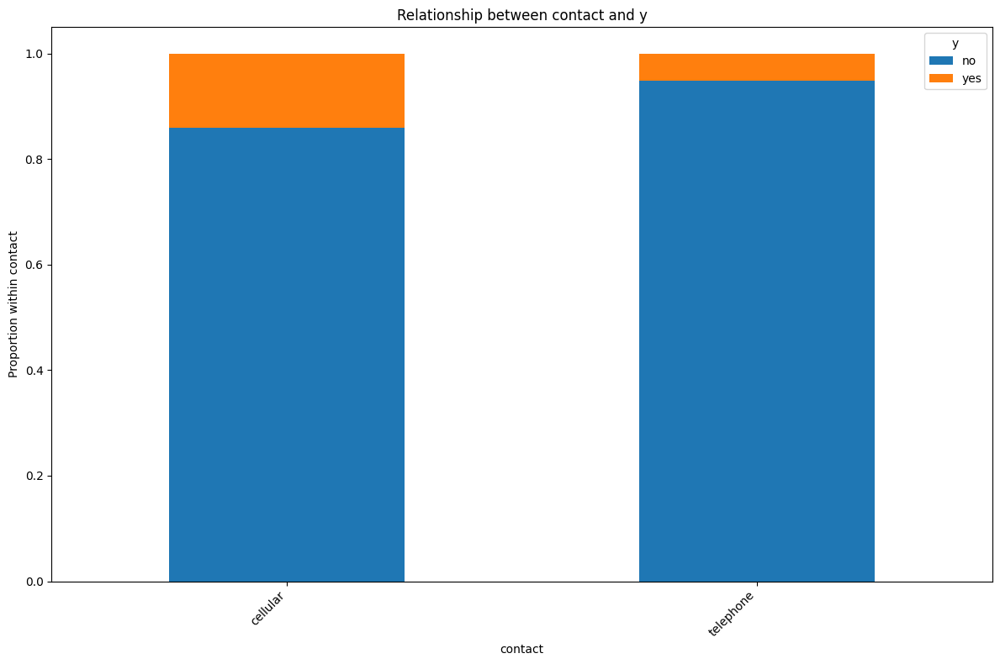

<Figure size 1200x800 with 0 Axes>

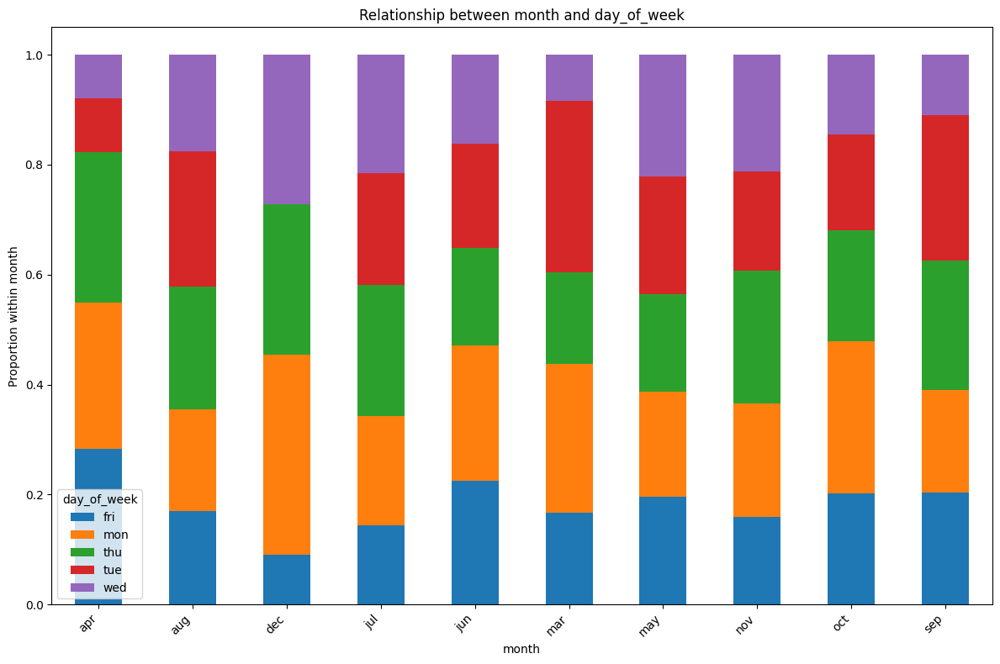

<Figure size 1200x800 with 0 Axes>

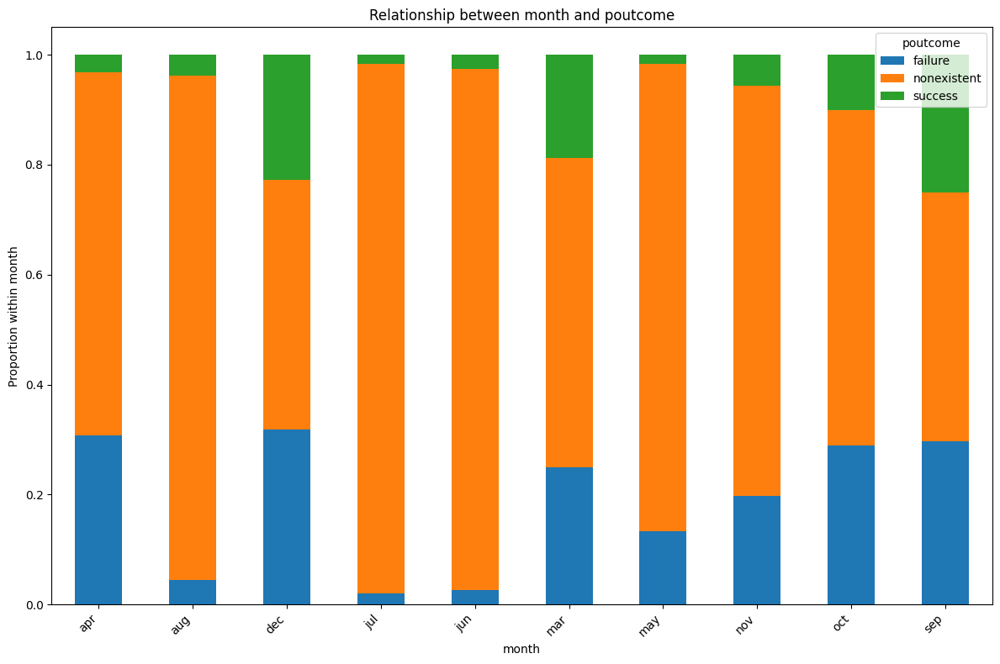

<Figure size 1200x800 with 0 Axes>

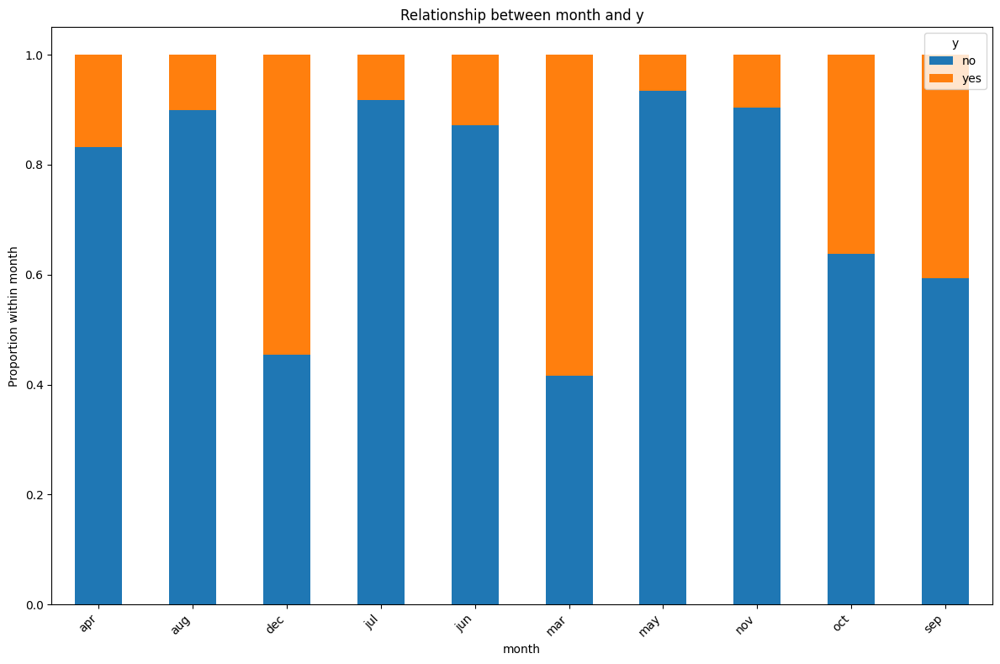

<Figure size 1200x800 with 0 Axes>

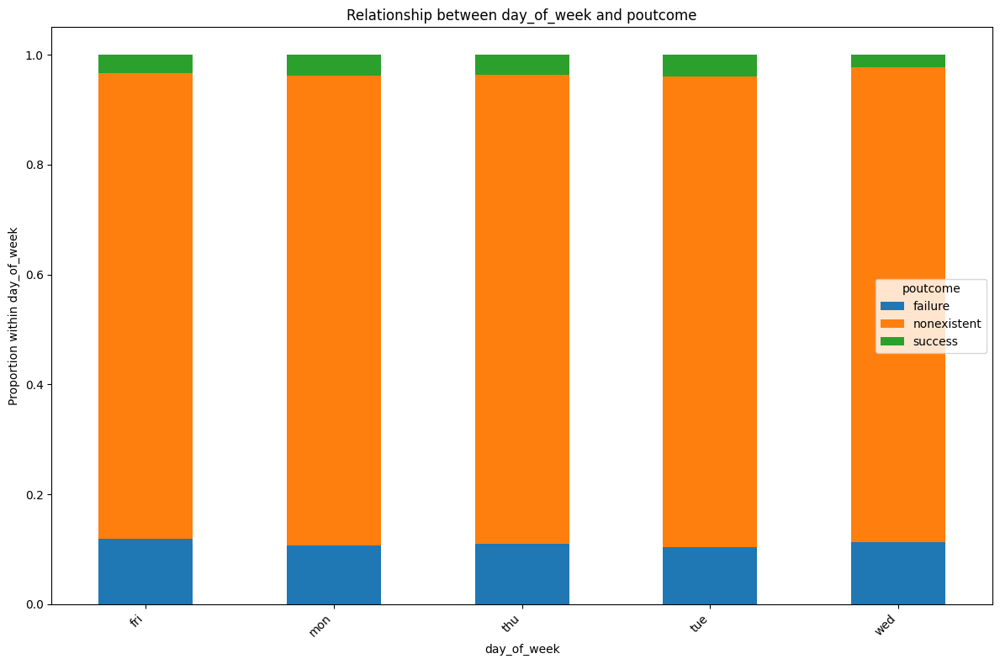

<Figure size 1200x800 with 0 Axes>

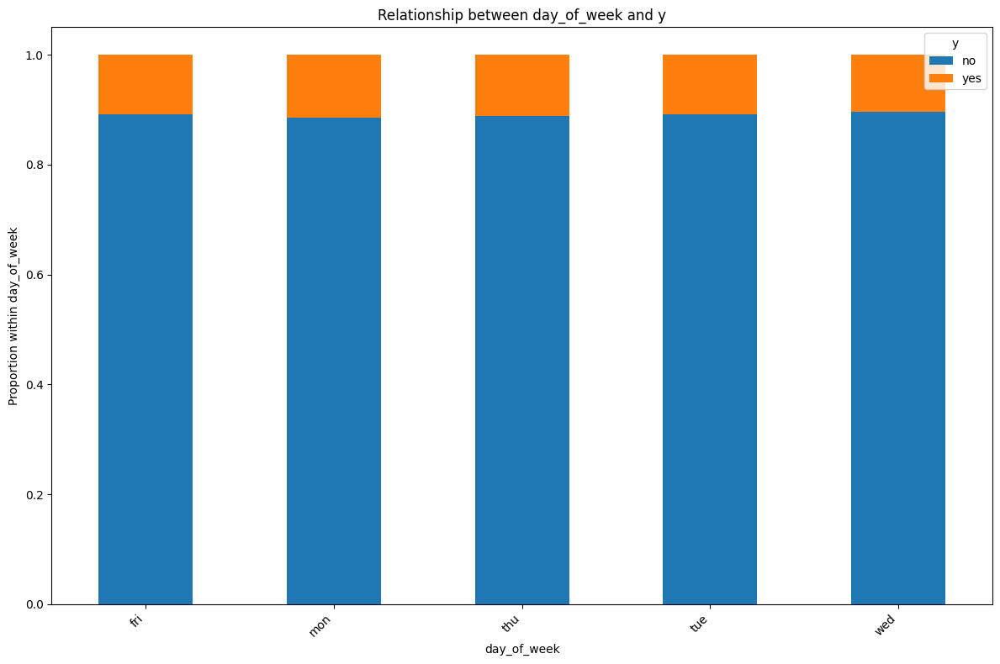

<Figure size 1200x800 with 0 Axes>

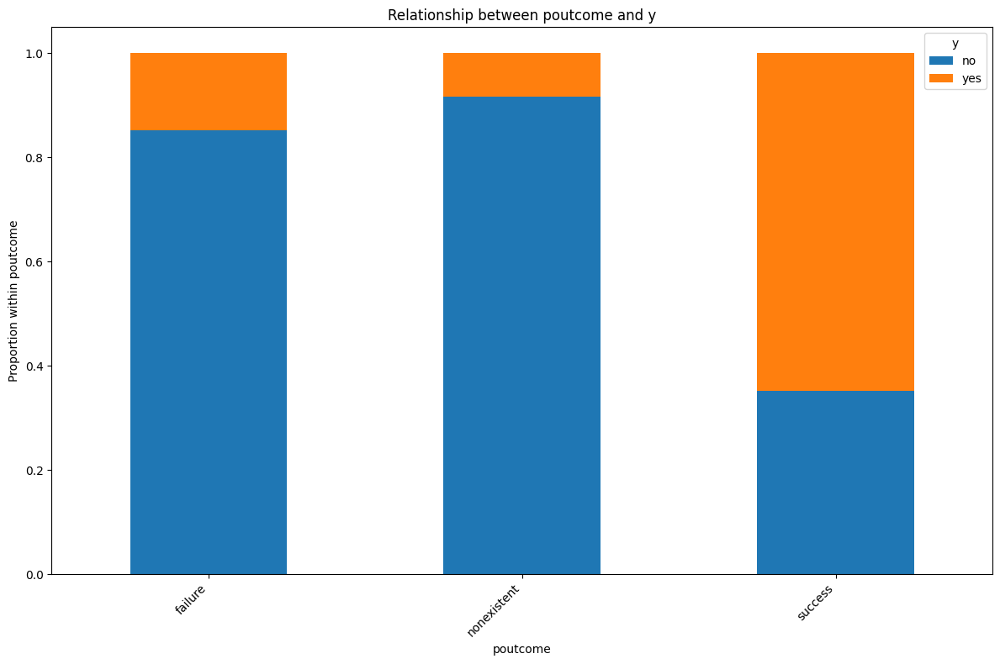

In [82]:
# Iterating through all unique pairs of categorical columns
for i in range(len(categorical_cols)):
    for j in range(i + 1, len(categorical_cols)):
        cat_col1 = categorical_cols[i]
        cat_col2 = categorical_cols[j]

        # Creating a contingency table
        contingency_table = pd.crosstab(Bank[cat_col1], Bank[cat_col2])

        # Normalizing the contingency table
        normalized_contingency_table = contingency_table.div(contingency_table.sum(axis=1), axis=0)

        # Generating a stacked bar plot
        plt.figure(figsize=(12, 8))
        normalized_contingency_table.plot(kind='bar', stacked=True, figsize=(12, 8))

        # Adding title and labels
        plt.title(f'Relationship between {cat_col1} and {cat_col2}')
        plt.xlabel(cat_col1)
        plt.ylabel(f'Proportion within {cat_col1}')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=cat_col2)
        plt.tight_layout()
        plt.show()

Distribution of target variable 'y':


,count
y,
no,3668
yes,451


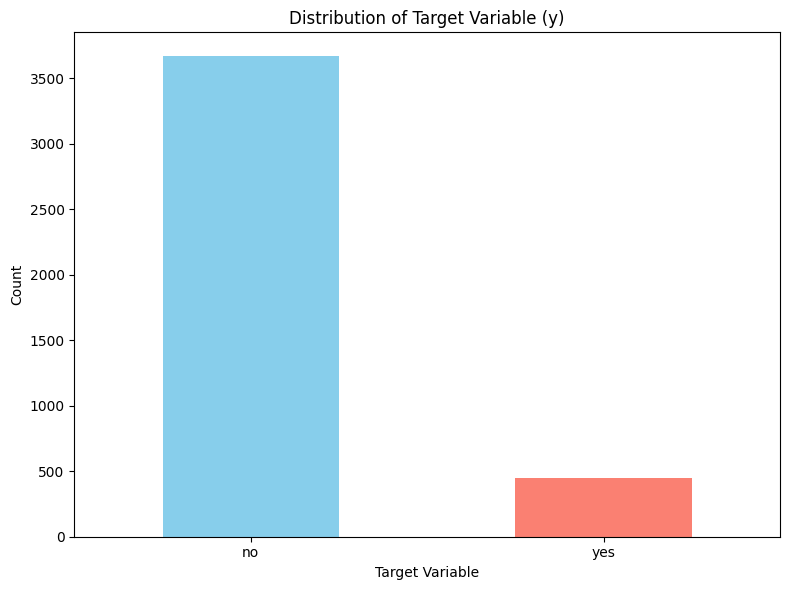

In [83]:
# Calculating and printing the value counts of the target variable 'y'
target_distribution = Bank['y'].value_counts()
print("Distribution of target variable 'y':")
display(target_distribution)

# Creating a bar plot to visualize the distribution of the target variable 'y'
plt.figure(figsize=(8, 6))
target_distribution.plot(kind='bar', color=['skyblue', 'salmon'])

# Adding title and labels to the bar plot
plt.title('Distribution of Target Variable (y)')
plt.xlabel('Target Variable')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()

# Displaying the bar plot
plt.show()

In [84]:
# Identifying numerical and categorical columns
numerical_cols = Bank.select_dtypes(include=np.number).columns
categorical_cols = Bank.select_dtypes(include='object').columns.drop('y') # Exclude the target variable 'y'

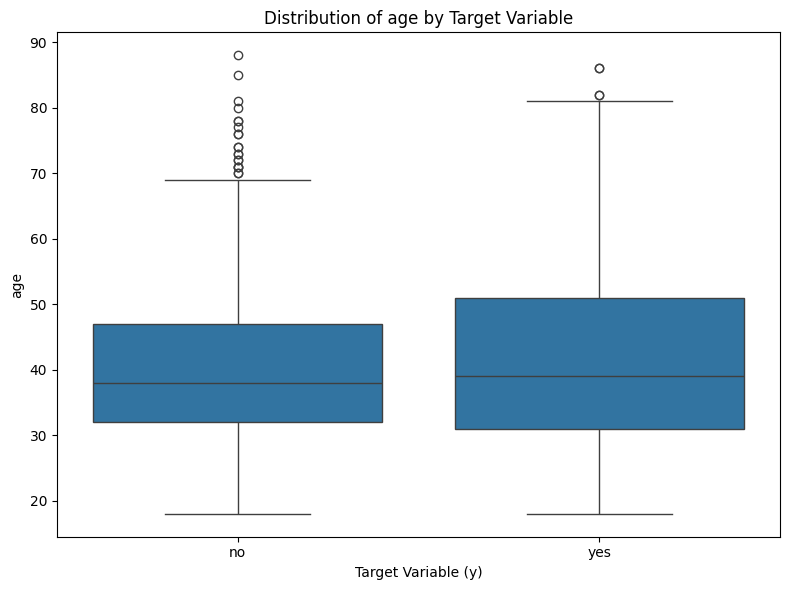

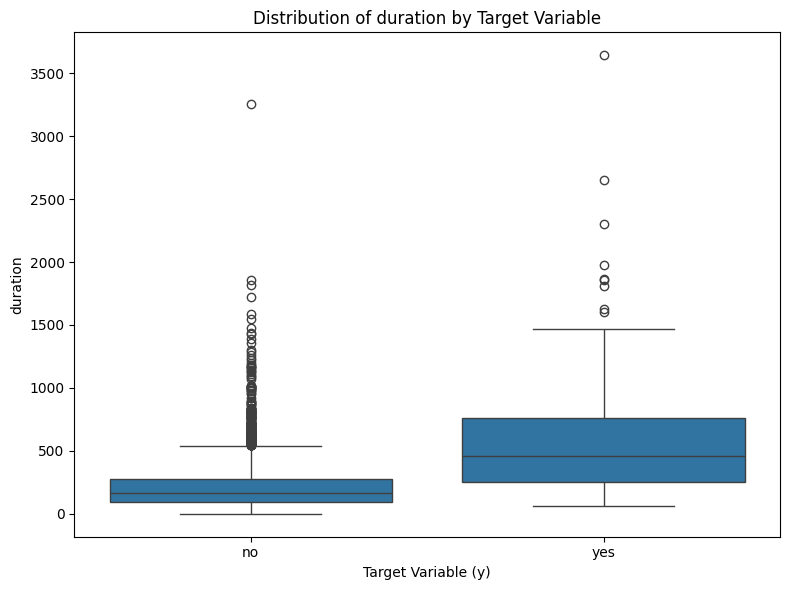

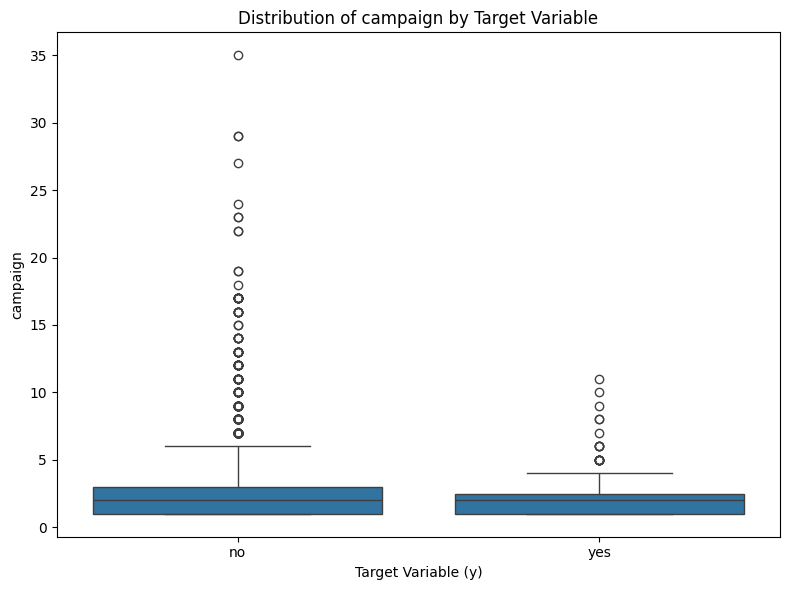

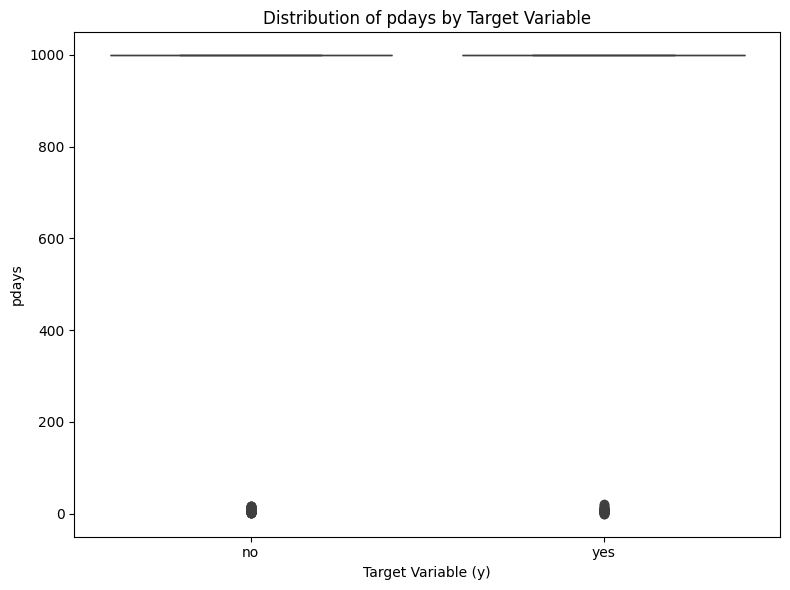

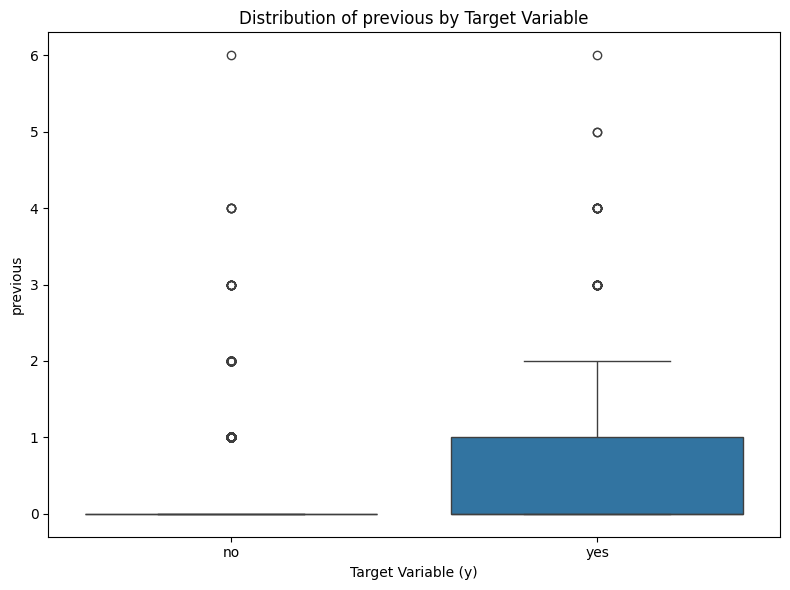

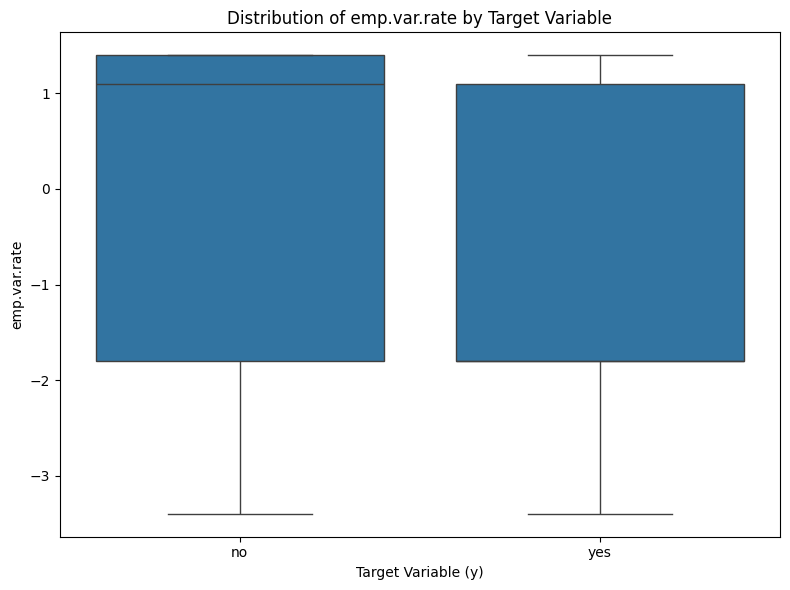

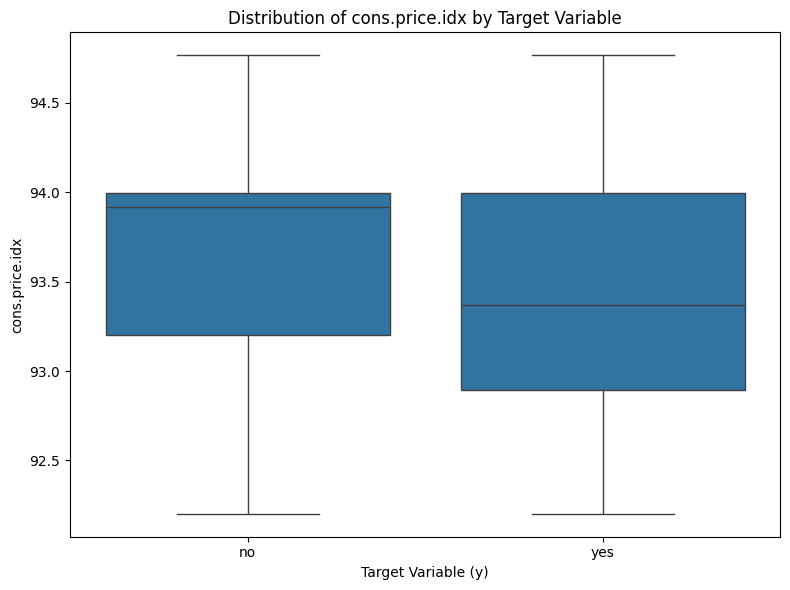

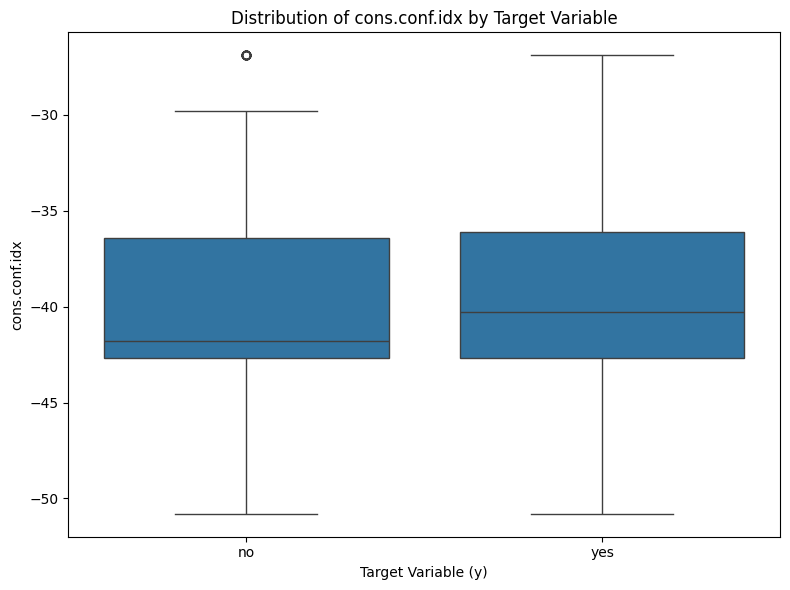

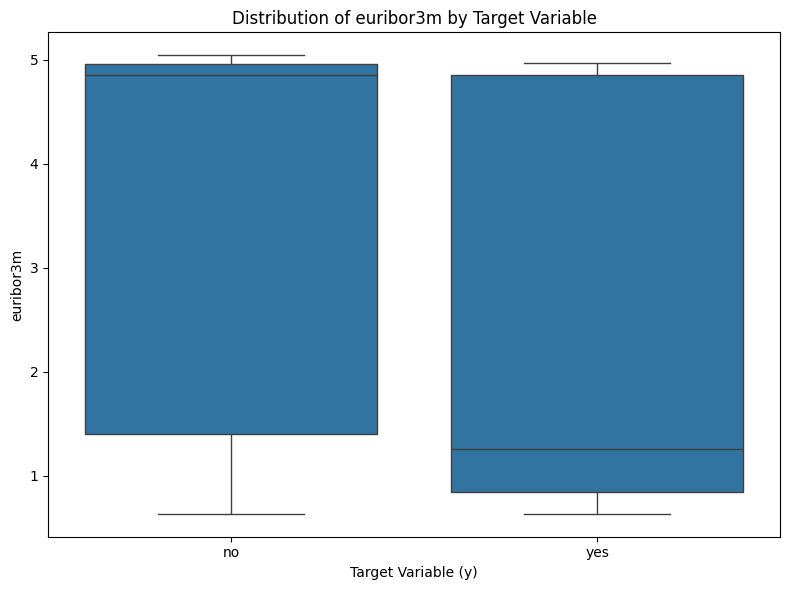

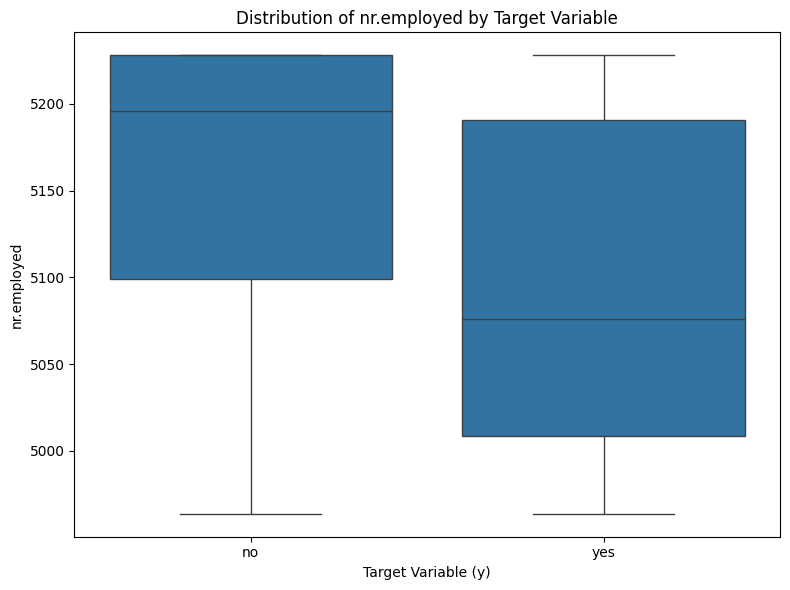

In [85]:
# Visualising the relationship between numerical features and the target variable using box plots
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='y', y=col, data=Bank)
    plt.title(f'Distribution of {col} by Target Variable')
    plt.xlabel('Target Variable (y)')
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

<Figure size 1000x600 with 0 Axes>

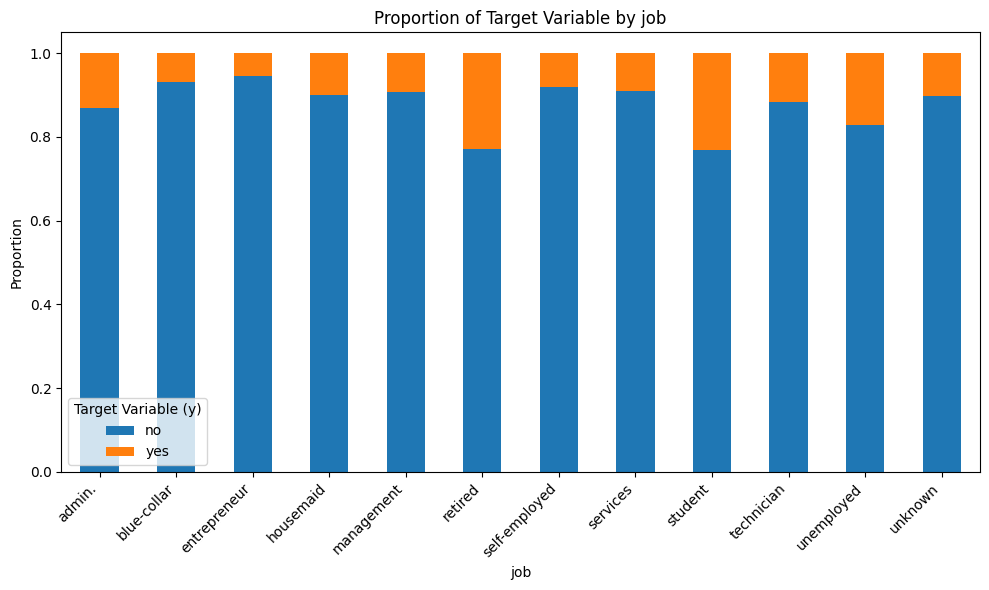

<Figure size 1000x600 with 0 Axes>

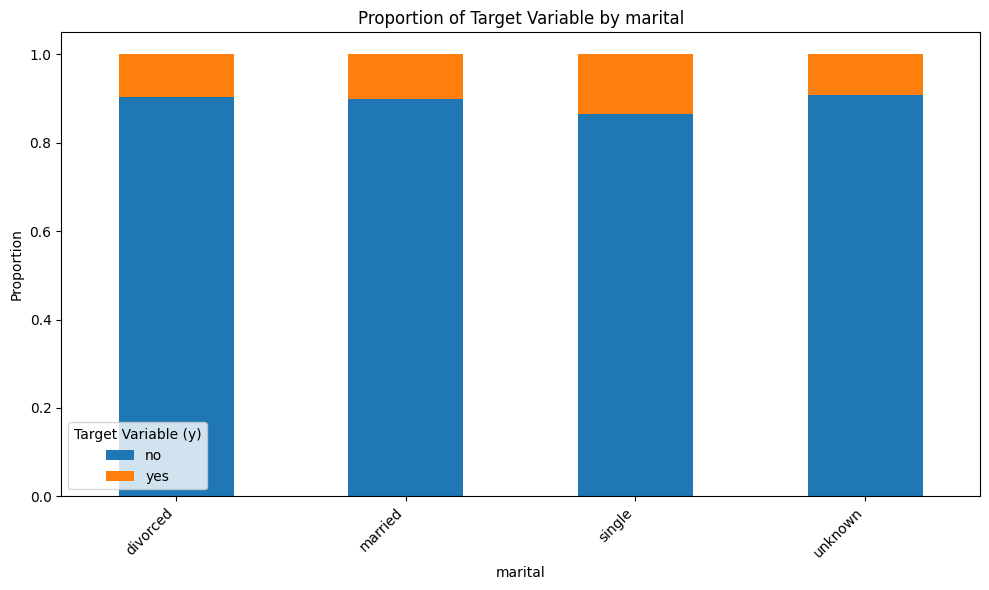

<Figure size 1000x600 with 0 Axes>

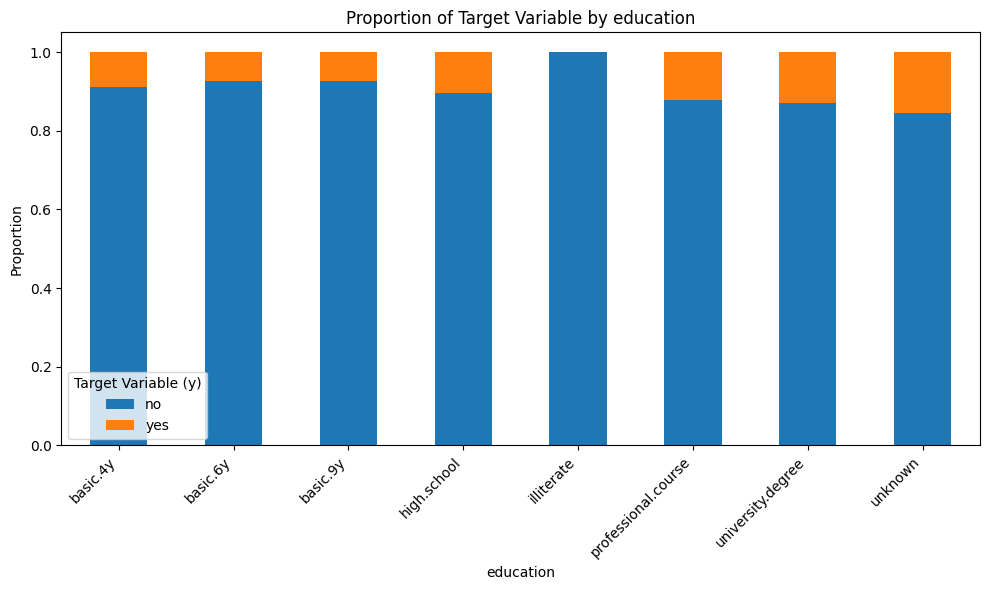

<Figure size 1000x600 with 0 Axes>

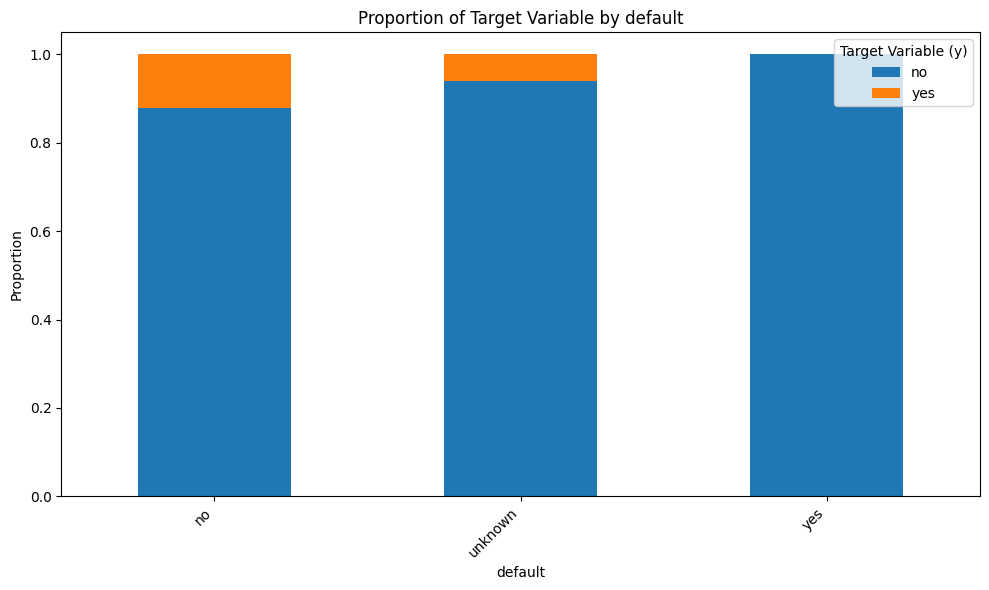

<Figure size 1000x600 with 0 Axes>

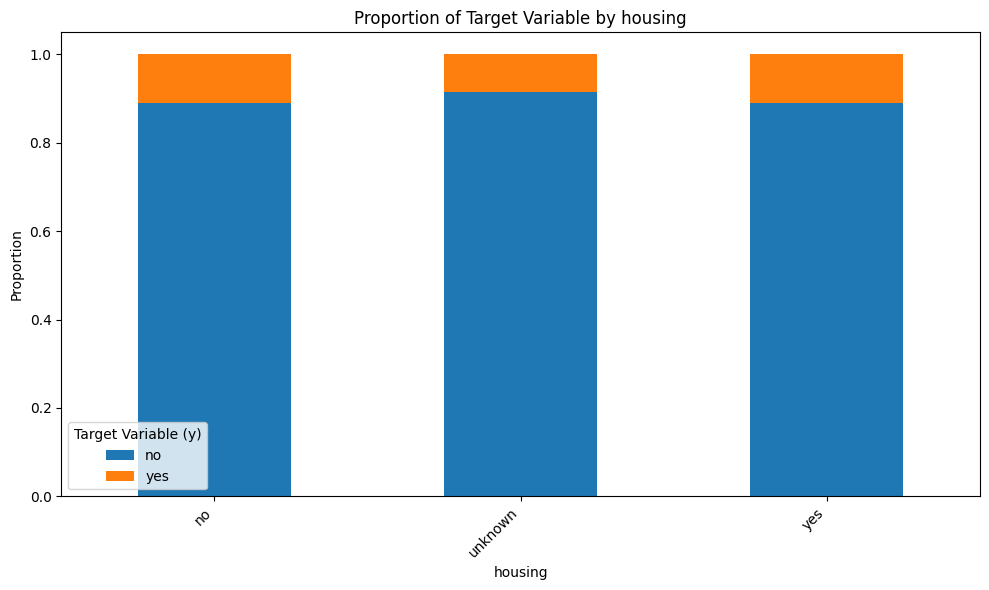

<Figure size 1000x600 with 0 Axes>

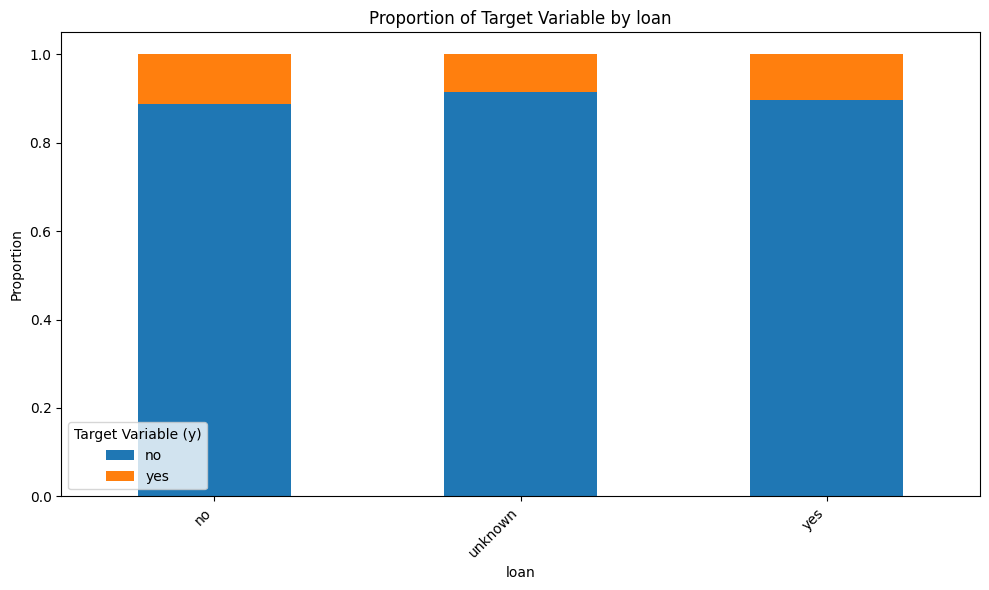

<Figure size 1000x600 with 0 Axes>

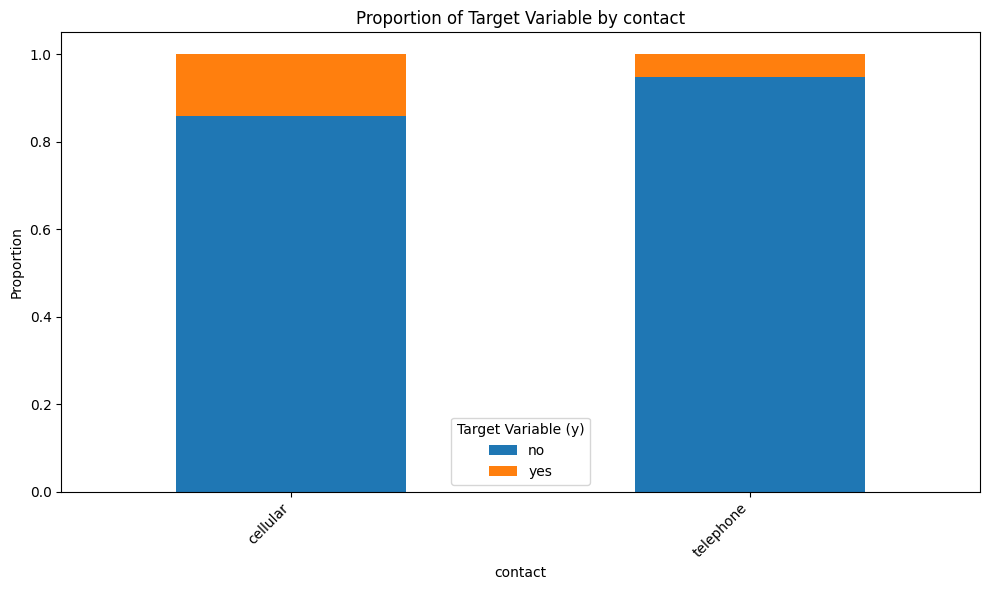

<Figure size 1000x600 with 0 Axes>

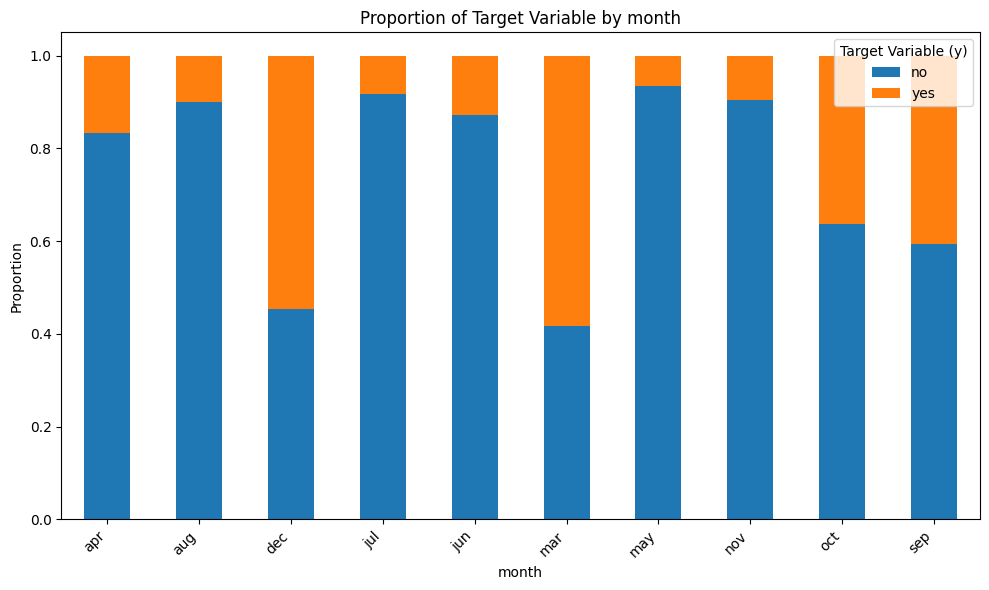

<Figure size 1000x600 with 0 Axes>

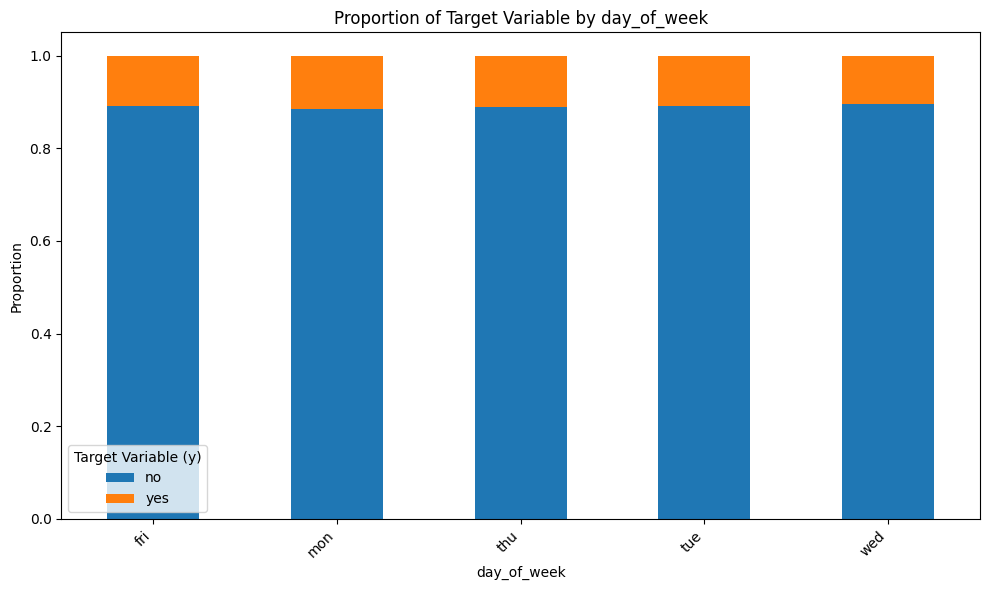

<Figure size 1000x600 with 0 Axes>

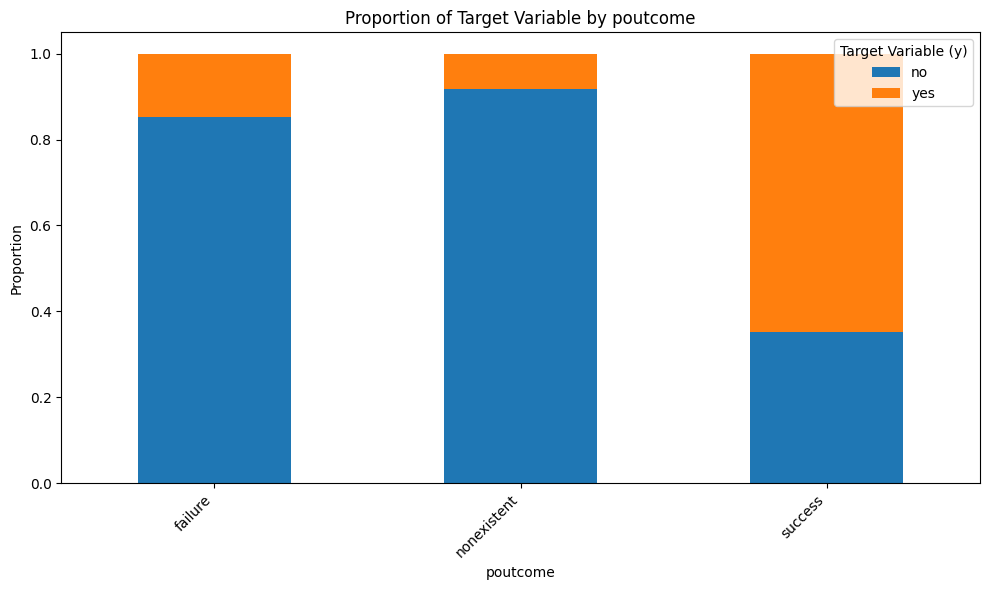

In [86]:
# Visualising the relationship between categorical features and the target variable using normalized stacked bar plots
for col in categorical_cols:
    # Creating a contingency table of the categorical column and the target variable
    contingency_table = pd.crosstab(Bank[col], Bank['y'])

    # Normalizing the contingency table to show proportions
    normalized_contingency_table = contingency_table.div(contingency_table.sum(axis=1), axis=0)

    # Plotting the normalized contingency table as a stacked bar plot
    plt.figure(figsize=(10, 6))
    normalized_contingency_table.plot(kind='bar', stacked=True, figsize=(10, 6))

    # Adding title, labels, and legend
    plt.title(f'Proportion of Target Variable by {col}')
    plt.xlabel(col)
    plt.ylabel('Proportion')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Target Variable (y)')
    plt.tight_layout()
    plt.show()

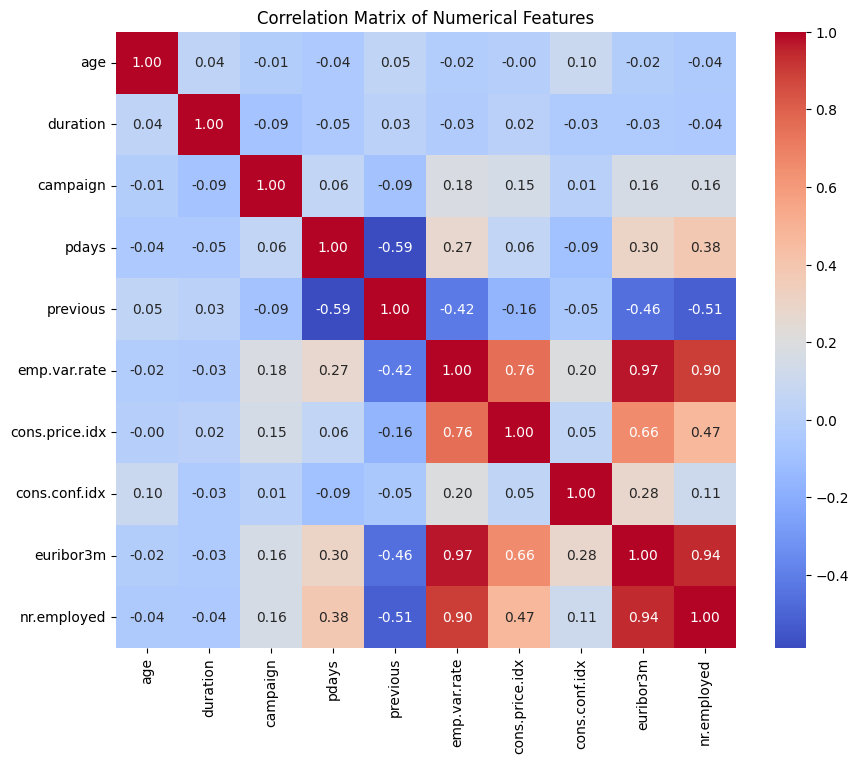

In [87]:
# Calculating the correlation matrix for numerical columns
correlation_matrix = Bank[numerical_cols].corr()

# Creating a heatmap of the correlation matrix.
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title to the heatmap.
plt.title('Correlation Matrix of Numerical Features')

# Displaying the heatmap.
plt.show()

In [88]:
# Preprocessing the data by separate features and target variable
X = Bank.drop('y', axis=1)
y = Bank['y']

In [89]:
# Defining categorical and numerical features
categorical_features = X.select_dtypes(include='object').columns
numerical_features = X.select_dtypes(include=np.number).columns

In [90]:
# Creating preprocessing pipelines for numerical and categorical features
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

In [91]:
# Combining preprocessing steps using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)])

In [92]:
# Creating a preprocessing and clustering pipeline
kmeans_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                  ('kmeans', KMeans(n_clusters=3, random_state=42, n_init=10))])

In [93]:
# Fitting the pipeline to the data
kmeans_pipeline.fit(X)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'],
      dtype='object'))])),
                ('kmeans', KMeans(n_clusters=3, n_init=10, random_state=42))])

In [94]:
# Getting the cluster labels
cluster_labels = kmeans_pipeline.named_steps['kmeans'].labels_

In [95]:
# Adding cluster labels to the original DataFrame
Bank['kmeans_cluster'] = cluster_labels

In [96]:
# Implementing Agglomerative Clustering
agglomerative_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('agglomerative', AgglomerativeClustering(n_clusters=3))])

In [97]:
# Setting the Agglomerative Clustering Pipeline
agglomerative_pipeline.fit(X)
agglomerative_cluster_labels = agglomerative_pipeline.named_steps['agglomerative'].labels_

In [98]:
# Adding the Clustering labels to the data
Bank['agglomerative_cluster'] = agglomerative_cluster_labels

In [99]:
# Implementing Gaussian Mixture Models
gmm_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('gmm', GaussianMixture(n_components=3, random_state=42))])

In [100]:
# Fitting the pipeline to the data
gmm_pipeline.fit(X)
gmm_cluster_labels = gmm_pipeline.predict(X)

In [101]:
# Adding clustering labels to the data
Bank['gmm_cluster'] = gmm_cluster_labels

In [102]:
# Display the first few rows with new cluster labels
display(Bank.head())

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,kmeans_cluster,agglomerative_cluster,gmm_cluster
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,...,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no,0,1,1
1,39,services,single,high.school,no,no,no,telephone,may,fri,...,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no,1,0,0
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,...,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no,1,0,0
3,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,...,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no,1,0,0
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,...,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no,1,0,0


In [103]:
# Evaluating clustering performance for all models
silhouette_kmeans = silhouette_score(preprocessor.transform(X), Bank['kmeans_cluster'])
calinski_harabasz_kmeans = calinski_harabasz_score(preprocessor.transform(X), Bank['kmeans_cluster'])
davies_bouldin_kmeans = davies_bouldin_score(preprocessor.transform(X), Bank['kmeans_cluster'])

silhouette_agglomerative = silhouette_score(preprocessor.transform(X), Bank['agglomerative_cluster'])
calinski_harabasz_agglomerative = calinski_harabasz_score(preprocessor.transform(X), Bank['agglomerative_cluster'])
davies_bouldin_agglomerative = davies_bouldin_score(preprocessor.transform(X), Bank['agglomerative_cluster'])

silhouette_gmm = silhouette_score(preprocessor.transform(X), Bank['gmm_cluster'])
calinski_harabasz_gmm = calinski_harabasz_score(preprocessor.transform(X), Bank['gmm_cluster'])
davies_bouldin_gmm = davies_bouldin_score(preprocessor.transform(X), Bank['gmm_cluster'])

In [104]:
# Printing models performance
print("K-Means Performance:")
print(f"  Silhouette Score: {silhouette_kmeans:.3f}")
print(f"  Calinski-Harabasz Index: {calinski_harabasz_kmeans:.3f}")
print(f"  Davies-Bouldin Index: {davies_bouldin_kmeans:.3f}")

print("\nAgglomerative Clustering Performance:")
print(f"  Silhouette Score: {silhouette_agglomerative:.3f}")
print(f"  Calinski-Harabasz Index: {calinski_harabasz_agglomerative:.3f}")
print(f"  Davies-Bouldin Index: {davies_bouldin_agglomerative:.3f}")

print("\nGaussian Mixture Models Performance:")
print(f"  Silhouette Score: {silhouette_gmm:.3f}")
print(f"  Calinski-Harabasz Index: {calinski_harabasz_gmm:.3f}")
print(f"  Davies-Bouldin Index: {davies_bouldin_gmm:.3f}")

K-Means Performance:
  Silhouette Score: 0.265
  Calinski-Harabasz Index: 941.930
  Davies-Bouldin Index: 1.481

Agglomerative Clustering Performance:
  Silhouette Score: 0.258
  Calinski-Harabasz Index: 897.407
  Davies-Bouldin Index: 1.488

Gaussian Mixture Models Performance:
  Silhouette Score: 0.251
  Calinski-Harabasz Index: 886.580
  Davies-Bouldin Index: 1.682


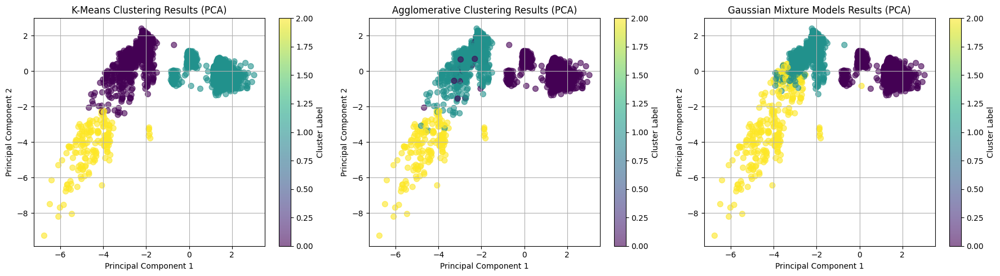

In [105]:
# Visualize the clusters for each model using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(preprocessor.transform(X))

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=Bank['kmeans_cluster'], cmap='viridis', marker='o', s=50, alpha=0.6)
plt.title('K-Means Clustering Results (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=Bank['agglomerative_cluster'], cmap='viridis', marker='o', s=50, alpha=0.6)
plt.title('Agglomerative Clustering Results (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=Bank['gmm_cluster'], cmap='viridis', marker='o', s=50, alpha=0.6)
plt.title('Gaussian Mixture Models Results (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.grid(True)

plt.tight_layout()
plt.show()

In [106]:
# Fitting DBSCAN
dbscan_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                  ('dbscan', DBSCAN(eps=1.0, min_samples=10))])
dbscan_pipeline.fit(X)
dbscan_labels = dbscan_pipeline.named_steps['dbscan'].labels_

In [107]:
# Adding DBSCAN labels to DataFrame
Bank['dbscan_cluster'] = dbscan_labels

In [108]:
# Printting total clusters and noise points
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise = list(dbscan_labels).count(-1)
print(f"\nDBSCAN found {n_clusters} clusters and {n_noise} noise points.")


DBSCAN found 0 clusters and 4119 noise points.


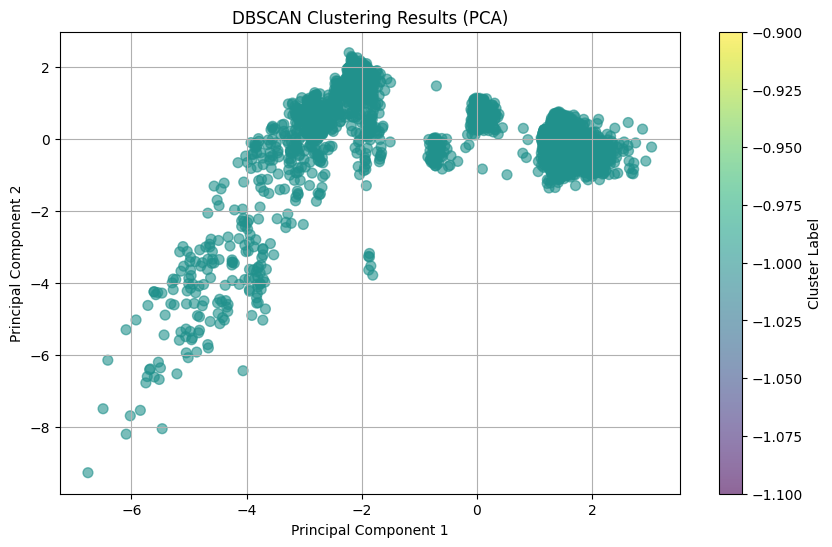

In [109]:
# Visualize the clusters for DBScan model using PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(preprocessor.transform(X))
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=Bank['dbscan_cluster'], cmap='viridis', marker='o', s=50, alpha=0.6)
plt.title('DBSCAN Clustering Results (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Label')
plt.grid(True)
plt.show()

In [110]:
# Defining function for Post-hoc Business Evaluation
def businessEvaluation(cluster_labels, y):
    df_eval = pd.DataFrame({'cluster': cluster_labels, 'y': y})
    df_eval['y'] = df_eval['y'].apply(lambda v: 1 if v == 'yes' else 0)

    baseline = df_eval['y'].mean()
    summary = df_eval.groupby('cluster').agg(
        size=('cluster', 'count'),
        responders=('y', 'sum')
    ).reset_index()

    summary['response_rate'] = summary['responders'] / summary['size']
    summary['lift_vs_baseline'] = summary['response_rate'] / baseline
    summary = summary.sort_values('lift_vs_baseline', ascending=False)

    print(f"\nBaseline conversion rate: {baseline:.3f}")
    return summary

In [111]:
# Evaluating business value for each clustering model
print("Business Evaluation (KMeans) ")
print(businessEvaluation(Bank['kmeans_cluster'], Bank['y']))

print("\n Business Evaluation (Agglomerative) ")
print(businessEvaluation(Bank['agglomerative_cluster'], Bank['y']))

print("\n Business Evaluation (GMM) ")
print(businessEvaluation(Bank['gmm_cluster'], Bank['y']))

print("\n Business Evaluation (DBSCAN) ")
print(businessEvaluation(Bank['dbscan_cluster'], Bank['y']))

Business Evaluation (KMeans) 

Baseline conversion rate: 0.109
   cluster  size  responders  response_rate  lift_vs_baseline
2        2   164         101       0.615854          5.624615
0        0  1185         217       0.183122          1.672463
1        1  2770         133       0.048014          0.438518

 Business Evaluation (Agglomerative) 

Baseline conversion rate: 0.109
   cluster  size  responders  response_rate  lift_vs_baseline
2        2   160         100       0.625000          5.708149
1        1  1146         187       0.163176          1.490295
0        0  2813         164       0.058301          0.532463

 Business Evaluation (GMM) 

Baseline conversion rate: 0.109
   cluster  size  responders  response_rate  lift_vs_baseline
2        2   268         131       0.488806          4.464283
1        1  1082         187       0.172828          1.578446
0        0  2769         133       0.048032          0.438676

 Business Evaluation (DBSCAN) 

Baseline conversion rate: 

## Profile the attributes and preferences of each segment


In [112]:
# Defining function for Performing Segment Profiling
def profileSegmentation(df, cluster_col):
    profiles = {}

    # Numeric summaries
    num_profiles = df.groupby(cluster_col)[numerical_features].mean().round(2)

    # Top categories
    cat_profiles = {}
    for col in categorical_features:
        top = df.groupby(cluster_col)[col].value_counts(normalize=True).groupby(level=0).head(1)
        cat_profiles[col] = top

    profiles['numeric'] = num_profiles
    profiles['categorical'] = cat_profiles
    return profiles

In [113]:
# Printing profile KMeans clusters
profiles_kmeans = profileSegmentation(Bank, 'kmeans_cluster')
print("Numeric Profiles of KMeans\n")
print(profiles_kmeans['numeric'])

Numeric Profiles of KMeans

                  age  duration  campaign   pdays  previous  emp.var.rate  \
kmeans_cluster                                                              
0               39.90    261.85      2.04  999.00      0.35         -2.02   
1               40.07    250.99      2.79  999.00      0.03          1.11   
2               42.37    318.20      1.80   30.09      1.82         -2.01   

                cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
kmeans_cluster                                                         
0                        93.01         -43.18       1.20      5076.19  
1                        93.83         -39.48       4.81      5213.45  
2                        93.42         -38.38       1.02      5025.65  


In [114]:
# Printing top categories of KMeans
print("Top Categories of KMeans ")
for col, top in profiles_kmeans['categorical'].items():
    print(f"\n{col}:")
    print(top)

Top Categories of KMeans 

job:
kmeans_cluster  job   
0               admin.    0.235443
1               admin.    0.244043
2               admin.    0.347561
Name: proportion, dtype: float64

marital:
kmeans_cluster  marital
0               married    0.555274
1               married    0.635740
2               married    0.548780
Name: proportion, dtype: float64

education:
kmeans_cluster  education        
0               university.degree    0.305485
1               university.degree    0.300722
2               university.degree    0.420732
Name: proportion, dtype: float64

default:
kmeans_cluster  default
0               no         0.884388
1               no         0.760289
2               no         0.981707
Name: proportion, dtype: float64

housing:
kmeans_cluster  housing
0               yes        0.562869
1               yes        0.509747
2               yes        0.585366
Name: proportion, dtype: float64

loan:
kmeans_cluster  loan
0               no      0.816034
1   

In [115]:
# Printing profile Agglomerative clusters
profiles_agglomerative = profileSegmentation(Bank, 'agglomerative_cluster')
print("Numeric Profiles of Agglomerative Clustering\n")
print(profiles_agglomerative['numeric'])

Numeric Profiles of Agglomerative Clustering

                         age  duration  campaign   pdays  previous  \
agglomerative_cluster                                                
0                      40.12    263.90      2.78  999.00      0.03   
1                      39.80    231.01      2.05  999.00      0.36   
2                      42.34    316.39      1.79    5.86      1.78   

                       emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  \
agglomerative_cluster                                                           
0                              1.06           93.82         -39.54       4.76   
1                             -2.02           93.01         -43.15       1.19   
2                             -2.02           93.41         -38.40       1.02   

                       nr.employed  
agglomerative_cluster               
0                          5211.44  
1                          5075.69  
2                          5026.46  


In [116]:
# Printing Top Categories of Agglomerative Clustering
print("Top Categories of Agglomerative Clustering ")
for col, top in profiles_agglomerative['categorical'].items():
    print(f"\n{col}:")
    print(top)

Top Categories of Agglomerative Clustering 

job:
agglomerative_cluster  job   
0                      admin.    0.243868
1                      admin.    0.235602
2                      admin.    0.350000
Name: proportion, dtype: float64

marital:
agglomerative_cluster  marital
0                      married    0.634554
1                      married    0.554974
2                      married    0.550000
Name: proportion, dtype: float64

education:
agglomerative_cluster  education        
0                      university.degree    0.299325
1                      university.degree    0.311518
2                      university.degree    0.406250
Name: proportion, dtype: float64

default:
agglomerative_cluster  default
0                      no         0.762887
1                      no         0.883072
2                      no         0.981250
Name: proportion, dtype: float64

housing:
agglomerative_cluster  housing
0                      yes        0.510132
1                      yes

In [117]:
# Printing profile GMM clusters
profiles_gmm = profileSegmentation(Bank, 'gmm_cluster')
print("\nNumeric Profiles of Gaussian Mixture Models\n")
print(profiles_gmm['numeric'])


Numeric Profiles of Gaussian Mixture Models

               age  duration  campaign   pdays  previous  emp.var.rate  \
gmm_cluster                                                              
0            40.07    251.06      2.79  999.00      0.03          1.11   
1            39.79    261.42      2.05  999.00      0.23         -2.01   
2            41.81    297.25      1.83  406.08      1.70         -2.04   

             cons.price.idx  cons.conf.idx  euribor3m  nr.employed  
gmm_cluster                                                         
0                     93.83         -39.48       4.81      5213.45  
1                     92.96         -43.64       1.23      5081.67  
2                     93.43         -38.37       0.98      5023.57  


In [118]:
# Printing Top Categories of Gaussian Mixture Models
print("Top Categories of Gaussian Mixture Models ")
for col, top in profiles_gmm['categorical'].items():
    print(f"\n{col}:")
    print(top)

Top Categories of Gaussian Mixture Models 

job:
gmm_cluster  job   
0            admin.    0.244131
1            admin.    0.239372
2            admin.    0.287313
Name: proportion, dtype: float64

marital:
gmm_cluster  marital
0            married    0.635970
1            married    0.560074
2            married    0.529851
Name: proportion, dtype: float64

education:
gmm_cluster  education        
0            university.degree    0.300831
1            university.degree    0.307763
2            university.degree    0.365672
Name: proportion, dtype: float64

default:
gmm_cluster  default
0            no         0.760202
1            no         0.875231
2            no         0.981343
Name: proportion, dtype: float64

housing:
gmm_cluster  housing
0            yes        0.509570
1            yes        0.567468
2            yes        0.559701
Name: proportion, dtype: float64

loan:
gmm_cluster  loan
0            no      0.810762
1            no      0.818854
2            no      0.

## Identify demographically, behaviorally, and transactionally significant customer segments


In [119]:
# Print the value counts for each cluster created by the K-Means model
print("Value counts for K-Means clusters:")
display(Bank['kmeans_cluster'].value_counts().sort_index())

Value counts for K-Means clusters:


,count
kmeans_cluster,
0,1185
1,2770
2,164


In [120]:
# Print the value counts for each cluster created by the Agglomerative Clustering model
print("\nValue counts for Agglomerative Clustering clusters:")
display(Bank['agglomerative_cluster'].value_counts().sort_index())


Value counts for Agglomerative Clustering clusters:


,count
agglomerative_cluster,
0,2813
1,1146
2,160


In [121]:
# Print the value counts for each cluster created by the Gaussian Mixture Models
print("\nValue counts for Gaussian Mixture Models clusters:")
display(Bank['gmm_cluster'].value_counts().sort_index())


Value counts for Gaussian Mixture Models clusters:


,count
gmm_cluster,
0,2769
1,1082
2,268


## Make recommendations for focused marketing programs


In [122]:
# Identify the high-response clusters based on the business evaluation results
print("Profiling of High-Response Segments:\n")

# KMeans High-Response Cluster (Cluster 2)
print("KMeans High-Response Segment (Cluster 2):")
print("\nNumeric Profile:")
display(profiles_kmeans['numeric'].loc[2])
print("\nTop Categories:")
for col in categorical_features:
    print(f"\n{col}:")
    # Filter the top categories for KMeans cluster 2
    top_kmeans_cluster_2 = profiles_kmeans['categorical'][col].loc[2]
    display(top_kmeans_cluster_2)

Profiling of High-Response Segments:

KMeans High-Response Segment (Cluster 2):

Numeric Profile:


,2
age,42.37
duration,318.20
campaign,1.80
pdays,30.09
previous,1.82
emp.var.rate,-2.01
cons.price.idx,93.42
cons.conf.idx,-38.38
euribor3m,1.02
nr.employed,5025.65



Top Categories:

job:


,proportion
job,
admin.,0.347561



marital:


,proportion
marital,
married,0.54878



education:


,proportion
education,
university.degree,0.420732



default:


,proportion
default,
no,0.981707



housing:


,proportion
housing,
yes,0.585366



loan:


,proportion
loan,
no,0.829268



contact:


,proportion
contact,
cellular,0.932927



month:


,proportion
month,
aug,0.176829



day_of_week:


,proportion
day_of_week,
mon,0.237805



poutcome:


,proportion
poutcome,
success,0.865854


In [123]:
# Agglomerative High-Response Cluster (Cluster 2)
print("\nAgglomerative High-Response Segment (Cluster 2):")
print("\nNumeric Profile:")
display(profiles_agglomerative['numeric'].loc[2])
print("\nTop Categories:")
for col in categorical_features:
    print(f"\n{col}:")
    # Filter the top categories for Agglomerative cluster 2
    top_agglomerative_cluster_2 = profiles_agglomerative['categorical'][col].loc[2]
    display(top_agglomerative_cluster_2)


Agglomerative High-Response Segment (Cluster 2):

Numeric Profile:


,2
age,42.34
duration,316.39
campaign,1.79
pdays,5.86
previous,1.78
emp.var.rate,-2.02
cons.price.idx,93.41
cons.conf.idx,-38.40
euribor3m,1.02
nr.employed,5026.46



Top Categories:

job:


,proportion
job,
admin.,0.35



marital:


,proportion
marital,
married,0.55



education:


,proportion
education,
university.degree,0.40625



default:


,proportion
default,
no,0.98125



housing:


,proportion
housing,
yes,0.58125



loan:


,proportion
loan,
no,0.825



contact:


,proportion
contact,
cellular,0.93125



month:


,proportion
month,
aug,0.175



day_of_week:


,proportion
day_of_week,
tue,0.2375



poutcome:


,proportion
poutcome,
success,0.8875


In [124]:
# GMM High-Response Cluster (Cluster 2)
print("\nGaussian Mixture Models High-Response Segment (Cluster 2):")
print("\nNumeric Profile:")
display(profiles_gmm['numeric'].loc[2])
print("\nTop Categories:")
for col in categorical_features:
    print(f"\n{col}:")
    # Filter the top categories for GMM cluster 2
    top_gmm_cluster_2 = profiles_gmm['categorical'][col].loc[2]
    display(top_gmm_cluster_2)


Gaussian Mixture Models High-Response Segment (Cluster 2):

Numeric Profile:


,2
age,41.81
duration,297.25
campaign,1.83
pdays,406.08
previous,1.70
emp.var.rate,-2.04
cons.price.idx,93.43
cons.conf.idx,-38.37
euribor3m,0.98
nr.employed,5023.57



Top Categories:

job:


,proportion
job,
admin.,0.287313



marital:


,proportion
marital,
married,0.529851



education:


,proportion
education,
university.degree,0.365672



default:


,proportion
default,
no,0.981343



housing:


,proportion
housing,
yes,0.559701



loan:


,proportion
loan,
no,0.813433



contact:


,proportion
contact,
cellular,0.929104



month:


,proportion
month,
aug,0.145522



day_of_week:


,proportion
day_of_week,
mon,0.246269



poutcome:


,proportion
poutcome,
success,0.529851


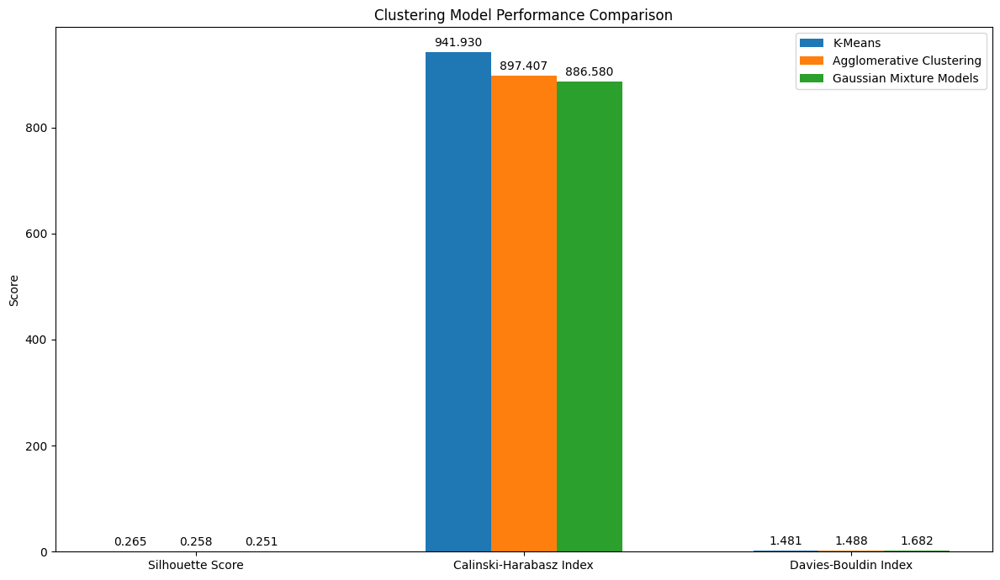

In [125]:
# Plotting clustering performance metrics
metrics = ['Silhouette Score', 'Calinski-Harabasz Index', 'Davies-Bouldin Index']
kmeans_scores = [silhouette_kmeans, calinski_harabasz_kmeans, davies_bouldin_kmeans]
agglomerative_scores = [silhouette_agglomerative, calinski_harabasz_agglomerative, davies_bouldin_agglomerative]
gmm_scores = [silhouette_gmm, calinski_harabasz_gmm, davies_bouldin_gmm]
x = np.arange(len(metrics))  # the label locations
width = 0.2  # the width of the bars
fig, ax = plt.subplots(figsize=(12, 7))
rects1 = ax.bar(x - width, kmeans_scores, width, label='K-Means')
rects2 = ax.bar(x, agglomerative_scores, width, label='Agglomerative Clustering')
rects3 = ax.bar(x + width, gmm_scores, width, label='Gaussian Mixture Models')

# Adding some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Score')
ax.set_title('Clustering Model Performance Comparison')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('%.3f' % height,
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')
autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
fig.tight_layout()
plt.show()